# 1. Observation des données et preprocessing (Kaggle)

## 1.1 Imports et fonctions d'analyse et de preprocessing

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure

# ----------------------------------------------------
import sklearn
import scipy
import statsmodels.api as sm 
from scipy.stats import shapiro

# ----------------------------------------------------
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import MinMaxScaler, FunctionTransformer

# ----------------------------------------------------
from imblearn.pipeline import make_pipeline, Pipeline

# ----------------------------------------------------
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# ----------------------------------------------------
import warnings
warnings.filterwarnings("ignore")

In [3]:
def outlier_detect(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    return df[((df[col] < (q1_col - 1.5 * iqr_col)) |(df[col] > (q3_col + 1.5 * iqr_col)))]

# ----------------------------------------------------------
def lower_outlier(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    lower = df[(df[col] < (q1_col - 1.5 * iqr_col))]
    return lower

# ----------------------------------------------------------
def upper_outlier(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    upper = df[(df[col] > (q3_col + 1.5 * iqr_col))]
    return upper

# ----------------------------------------------------------
def show_num_col(df, col):
    print("*********************** {} ***********************\n".format(col))
    print("lower outlier: {} ****** upper outlier: {}\n".format(lower_outlier(df,col).shape[0], 
                                                                upper_outlier(df,col).shape[0]))
    plt.figure(figsize=(10,8))
    plt.subplot(2,1,1)
    df[col].plot(kind='box', subplots=True, sharex=False, vert=False)
    plt.subplot(2,1,2)
    df[col].plot(kind='density', subplots=True, sharex=False)
    plt.show()

# ----------------------------------------------------------
def show_cat_col(df, col):
    print("******************** {} ********************\n".format(col))
    df[col].value_counts().plot(kind='bar')
    plt.xticks(rotation='vertical')
    plt.show()
    
# ----------------------------------------------------------
def replace_upper(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    tmp = 9999999
    upper = q3_col + 1.5 * iqr_col
    df[col] = df[col].where(lambda x: (x < (upper)), tmp)
    df[col] = df[col].replace(tmp, upper)

# ----------------------------------------------------------
def replace_lower(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    tmp = 1111111
    lower = q1_col - 1.5 * iqr_col
    df[col] = df[col].where(lambda x: (x > (lower)), tmp)
    df[col] = df[col].replace(tmp, lower)

# ----------------------------------------------------------
def replace_mode(df, col):
    df[col] = df[col].fillna(df[col].mode()[0])
    print("NaN de {} remplacés par le mode {}".format(col, df[col].mode()[0]))

# ----------------------------------------------------------
def replace_mean(df, col):
    df[col] = df[col].fillna(df[col].mean())
    print("NaN de {} remplacés par la moyenne {}".format(col, df[col].mean()))

In [2]:
train = pd.read_csv("application_train.csv")
test = pd.read_csv("application_test.csv")

## 1.2 Observation des données déséquilibrées

0    282686
1     24825
Name: TARGET, dtype: int64

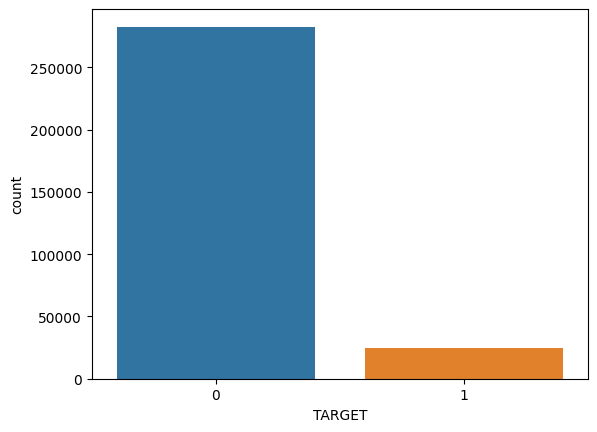

In [6]:
sns.countplot(x = "TARGET", data = train)
train.loc[:, 'TARGET'].value_counts()

In [7]:
len(train[train['TARGET']==0])/len(train)

0.9192711805431351

Données déséquilibrées : un peu plus de 8% de "mauvais payeurs".

## 1.3 Supression de features et catégorisation

In [8]:
threshold_train = len(train) * 0.60
int(threshold_train)

184506

In [9]:
threshold_test = len(test) * 0.60
int(threshold_test)

29246

In [10]:
print("Train:\n")
print(train.columns[train.isna().sum() > int(threshold_train)])
print("******************************************")
print("Test:\n")
print(test.columns[test.isna().sum() > int(threshold_test)])

Train:

Index(['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG',
       'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'FONDKAPREMONT_MODE'],
      dtype='object')
******************************************
Test:

Index(['OWN_CAR_AGE', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'FLOORSMIN_AVG',
       'LIVINGAPARTMENTS_AVG', 'NONLIVINGAPARTMENTS_AVG', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'FLOORSMIN_MODE', 'LIVINGAPARTMENTS_MODE',
       'NONLIVINGAPARTMENTS_MODE', 'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI',
       'FLOORSMIN_MEDI', 'LIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'FONDKAPREMONT_MODE'],
      dtype='object')


In [11]:
# On restreint les features à celles qui sont renseignées pour plus de 60% des clients

train_new = train.dropna(axis=1, thresh=threshold_train)
print(train_new.shape)
print("******************************************")
test_new = test.dropna(axis=1, thresh=threshold_test)
print(test_new.shape)

(307511, 73)
******************************************
(48744, 72)


On sépare les features par types.

In [12]:
numeric_feature = train_new.dtypes!=object
final_numeric_feature = train_new.columns[numeric_feature].tolist()

#----------------------------------------------------
numeric_feature_test = test_new.dtypes!=object
final_numeric_feature_test = test_new.columns[numeric_feature_test].tolist()

In [13]:
numeric = train_new[final_numeric_feature]

#-------------------------------------------
numeric_test = test_new[final_numeric_feature_test]

In [14]:
discrete_features = numeric.dtypes==np.int64
final_discrete_feature = numeric.columns[discrete_features].tolist()
discrete = numeric[final_discrete_feature]

#-------------------------------------------
discrete_features_test = numeric_test.dtypes==np.int64
final_discrete_feature_test = numeric_test.columns[discrete_features_test].tolist()
discrete_test = numeric_test[final_discrete_feature_test]

In [15]:
continuous_features = numeric.dtypes==np.float64
final_continuous_feature = numeric.columns[continuous_features].tolist()
continuous = numeric[final_continuous_feature]

#-------------------------------------------
continuous_features_test = numeric_test.dtypes==np.float64
final_continuous_feature_test = numeric_test.columns[continuous_features_test].tolist()
continuous_test = numeric_test[final_continuous_feature_test]

In [16]:
continuous_col = continuous.columns

## 1.4 Remplacement des valeurs nulles et des outliers

*********************** AMT_INCOME_TOTAL ***********************

lower outlier: 0 ****** upper outlier: 14035



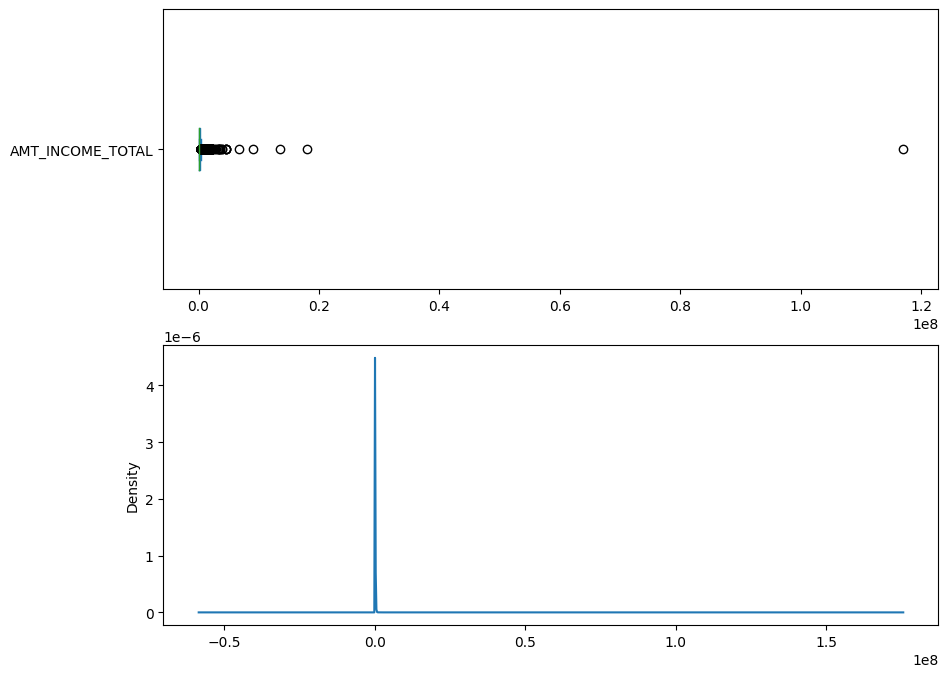

*********************** AMT_CREDIT ***********************

lower outlier: 0 ****** upper outlier: 6562



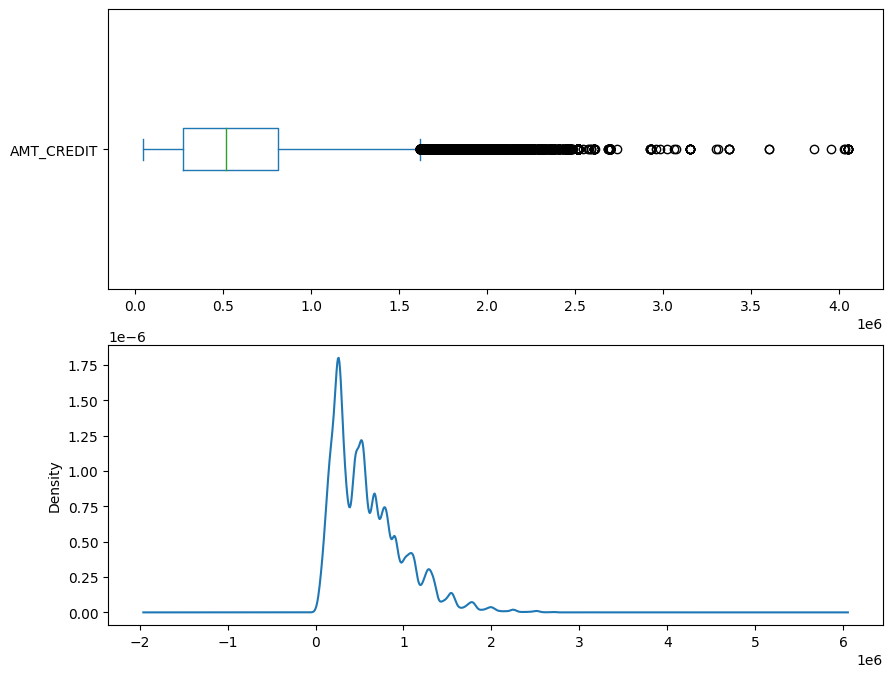

*********************** AMT_ANNUITY ***********************

lower outlier: 0 ****** upper outlier: 7504



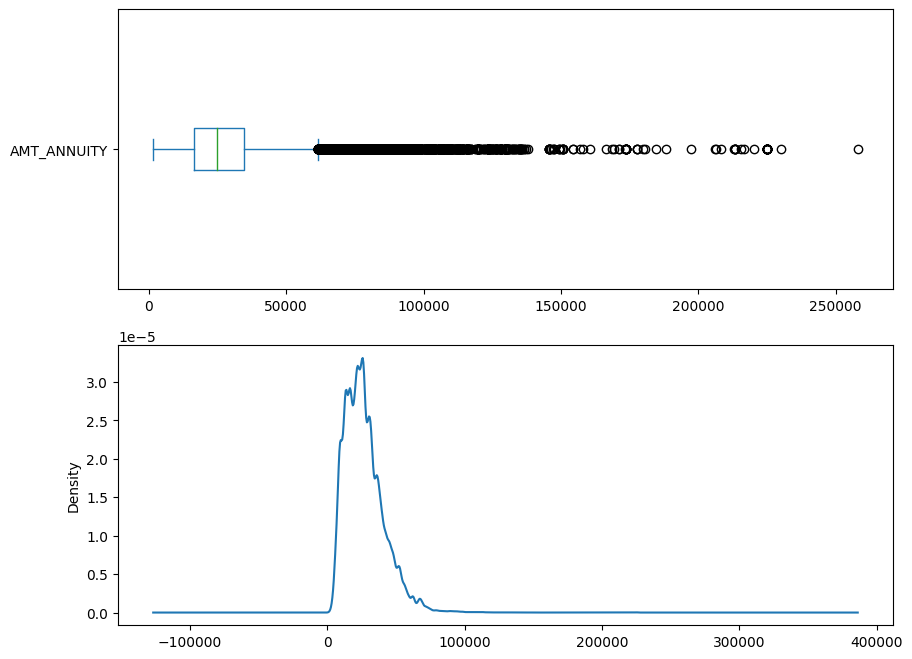

*********************** AMT_GOODS_PRICE ***********************

lower outlier: 0 ****** upper outlier: 14728



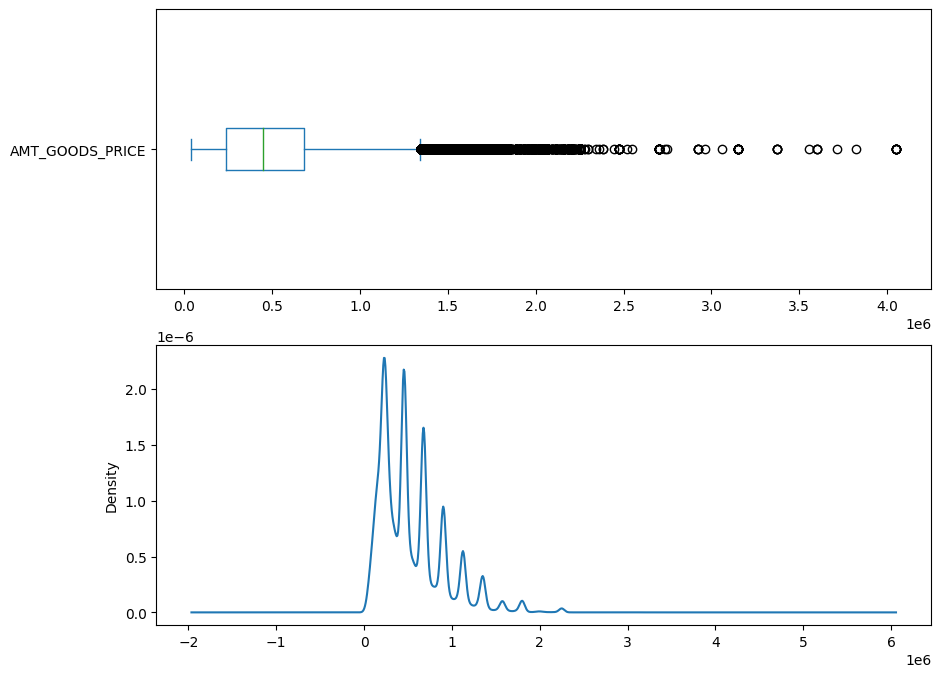

*********************** REGION_POPULATION_RELATIVE ***********************

lower outlier: 0 ****** upper outlier: 8412



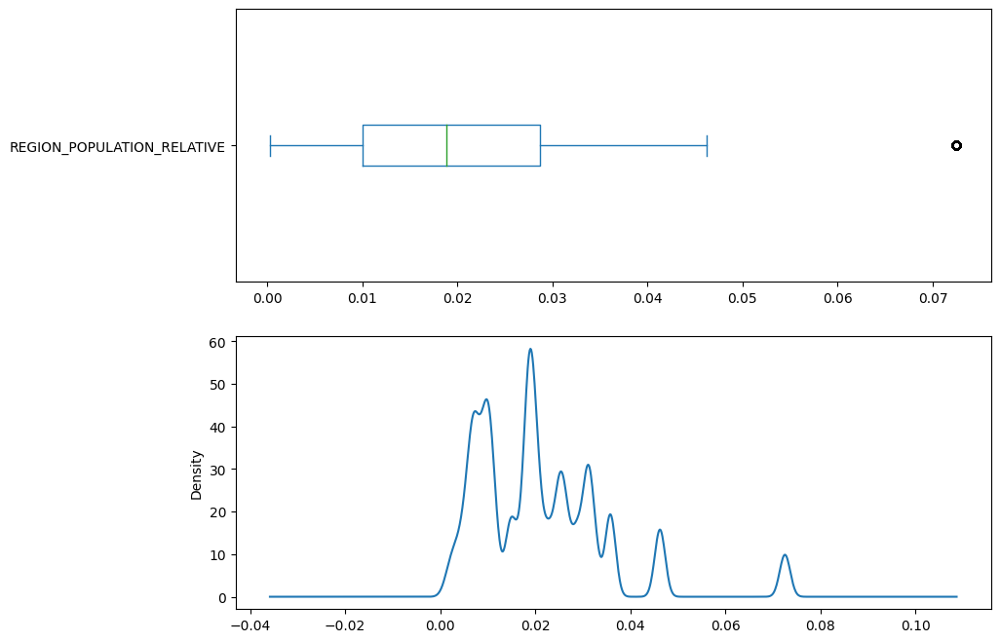

*********************** DAYS_REGISTRATION ***********************

lower outlier: 659 ****** upper outlier: 0



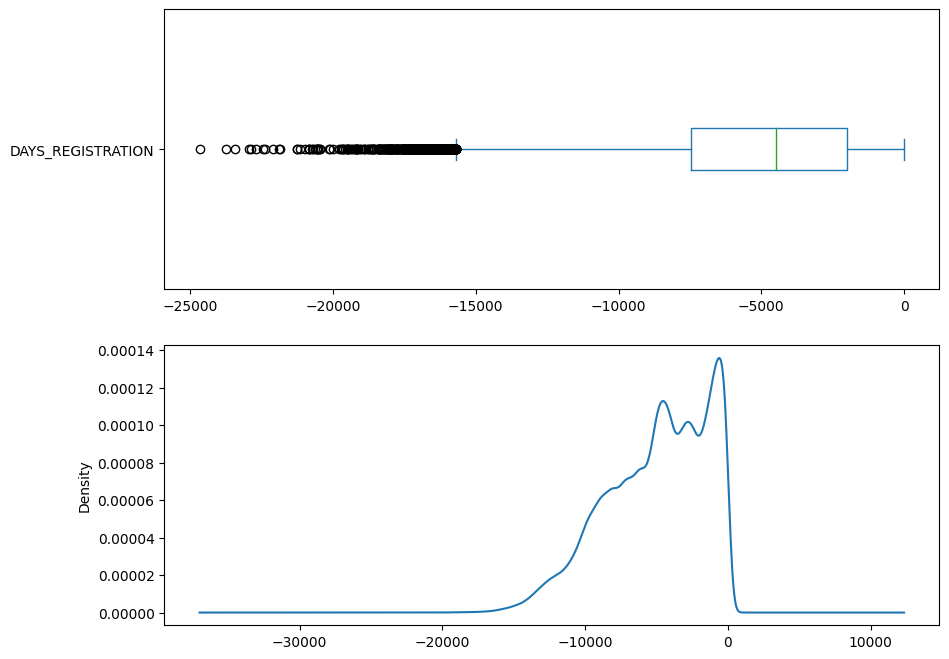

*********************** CNT_FAM_MEMBERS ***********************

lower outlier: 0 ****** upper outlier: 4007



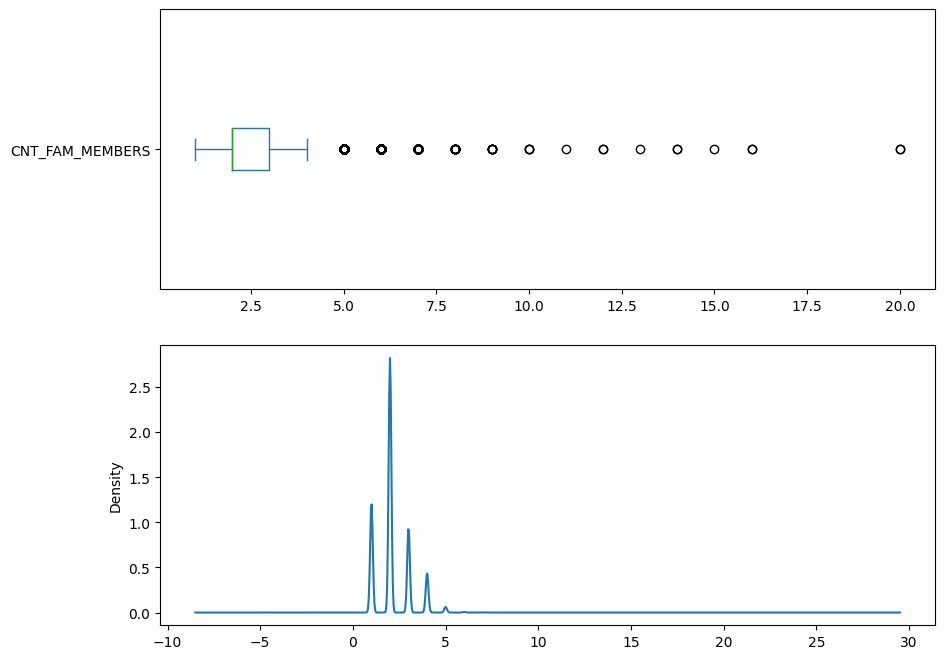

*********************** EXT_SOURCE_2 ***********************

lower outlier: 0 ****** upper outlier: 0



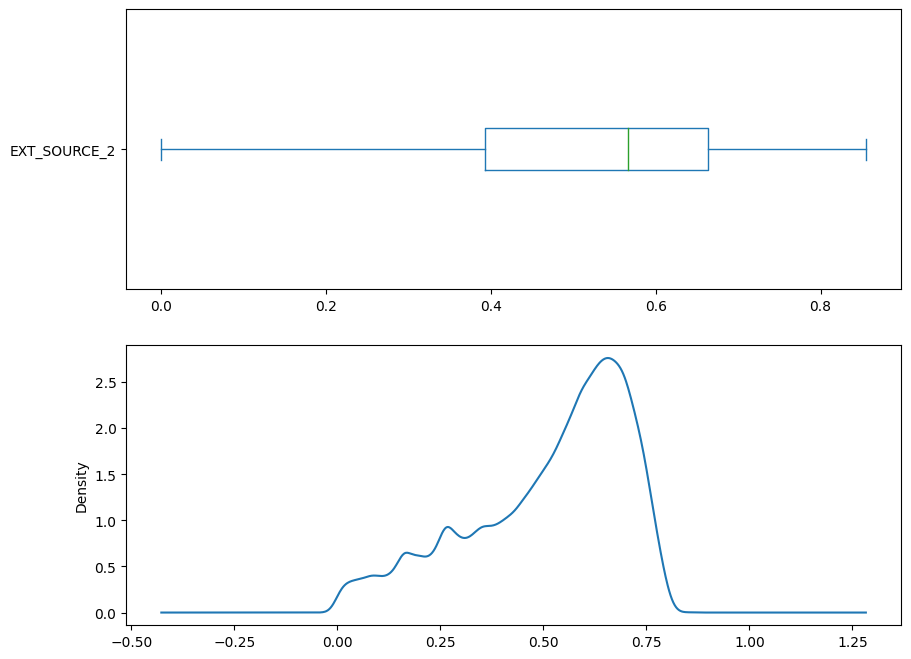

*********************** EXT_SOURCE_3 ***********************

lower outlier: 0 ****** upper outlier: 0



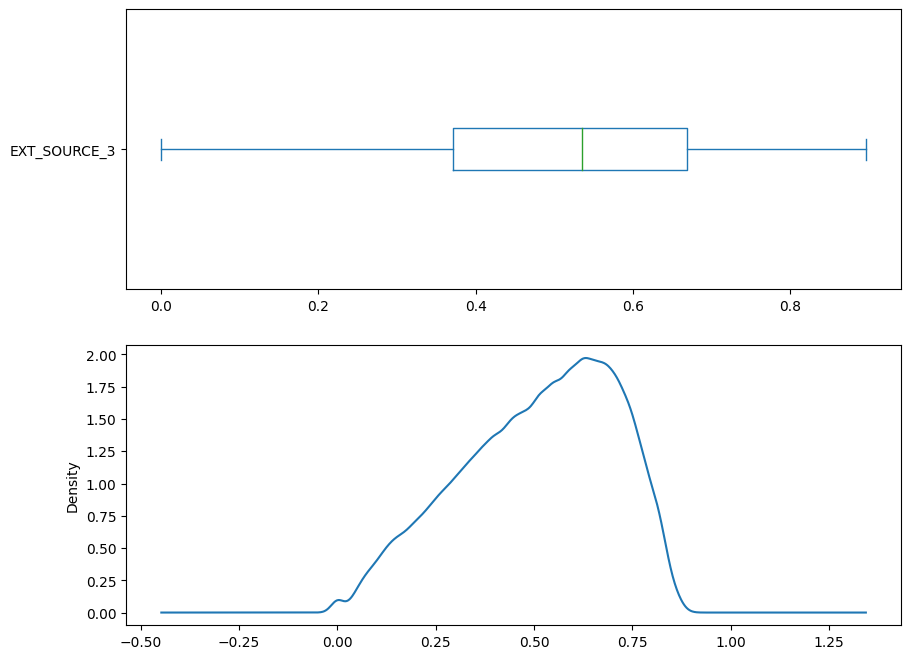

*********************** OBS_30_CNT_SOCIAL_CIRCLE ***********************

lower outlier: 0 ****** upper outlier: 19971



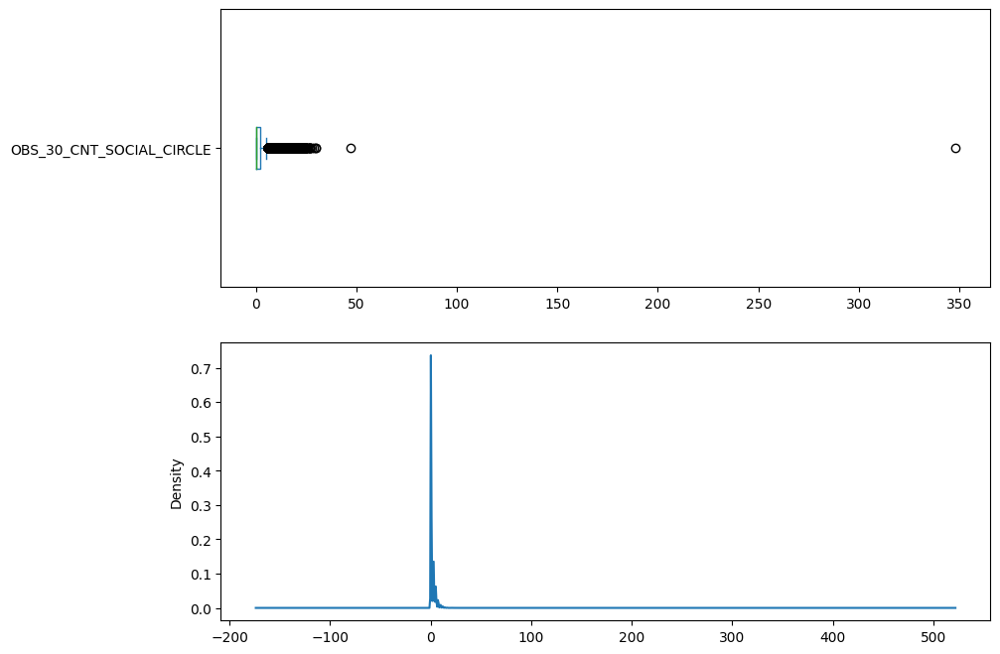

*********************** DEF_30_CNT_SOCIAL_CIRCLE ***********************

lower outlier: 0 ****** upper outlier: 35166



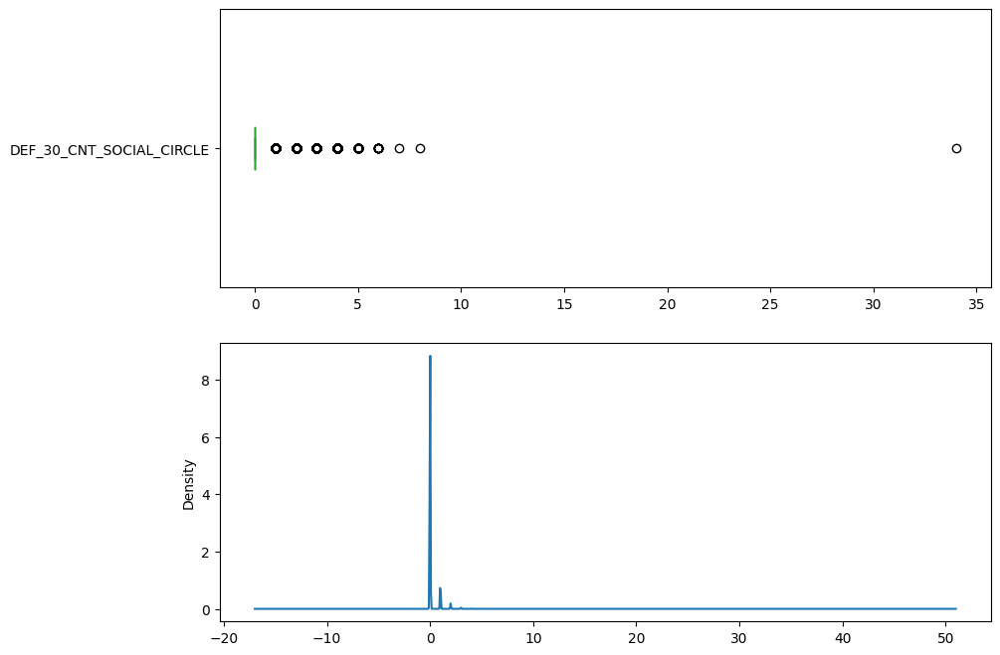

*********************** OBS_60_CNT_SOCIAL_CIRCLE ***********************

lower outlier: 0 ****** upper outlier: 19564



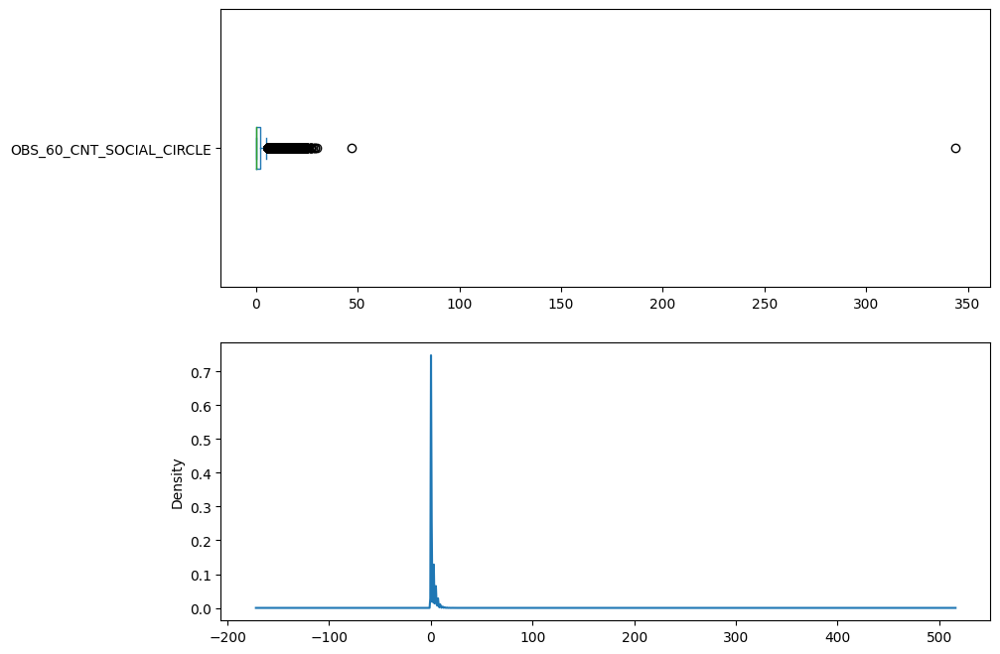

*********************** DEF_60_CNT_SOCIAL_CIRCLE ***********************

lower outlier: 0 ****** upper outlier: 25769



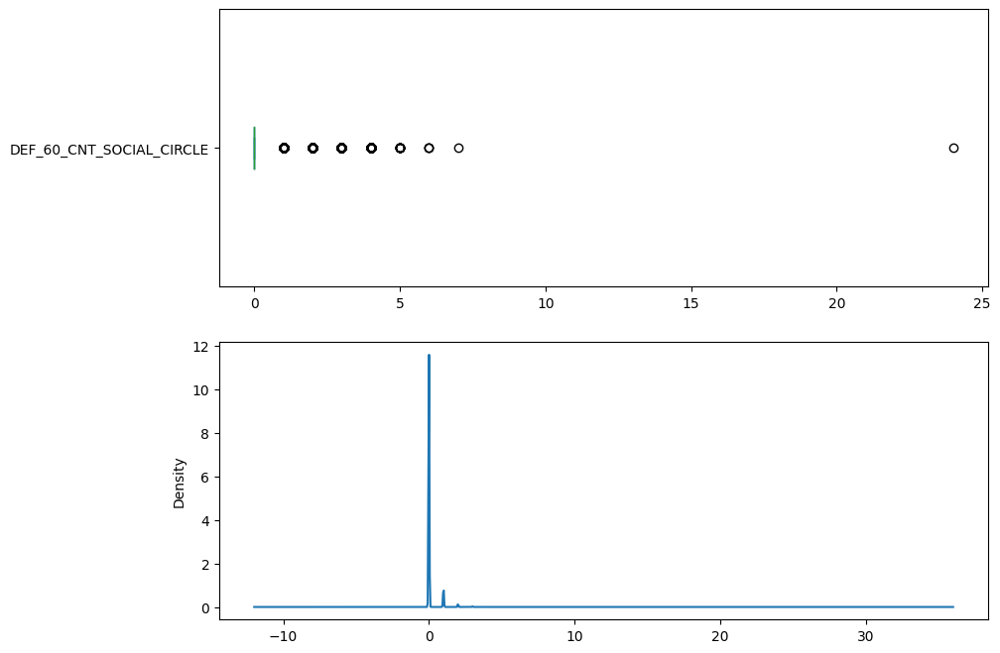

*********************** DAYS_LAST_PHONE_CHANGE ***********************

lower outlier: 435 ****** upper outlier: 0



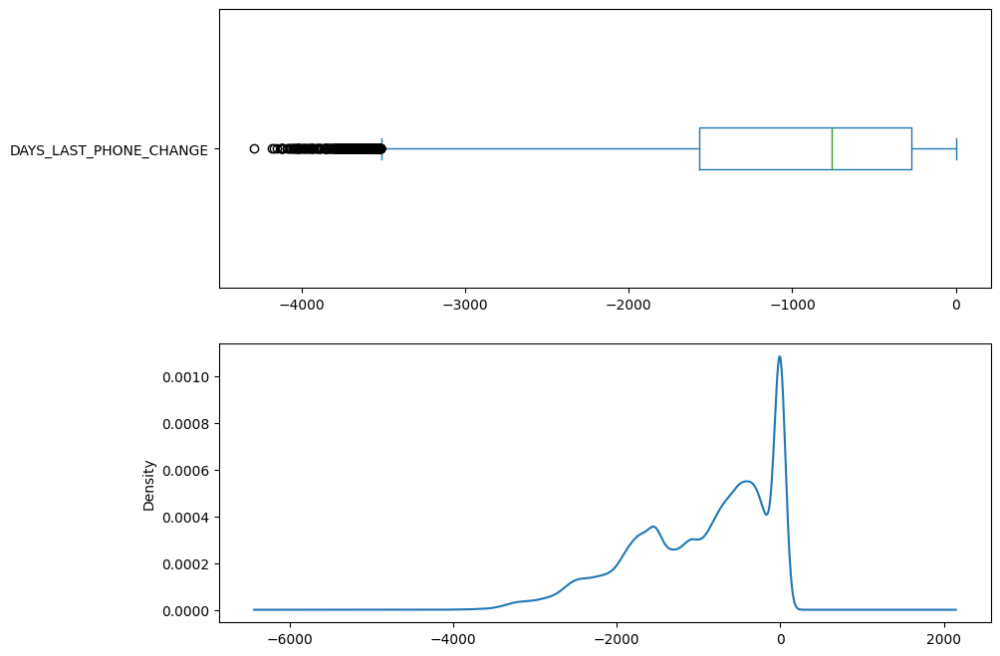

*********************** AMT_REQ_CREDIT_BUREAU_HOUR ***********************

lower outlier: 0 ****** upper outlier: 1626



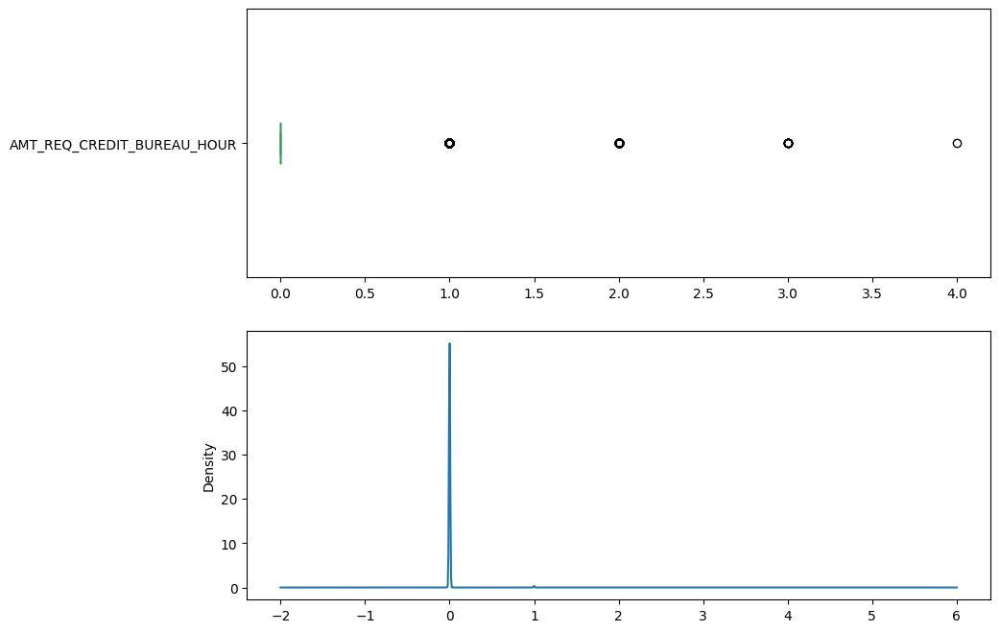

*********************** AMT_REQ_CREDIT_BUREAU_DAY ***********************

lower outlier: 0 ****** upper outlier: 1489



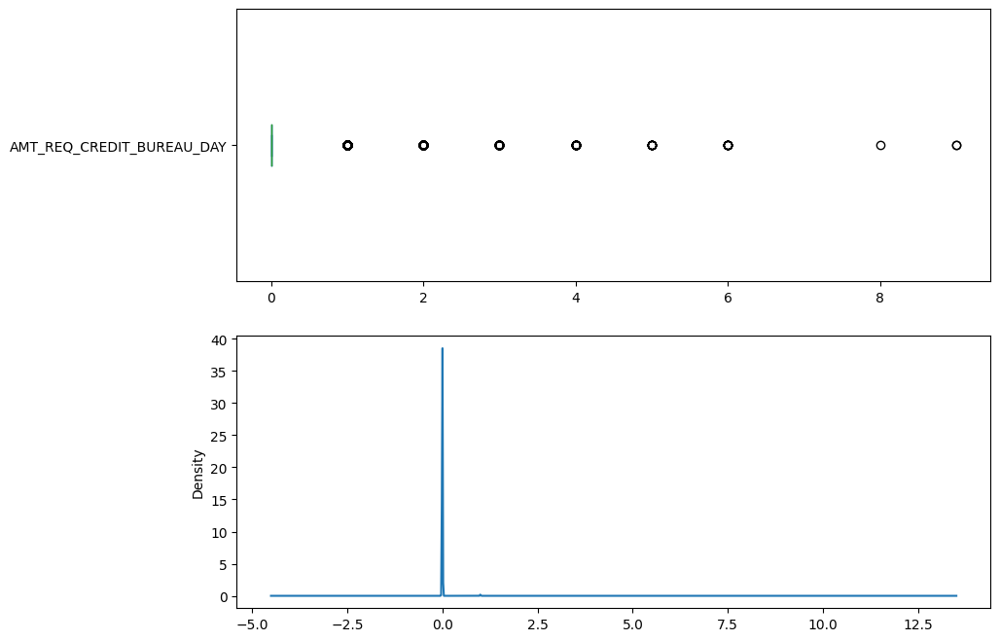

*********************** AMT_REQ_CREDIT_BUREAU_WEEK ***********************

lower outlier: 0 ****** upper outlier: 8536



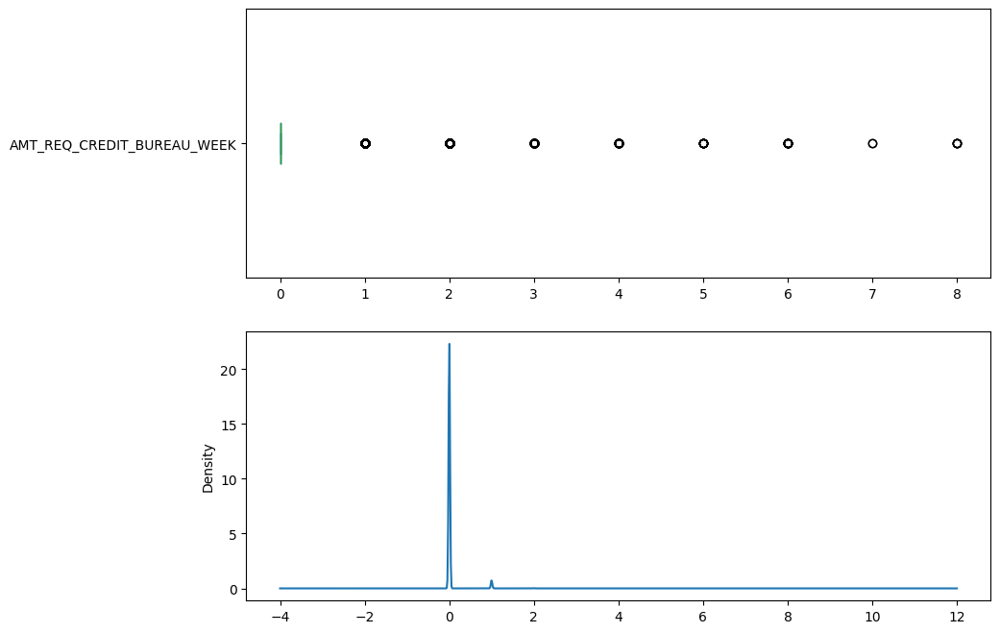

*********************** AMT_REQ_CREDIT_BUREAU_MON ***********************

lower outlier: 0 ****** upper outlier: 43759



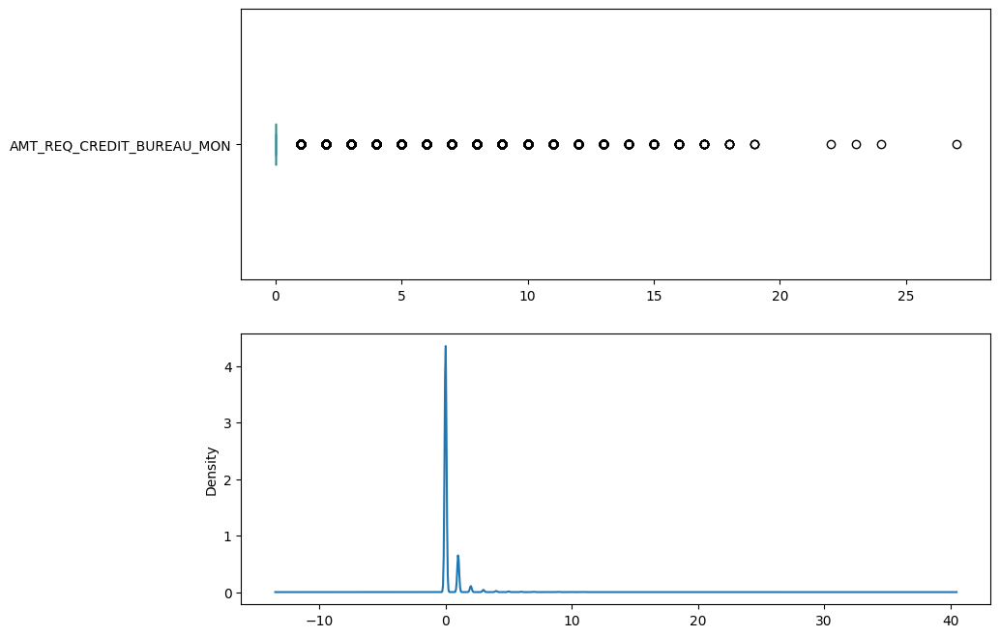

*********************** AMT_REQ_CREDIT_BUREAU_QRT ***********************

lower outlier: 0 ****** upper outlier: 50575



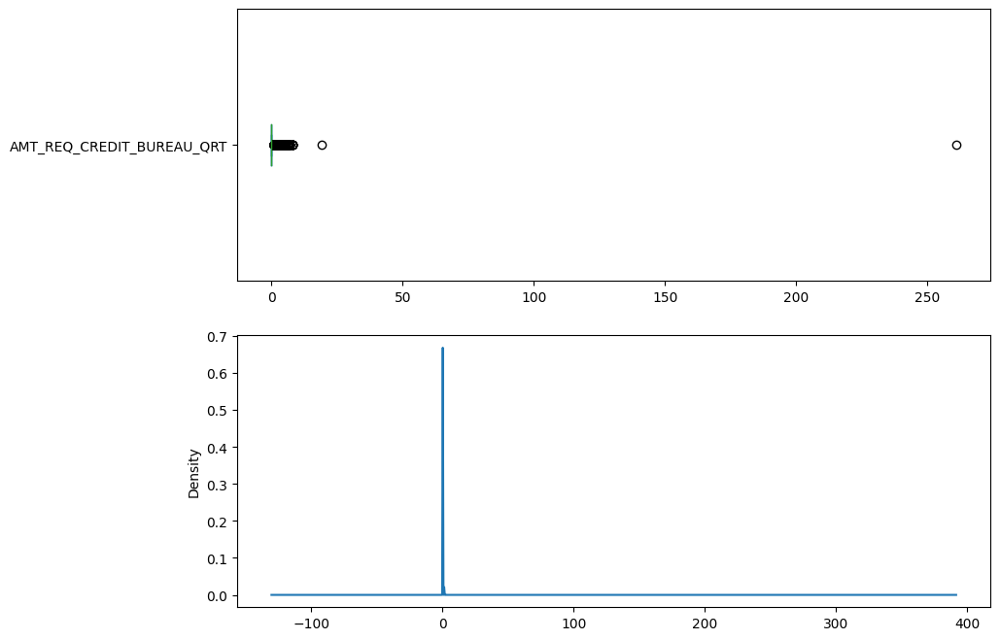

*********************** AMT_REQ_CREDIT_BUREAU_YEAR ***********************

lower outlier: 0 ****** upper outlier: 3364



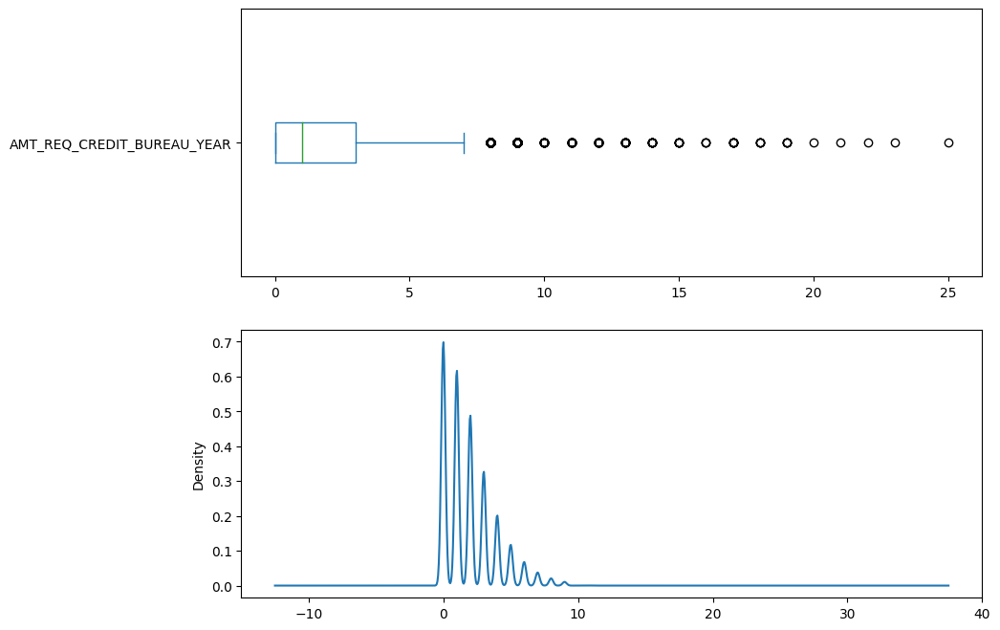

In [18]:
for i in range(len(continuous_col)):
    show_num_col(continuous[continuous_col], continuous_col[i])

In [18]:
continuous_is_null = continuous.isna().sum() != 0
final_continuous_feature = continuous.columns[continuous_is_null].tolist()
print("Features continues pour le train: \n",final_continuous_feature)

print("****************************************")
continuous_is_null_test = continuous_test.isna().sum() != 0
final_continuous_feature_test = continuous_test.columns[continuous_is_null_test].tolist()
print("Features continues pour le test: \n",final_continuous_feature_test)

Features continues pour le train: 
 ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
****************************************
Features continues pour le test: 
 ['AMT_ANNUITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [19]:
print("Pour le train:\n")
for i in range(len(final_continuous_feature)):
    replace_mean(continuous, final_continuous_feature[i])

print("************************************")
print("Pour le test:\n")
for i in range(len(final_continuous_feature_test)):
    replace_mean(continuous_test, final_continuous_feature_test[i])

Pour le train:

NaN de AMT_ANNUITY remplacés par la moyenne 27108.573909183444
NaN de AMT_GOODS_PRICE remplacés par la moyenne 538396.2074288892
NaN de CNT_FAM_MEMBERS remplacés par la moyenne 2.1526654504421012
NaN de EXT_SOURCE_2 remplacés par la moyenne 0.5143926741308464
NaN de EXT_SOURCE_3 remplacés par la moyenne 0.5108529061799658
NaN de OBS_30_CNT_SOCIAL_CIRCLE remplacés par la moyenne 1.4222454239942577
NaN de DEF_30_CNT_SOCIAL_CIRCLE remplacés par la moyenne 0.14342066625338512
NaN de OBS_60_CNT_SOCIAL_CIRCLE remplacés par la moyenne 1.4052921791901856
NaN de DEF_60_CNT_SOCIAL_CIRCLE remplacés par la moyenne 0.10004894123788702
NaN de DAYS_LAST_PHONE_CHANGE remplacés par la moyenne -962.8587883320869
NaN de AMT_REQ_CREDIT_BUREAU_HOUR remplacés par la moyenne 0.006402448193930642
NaN de AMT_REQ_CREDIT_BUREAU_DAY remplacés par la moyenne 0.0070002105326475985
NaN de AMT_REQ_CREDIT_BUREAU_WEEK remplacés par la moyenne 0.03436193569731421
NaN de AMT_REQ_CREDIT_BUREAU_MON remplacé

In [20]:
numeric[continuous_col] = continuous[continuous_col]

# ----------------------------------------------
numeric_test[continuous_col] = continuous_test[continuous_col]

In [21]:
col_names = numeric.columns

# ------------------------------------
col_names_test = numeric_test.columns

In [22]:
print("Nb d'outliers par colonne du train:\n")
for i in range(len(col_names)):
    print("{}: {}".format(col_names[i],(outlier_detect(numeric,col_names[i]).shape[0])))
    
print("\n\n***************************************\n")
print("Nb d'outliers par colonne du test:\n")
for i in range(len(col_names_test)):
    print("{}: {}".format(col_names_test[i],(outlier_detect(numeric_test,col_names_test[i]).shape[0])))

Nb d'outliers par colonne du train:

SK_ID_CURR: 0
TARGET: 24825
CNT_CHILDREN: 4272
AMT_INCOME_TOTAL: 14035
AMT_CREDIT: 6562
AMT_ANNUITY: 7504
AMT_GOODS_PRICE: 14728
REGION_POPULATION_RELATIVE: 8412
DAYS_BIRTH: 0
DAYS_EMPLOYED: 72217
DAYS_REGISTRATION: 659
DAYS_ID_PUBLISH: 0
FLAG_MOBIL: 1
FLAG_EMP_PHONE: 55386
FLAG_WORK_PHONE: 61308
FLAG_CONT_MOBILE: 574
FLAG_PHONE: 0
FLAG_EMAIL: 17442
CNT_FAM_MEMBERS: 4007
REGION_RATING_CLIENT: 80527
REGION_RATING_CLIENT_W_CITY: 78027
HOUR_APPR_PROCESS_START: 2257
REG_REGION_NOT_LIVE_REGION: 4657
REG_REGION_NOT_WORK_REGION: 15612
LIVE_REGION_NOT_WORK_REGION: 12503
REG_CITY_NOT_LIVE_CITY: 24039
REG_CITY_NOT_WORK_CITY: 70867
LIVE_CITY_NOT_WORK_CITY: 55215
EXT_SOURCE_2: 0
EXT_SOURCE_3: 0
OBS_30_CNT_SOCIAL_CIRCLE: 19971
DEF_30_CNT_SOCIAL_CIRCLE: 36187
OBS_60_CNT_SOCIAL_CIRCLE: 19564
DEF_60_CNT_SOCIAL_CIRCLE: 26790
DAYS_LAST_PHONE_CHANGE: 435
FLAG_DOCUMENT_2: 13
FLAG_DOCUMENT_3: 0
FLAG_DOCUMENT_4: 25
FLAG_DOCUMENT_5: 4648
FLAG_DOCUMENT_6: 27078
FLAG_DOCUME

In [17]:
Q1 = train_new.quantile(0.25)
Q3 = train_new.quantile(0.75)
IQR = Q3 - Q1

In [23]:
outlier = []
for i in range(len(final_numeric_feature)):
    if outlier_detect(numeric[final_numeric_feature],final_numeric_feature[i]).shape[0] !=0:
        outlier.append(final_numeric_feature[i])

outlier_test = []
for i in range(len(final_numeric_feature_test)):
    if outlier_detect(numeric_test[final_numeric_feature_test],final_numeric_feature_test[i]).shape[0] !=0:
        outlier_test.append(final_numeric_feature_test[i])

In [24]:
# without TARGET field
col_names = outlier_test

In [25]:
print("Outliers supérieurs pour le train:\n")
for i in range(len(col_names)):
    print("{}: {}".format(col_names[i],(upper_outlier(numeric,col_names[i]).shape[0])))
    
print("\n\n****************************************\n")
print("Outliers supérieurs pour le test:\n")
for i in range(len(col_names)):
    print("{}: {}".format(col_names[i],(upper_outlier(numeric_test,col_names[i]).shape[0])))

Outliers supérieurs pour le train:

CNT_CHILDREN: 4272
AMT_INCOME_TOTAL: 14035
AMT_CREDIT: 6562
AMT_ANNUITY: 7504
AMT_GOODS_PRICE: 14728
REGION_POPULATION_RELATIVE: 8412
DAYS_EMPLOYED: 55374
DAYS_REGISTRATION: 0
FLAG_MOBIL: 0
FLAG_EMP_PHONE: 0
FLAG_WORK_PHONE: 61308
FLAG_CONT_MOBILE: 0
FLAG_EMAIL: 17442
CNT_FAM_MEMBERS: 4007
REGION_RATING_CLIENT: 48330
REGION_RATING_CLIENT_W_CITY: 43860
HOUR_APPR_PROCESS_START: 596
REG_REGION_NOT_LIVE_REGION: 4657
REG_REGION_NOT_WORK_REGION: 15612
LIVE_REGION_NOT_WORK_REGION: 12503
REG_CITY_NOT_LIVE_CITY: 24039
REG_CITY_NOT_WORK_CITY: 70867
LIVE_CITY_NOT_WORK_CITY: 55215
OBS_30_CNT_SOCIAL_CIRCLE: 19971
DEF_30_CNT_SOCIAL_CIRCLE: 36187
OBS_60_CNT_SOCIAL_CIRCLE: 19564
DEF_60_CNT_SOCIAL_CIRCLE: 26790
DAYS_LAST_PHONE_CHANGE: 0
FLAG_DOCUMENT_4: 25
FLAG_DOCUMENT_5: 4648
FLAG_DOCUMENT_6: 27078
FLAG_DOCUMENT_7: 59
FLAG_DOCUMENT_8: 25024
FLAG_DOCUMENT_9: 1198
FLAG_DOCUMENT_11: 1203
FLAG_DOCUMENT_18: 2500
AMT_REQ_CREDIT_BUREAU_HOUR: 43145
AMT_REQ_CREDIT_BUREAU_DA

In [26]:
for i in range(len(col_names)):
    replace_upper(numeric, col_names[i])   
    
#------------------------------------------------------
for i in range(len(col_names)):
    replace_upper(numeric_test, col_names[i])   

In [27]:
print("Outliers inférieurs pour le train:\n")
for i in range(len(col_names)):
    print("{}: {}".format(col_names[i],(lower_outlier(numeric,col_names[i]).shape[0])))
    
print("\n\n****************************************\n")
print("Outliers inférieurs pour le test:\n")
for i in range(len(col_names)):
    print("{}: {}".format(col_names[i],(lower_outlier(numeric_test,col_names[i]).shape[0])))

Outliers inférieurs pour le train:

CNT_CHILDREN: 0
AMT_INCOME_TOTAL: 0
AMT_CREDIT: 0
AMT_ANNUITY: 0
AMT_GOODS_PRICE: 0
REGION_POPULATION_RELATIVE: 0
DAYS_EMPLOYED: 16843
DAYS_REGISTRATION: 659
FLAG_MOBIL: 1
FLAG_EMP_PHONE: 55386
FLAG_WORK_PHONE: 0
FLAG_CONT_MOBILE: 574
FLAG_EMAIL: 0
CNT_FAM_MEMBERS: 0
REGION_RATING_CLIENT: 32197
REGION_RATING_CLIENT_W_CITY: 34167
HOUR_APPR_PROCESS_START: 1661
REG_REGION_NOT_LIVE_REGION: 0
REG_REGION_NOT_WORK_REGION: 0
LIVE_REGION_NOT_WORK_REGION: 0
REG_CITY_NOT_LIVE_CITY: 0
REG_CITY_NOT_WORK_CITY: 0
LIVE_CITY_NOT_WORK_CITY: 0
OBS_30_CNT_SOCIAL_CIRCLE: 0
DEF_30_CNT_SOCIAL_CIRCLE: 0
OBS_60_CNT_SOCIAL_CIRCLE: 0
DEF_60_CNT_SOCIAL_CIRCLE: 0
DAYS_LAST_PHONE_CHANGE: 435
FLAG_DOCUMENT_4: 0
FLAG_DOCUMENT_5: 0
FLAG_DOCUMENT_6: 0
FLAG_DOCUMENT_7: 0
FLAG_DOCUMENT_8: 0
FLAG_DOCUMENT_9: 0
FLAG_DOCUMENT_11: 0
FLAG_DOCUMENT_18: 0
AMT_REQ_CREDIT_BUREAU_HOUR: 0
AMT_REQ_CREDIT_BUREAU_DAY: 0
AMT_REQ_CREDIT_BUREAU_WEEK: 0
AMT_REQ_CREDIT_BUREAU_MON: 0
AMT_REQ_CREDIT_BUREAU

In [28]:
for i in range(len(col_names)):
    replace_lower(numeric, col_names[i])
    
# #--------------------------------------------------
for i in range(len(col_names)):
    replace_lower(numeric_test, col_names[i])

In [29]:
categorical_feature = train_new.dtypes==object
final_categorical_feature = train_new.columns[categorical_feature].tolist()

#----------------------------------------------------
categorical_feature_test = test_new.dtypes==object
final_categorical_feature_test = test_new.columns[categorical_feature_test].tolist()

In [30]:
categorical = train_new[final_categorical_feature]

#---------------------------------------------
categorical_test = test_new[final_categorical_feature_test]

In [31]:
col_names_cat = categorical.columns

******************** NAME_CONTRACT_TYPE ********************



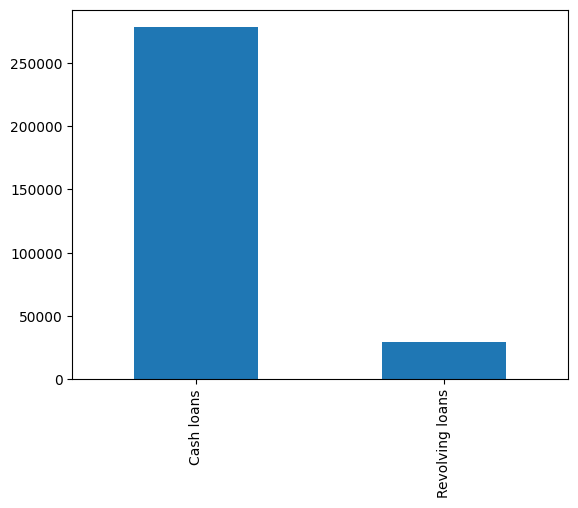

******************** CODE_GENDER ********************



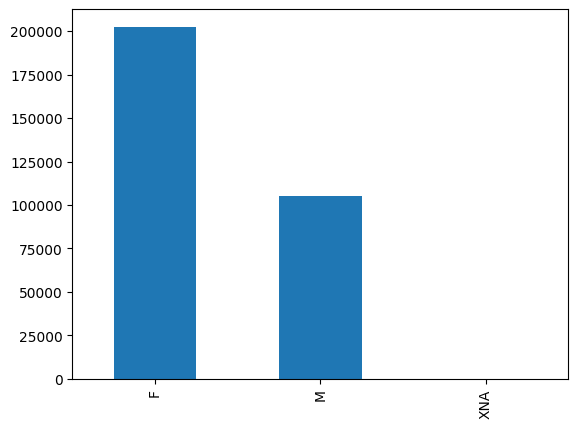

******************** FLAG_OWN_CAR ********************



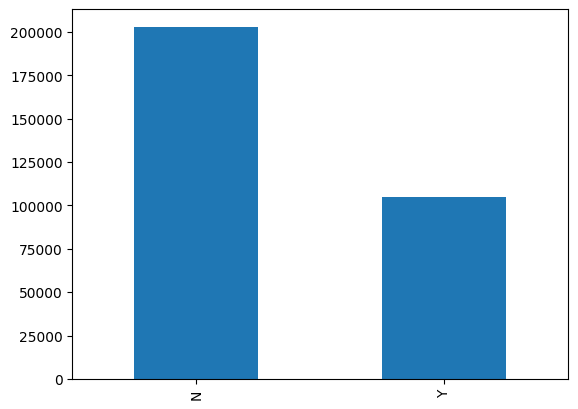

******************** FLAG_OWN_REALTY ********************



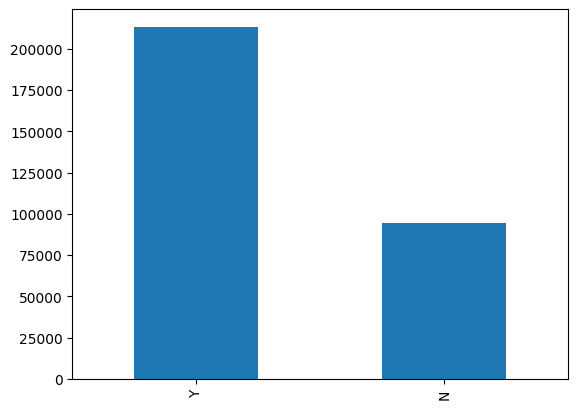

******************** NAME_TYPE_SUITE ********************



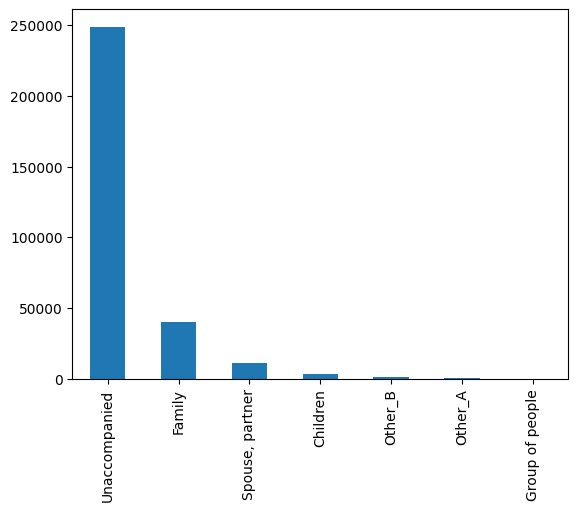

******************** NAME_INCOME_TYPE ********************



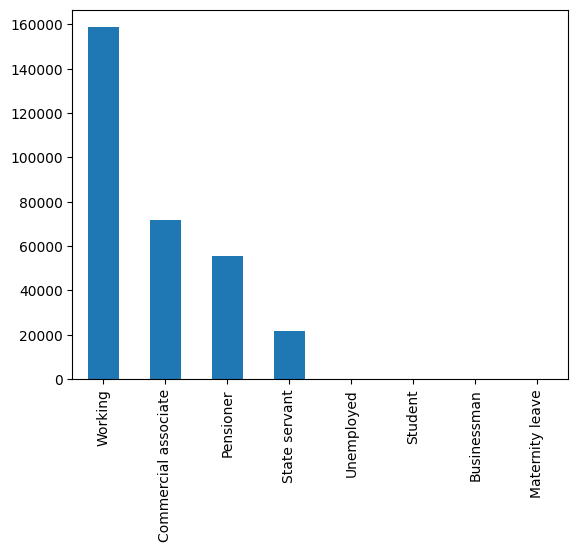

******************** NAME_EDUCATION_TYPE ********************



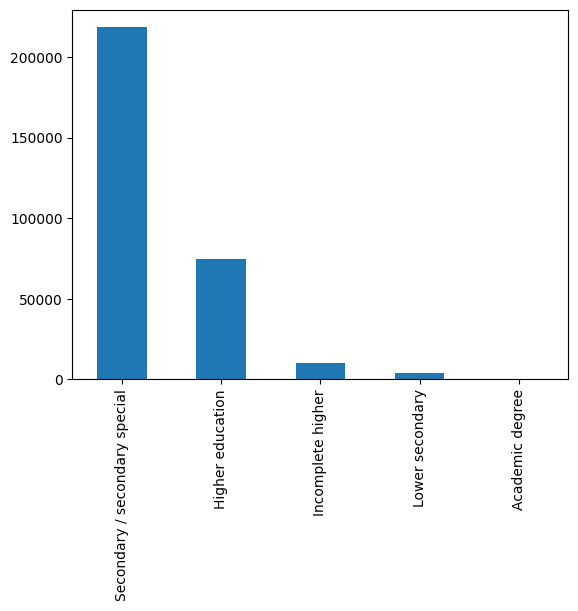

******************** NAME_FAMILY_STATUS ********************



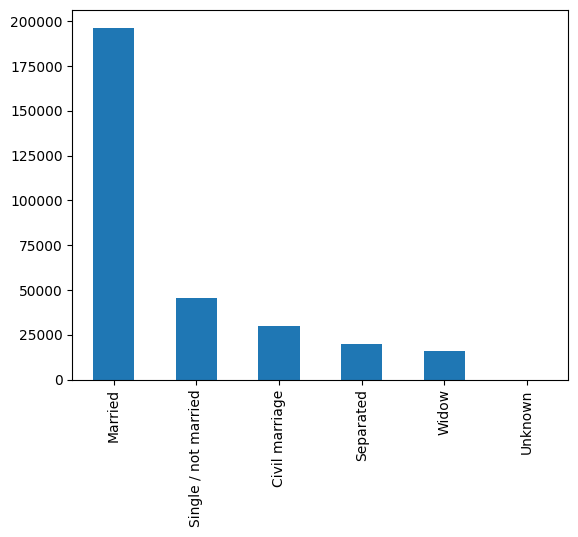

******************** NAME_HOUSING_TYPE ********************



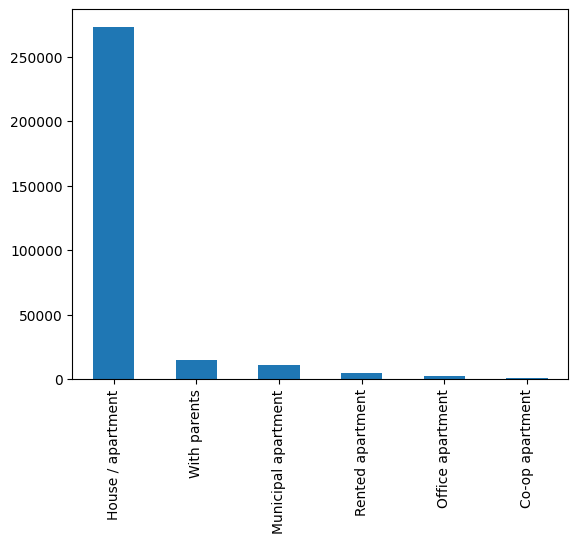

******************** OCCUPATION_TYPE ********************



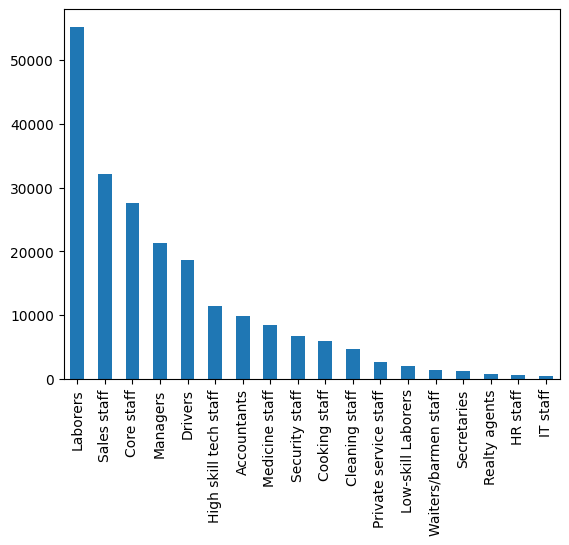

******************** WEEKDAY_APPR_PROCESS_START ********************



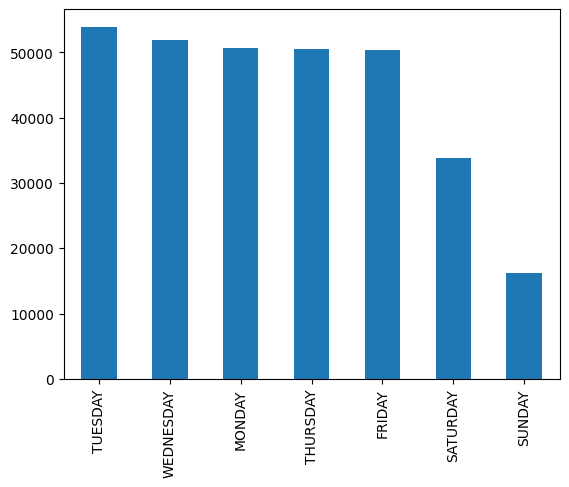

******************** ORGANIZATION_TYPE ********************



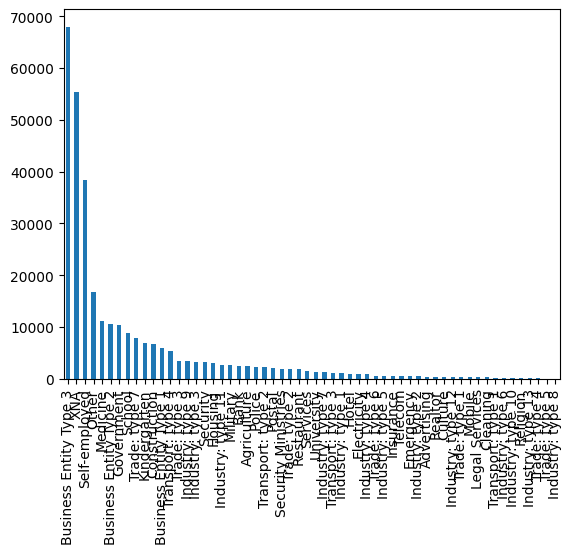

In [34]:
for i in range(len(col_names_cat)):
    show_cat_col(categorical, col_names_cat[i])

In [32]:
print("unique number is = {}\nunique values are: \n{} ".format(len(train_new['ORGANIZATION_TYPE'].unique()), 
                                                               train_new['ORGANIZATION_TYPE'].unique()))

unique number is = 58
unique values are: 
['Business Entity Type 3' 'School' 'Government' 'Religion' 'Other' 'XNA'
 'Electricity' 'Medicine' 'Business Entity Type 2' 'Self-employed'
 'Transport: type 2' 'Construction' 'Housing' 'Kindergarten'
 'Trade: type 7' 'Industry: type 11' 'Military' 'Services'
 'Security Ministries' 'Transport: type 4' 'Industry: type 1' 'Emergency'
 'Security' 'Trade: type 2' 'University' 'Transport: type 3' 'Police'
 'Business Entity Type 1' 'Postal' 'Industry: type 4' 'Agriculture'
 'Restaurant' 'Culture' 'Hotel' 'Industry: type 7' 'Trade: type 3'
 'Industry: type 3' 'Bank' 'Industry: type 9' 'Insurance' 'Trade: type 6'
 'Industry: type 2' 'Transport: type 1' 'Industry: type 12' 'Mobile'
 'Trade: type 1' 'Industry: type 5' 'Industry: type 10' 'Legal Services'
 'Advertising' 'Trade: type 5' 'Cleaning' 'Industry: type 13'
 'Trade: type 4' 'Telecom' 'Industry: type 8' 'Realtor' 'Industry: type 6'] 


In [33]:
print("Pour le train:\n")
for i in range(len(col_names_cat)):
    replace_mode(categorical, col_names_cat[i])

print("\n\n****************************************\n")
print("Pour le test:\n")
for i in range(len(col_names_cat)):
    replace_mode(categorical_test, col_names_cat[i])

Pour le train:

NaN de NAME_CONTRACT_TYPE remplacés par le mode Cash loans
NaN de CODE_GENDER remplacés par le mode F
NaN de FLAG_OWN_CAR remplacés par le mode N
NaN de FLAG_OWN_REALTY remplacés par le mode Y
NaN de NAME_TYPE_SUITE remplacés par le mode Unaccompanied
NaN de NAME_INCOME_TYPE remplacés par le mode Working
NaN de NAME_EDUCATION_TYPE remplacés par le mode Secondary / secondary special
NaN de NAME_FAMILY_STATUS remplacés par le mode Married
NaN de NAME_HOUSING_TYPE remplacés par le mode House / apartment
NaN de OCCUPATION_TYPE remplacés par le mode Laborers
NaN de WEEKDAY_APPR_PROCESS_START remplacés par le mode TUESDAY
NaN de ORGANIZATION_TYPE remplacés par le mode Business Entity Type 3


****************************************

Pour le test:

NaN de NAME_CONTRACT_TYPE remplacés par le mode Cash loans
NaN de CODE_GENDER remplacés par le mode F
NaN de FLAG_OWN_CAR remplacés par le mode N
NaN de FLAG_OWN_REALTY remplacés par le mode Y
NaN de NAME_TYPE_SUITE remplacés par l

In [34]:
categorical.drop(['ORGANIZATION_TYPE'], axis=1, inplace=True)
# ---------------------------------------------
categorical_test.drop(['ORGANIZATION_TYPE'], axis=1, inplace=True)

In [35]:
le = LabelEncoder() 
categorical = categorical.apply(lambda col_names_cat: le.fit_transform(col_names_cat)) 
categorical_test = categorical_test.apply(lambda col_names_cat: le.fit_transform(col_names_cat)) 

In [36]:
print("Train: ",categorical.shape)
print("Test: ",categorical_test.shape)

Train:  (307511, 11)
Test:  (48744, 11)


In [37]:
col_names_cat = categorical.columns
col_names = numeric_test.columns

In [38]:
train_new[col_names_cat] = categorical[col_names_cat]
train_new[col_names] = numeric[col_names]

# ----------------------------------------------------
test_new[col_names] = numeric_test[col_names]
test_new[col_names_cat] = categorical_test[col_names_cat]

In [39]:
train_new.drop(['ORGANIZATION_TYPE'], axis=1, inplace=True)
test_new.drop(['ORGANIZATION_TYPE'], axis=1, inplace=True)

In [40]:
print("Train: ",train_new.loc[train.duplicated()].shape)
#--------------------------------------------------
print("Test: ",test_new.loc[test.duplicated()].shape)

Train:  (0, 72)
Test:  (0, 71)


In [41]:
x_train = train_new.drop("TARGET", axis = 1)
y = train_new['TARGET']

In [42]:
scaler=MinMaxScaler()
col = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL', 'FLAG_EMP_PHONE',
       'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
       'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9',
       'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']

x_train[col] = pd.DataFrame(scaler.fit_transform(x_train[col]))
test_new[col] = pd.DataFrame(scaler.transform(test_new[col]))

In [43]:
train_id = x_train[['SK_ID_CURR']]
test_id = test_new[['SK_ID_CURR']]
x_train = x_train.drop(columns = 'SK_ID_CURR')
test_new = test_new.drop(columns = 'SK_ID_CURR')

In [59]:
train_id.to_csv('cust_num.csv')
test_id.to_csv('new_cust_num.csv')

## 1.5 Observation des features finales

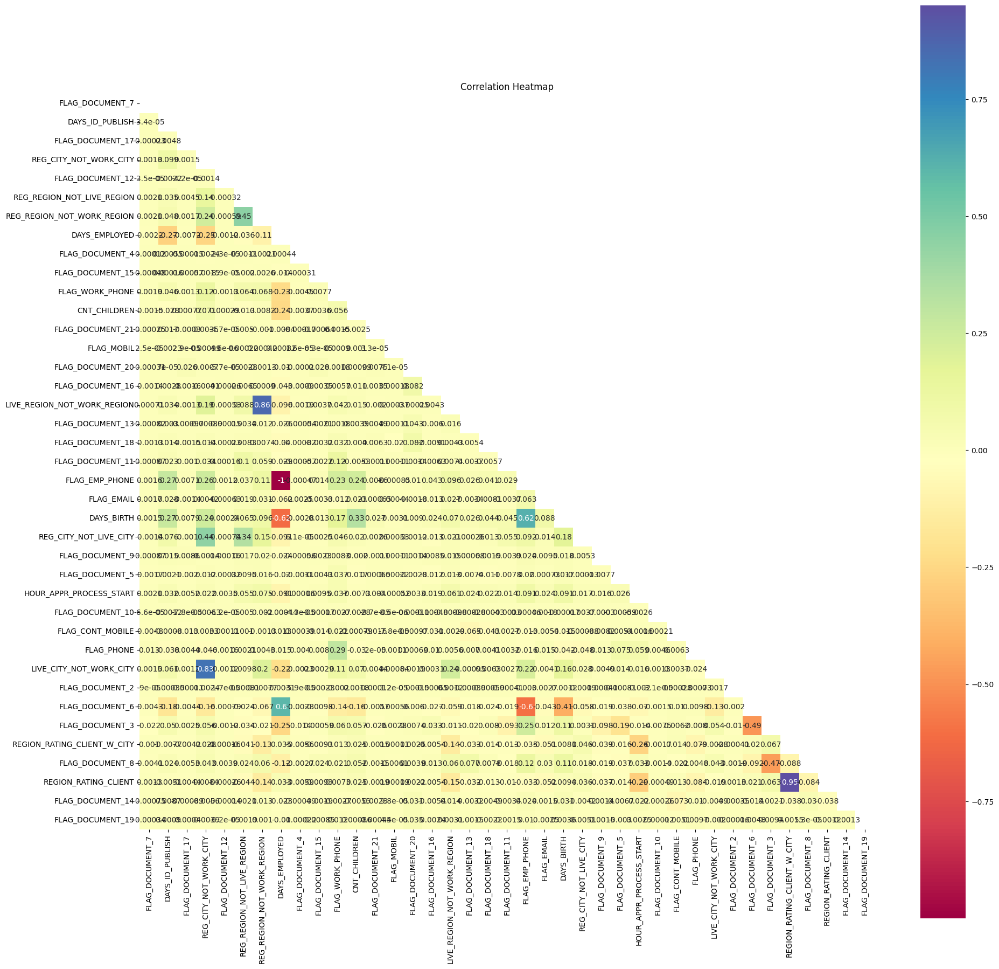

In [504]:
disc_col = set(discrete.columns).intersection(col)

plt.figure(figsize = (22, 22))
mask = np.triu(np.ones_like(discrete[disc_col].corr()))

sns.heatmap(discrete[disc_col].corr(),mask = mask, cmap = plt.cm.Spectral,square=True, annot = True)
plt.title('Correlation Heatmap');

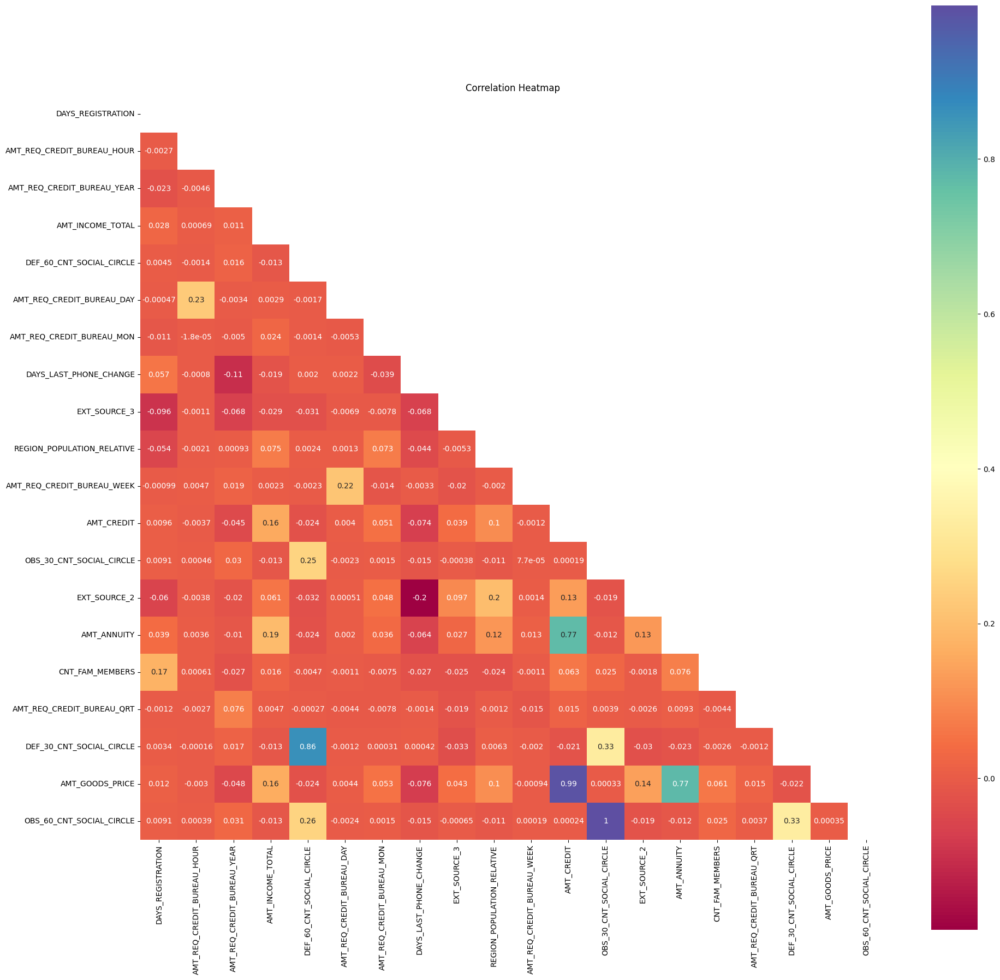

In [499]:
cont_col = set(continuous.columns).intersection(col)

plt.figure(figsize = (22, 22))
mask = np.triu(np.ones_like(continuous[cont_col].corr()))

sns.heatmap(continuous[cont_col].corr(),mask = mask, cmap = plt.cm.Spectral,square=True, annot = True)
plt.title('Correlation Heatmap');

In [500]:
correlations = train.corr()['TARGET'].sort_values()

In [501]:
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 DEF_60_CNT_SOCIAL_CIRCLE       0.031276
DEF_30_CNT_SOCIAL_CIRCLE       0.032248
LIVE_CITY_NOT_WORK_CITY        0.032518
OWN_CAR_AGE                    0.037612
DAYS_REGISTRATION              0.041975
FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645


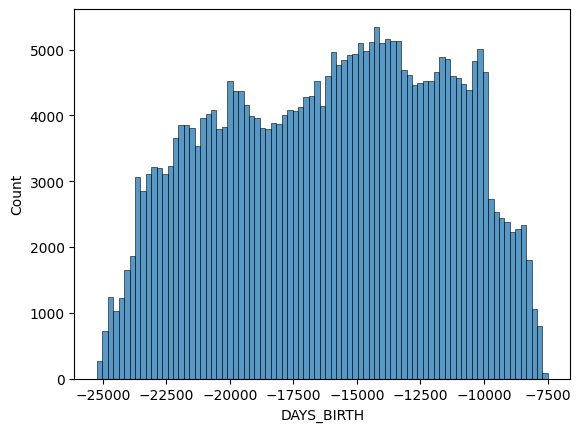

In [506]:
sns.histplot(x= train['DAYS_BIRTH']);

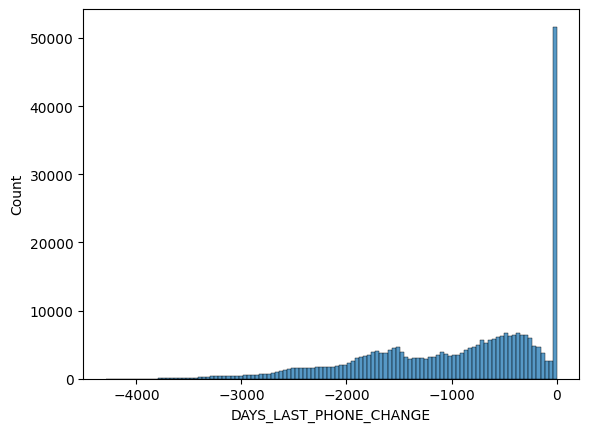

In [507]:
sns.histplot(x= train['DAYS_LAST_PHONE_CHANGE']);

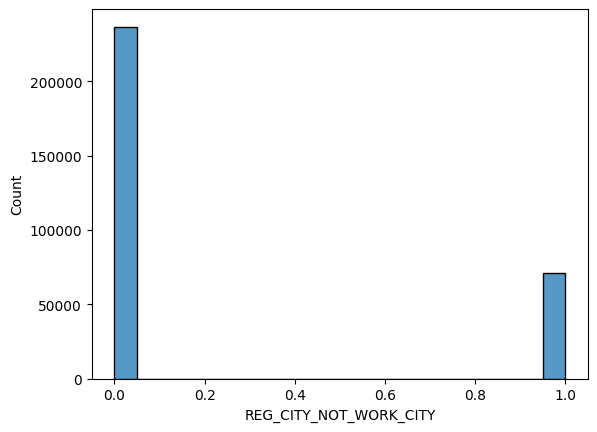

In [509]:
sns.histplot(x= train['REG_CITY_NOT_WORK_CITY']);

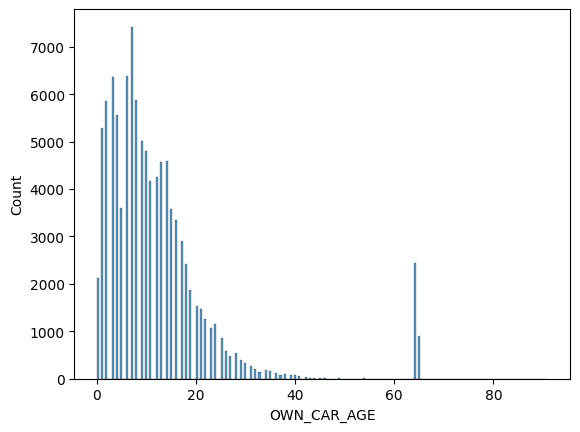

In [510]:
sns.histplot(x= train['OWN_CAR_AGE']);

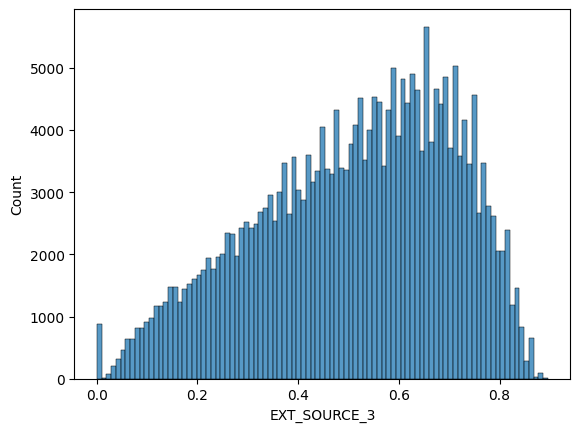

In [528]:
sns.histplot(x= train['EXT_SOURCE_3']);

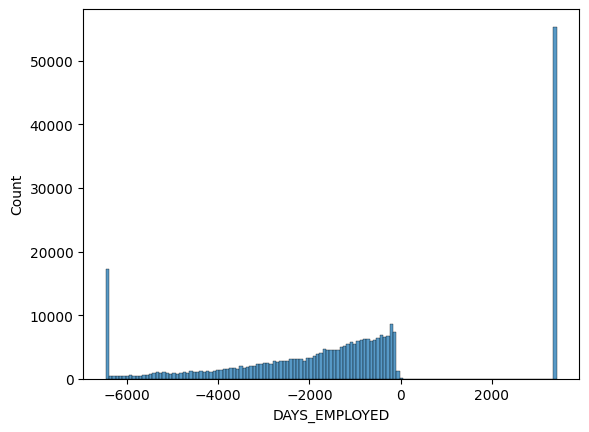

In [531]:
sns.histplot(x= train_new['DAYS_EMPLOYED']);

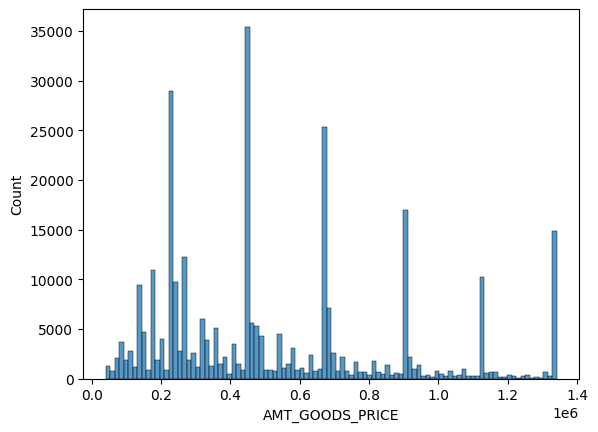

In [532]:
sns.histplot(x= train_new['AMT_GOODS_PRICE']);

# 2. Pipe de transformation

In [461]:
col = list(x_train.columns)

In [462]:
col

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLA

In [316]:
X = train[col]

numeric_features = X.select_dtypes(exclude='object').columns
categorical_features = X.select_dtypes(include=['object']).columns

imp_cat = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_num = SimpleImputer(missing_values=np.nan, strategy='mean')

cat_transformer = Pipeline([('LabelImputer',imp_cat), ('Encoder',OrdinalEncoder())])
numerical_transformer = Pipeline([('NumImputer',imp_num), ('Scaler',MinMaxScaler())])

ct = ColumnTransformer([('Cat',cat_transformer,categorical_features),('Num',numerical_transformer,numeric_features)])

ct = ct.fit(X)

In [317]:
joblib.dump(ct, 'col_transfo.joblib')

['col_transfo.joblib']

In [57]:
pipe = Pipeline([('transformer',ct)])

In [318]:
X = pd.DataFrame(ct.transform(X), columns = X.columns)

# 3. Modélisations et MLFlow

In [7]:
from imblearn.over_sampling import SMOTE
from time import time
from collections import Counter

# ----------------------------------------------------
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression

# ----------------------------------------------------
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate, cross_val_predict
from sklearn.model_selection import train_test_split, RandomizedSearchCV

# ----------------------------------------------------
from sklearn import metrics as met
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, auc, roc_auc_score, roc_curve

# ----------------------------------------------------------
kfold = StratifiedKFold(n_splits=5, random_state=100, shuffle=True)

# ----------------------------------------------------------
import mlflow
from mlflow.models.signature import infer_signature
import joblib

# ----------------------------------------------------------
import shap

In [306]:
def cost_score(y_true,y_pred,fn_cost=10, fp_cost=1):
    fn = np.sum((y_true == 1) & (y_pred == 0))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    loss = fn * fn_cost + fp * fp_cost
    score = loss
    return score

# ----------------------------------------------------------
def best_thresh(y_true, y_prob, fn_cost=10, fp_cost=1,step=0.0001):

    cost_min = np.inf
    opti_thresh = 0.0
    for threshold in np.arange(0.0, 1.0, step):
        y_pred = (y_prob >= threshold).astype(int)
        fn = np.sum((y_true == 1) & (y_pred == 0))
        fp = np.sum((y_true == 0) & (y_pred == 1))
        cost = fn * fn_cost + fp * fp_cost
        if cost < cost_min:
            cost_min = cost
            opti_thresh = threshold

    return opti_thresh

# ----------------------------------------------------------
def model_res(model, X, y, params, smote = False, disp = True):

    model_name = str(type(model)).split('.')[-1][0:-2]
    
    if smote == True:
        model_name += ' & smote'
        pipeline = Pipeline(steps = [['smote', SMOTE(random_state = 11)],
                                     ['classifier', model]])
    else:
        model_name += ' & class_weight'     
        pipeline = model
    
    clf1 = RandomizedSearchCV(estimator = pipeline, param_distributions = params, scoring = 'roc_auc', cv = kfold, 
                              n_jobs=-1, random_state=100)
    clf1.fit(X, y)

    model1 = clf1.best_estimator_
    hyperparams1 = clf1.best_params_    
    start = time()
    y_pred_proba1 = cross_val_predict(model1, X, y, cv=kfold, method='predict_proba')[:, 1]
    end = time()
    laps1 = (end - start)/5
    
    y_pred1 = (y_pred_proba1 >= 0.5).astype(int)    
    accuracy=accuracy_score(y, y_pred1)
    recall=recall_score(y,y_pred1)
    precision=precision_score(y,y_pred1)
    f1=f1_score(y,y_pred1)
    rocauc=roc_auc_score(y,y_pred_proba1)
    score = cost_score(y,y_pred1)    
    scores1 = [accuracy, recall, precision, f1, rocauc, score, 0.5]
    
    thresh1 = best_thresh(y, y_pred_proba1)
    y_pred1bis = (y_pred_proba1 >= thresh1).astype(int)
    accuracy=accuracy_score(y, y_pred1bis)
    recall=recall_score(y,y_pred1bis)
    precision=precision_score(y,y_pred1bis)
    f1=f1_score(y,y_pred1bis)
    rocauc=roc_auc_score(y,y_pred_proba1)
    score = cost_score(y,y_pred1bis)     
    scores1bis = [accuracy, recall, precision, f1, rocauc, score, thresh1]
    
    scorer = met.make_scorer(cost_score, greater_is_better = False)
    
    clf2 = RandomizedSearchCV(estimator = pipeline, param_distributions = params, scoring = scorer, cv = kfold, 
                              n_jobs=-1, random_state=100)
    clf2.fit(X, y)

    model2 = clf2.best_estimator_
    hyperparams2 = clf2.best_params_  
    start = time()
    y_pred_proba2 = cross_val_predict(model2, X, y, cv=kfold, method='predict_proba')[:, 1]
    end = time()
    laps2 = (end - start)/5
    
    y_pred2 = (y_pred_proba2 >= 0.5).astype(int)  
    accuracy=accuracy_score(y, y_pred2)
    recall=recall_score(y,y_pred2)
    precision=precision_score(y,y_pred2)
    f1=f1_score(y,y_pred2)
    rocauc=roc_auc_score(y,y_pred_proba2)
    score = cost_score(y,y_pred2)    
    scores2 = [accuracy, recall, precision, f1, rocauc, score, 0.5]

    thresh2 = best_thresh(y, y_pred_proba2)
    y_pred2bis = (y_pred_proba2 >= thresh2).astype(int)
    accuracy=accuracy_score(y, y_pred2bis)
    recall=recall_score(y,y_pred2bis)
    precision=precision_score(y,y_pred2bis)
    f1=f1_score(y,y_pred2bis)
    rocauc=roc_auc_score(y,y_pred_proba2)
    score = cost_score(y,y_pred2bis)     
    scores2bis = [accuracy, recall, precision, f1, rocauc, score, thresh2]    
    
    df = None
    
    if disp == True:

        fpr1, tpr1, _ = roc_curve(y, y_pred_proba1)
        fpr2, tpr2, _ = roc_curve(y, y_pred_proba2)
        curve = plt.figure()
        plt.plot(fpr1, tpr1, 'b', label = 'AUC score optimization AUC = %0.2f' % auc(fpr1, tpr1))
        plt.plot(fpr2, tpr2, 'orange', label = 'Business score optimization AUC = %0.2f' % auc(fpr2, tpr2))
        plt.plot([0, 1], [0, 1],'r--')
        plt.xlim([0, 1])
        plt.ylim([0, 1])
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc = 'lower right')
        plt.suptitle('Receiver Operating Characteristic')
        
        output1 = pd.DataFrame({'SK_ID_CURR': train_id.SK_ID_CURR, 
                               'TARGET': y_pred_proba1})
        output2 = pd.DataFrame({'SK_ID_CURR': train_id.SK_ID_CURR, 
                               'TARGET': y_pred_proba2})
        fig, ax = plt.subplots(1,1)        
        sns.histplot(output1['TARGET'], ax = ax, color = 'blue', label = 'AUC score optimization')
        sns.histplot(output2['TARGET'], ax = ax, color = 'orange', label = 'Business score optimization')
        plt.legend()
        plt.title('Probability Distribution')
        plt.show()
        
        cm1 = met.confusion_matrix(y, y_pred1)
        cm2 = met.confusion_matrix(y, y_pred2)
        fig, ax = plt.subplots(1,2, figsize = (18,7))
        sns.heatmap(cm1, annot=True,  fmt='', xticklabels = ["0", "1"] , 
                        yticklabels = ["0", "1"], ax = ax[0])
        ax[0].set_title('AUC score optimization / threshold = 0.5')   
        ax[0].set_ylabel('Actual')
        ax[0].set_xlabel('Predicted')
        sns.heatmap(cm2, annot=True,  fmt='', xticklabels = ["0", "1"] , 
                        yticklabels = ["0", "1"], ax = ax[1])
        ax[1].set_title('Business score optimization / threshold = 0.5')
        ax[1].set_ylabel('Actual')
        ax[1].set_xlabel('Predicted')
        plt.suptitle('Confusion Matrix')
        plt.show()
        
        cm1bis = met.confusion_matrix(y, y_pred1bis)
        cm2bis = met.confusion_matrix(y, y_pred2bis)
        fig, ax = plt.subplots(1,2, figsize = (18,7))
        sns.heatmap(cm1bis, annot=True,  fmt='', xticklabels = ["0", "1"] , 
                        yticklabels = ["0", "1"], ax = ax[0])
        ax[0].set_title(f'AUC score optimization / threshold = {thresh1}')   
        ax[0].set_ylabel('Actual')
        ax[0].set_xlabel('Predicted')
        sns.heatmap(cm2bis, annot=True,  fmt='', xticklabels = ["0", "1"] , 
                        yticklabels = ["0", "1"], ax = ax[1])
        ax[1].set_title(f'Business score optimization / threshold = {thresh2}')
        ax[1].set_ylabel('Actual')
        ax[1].set_xlabel('Predicted')
        plt.suptitle('Confusion Matrix')
        plt.show()

        print('Classification Report / AUC score Optimization \n', met.classification_report(y, y_pred1), '\n\n',
              'Classification Report / Business score Optimization \n', met.classification_report(y, y_pred2))   

        col = ['accuracy', 'precision', 'recall', 'f1-score', 'roc_auc', 'business_score', 'threshold', 'time']
        model_name1 = model_name + ' (scoring AUC)'
        model_name2 = model_name + ' (scoring Business)'
        model_name1bis = model_name + ' (scoring AUC) / best thresh'
        model_name2bis = model_name + ' (scoring Business) / best thresh'
        dic_mod = {model_name1 : scores1 + [laps1], model_name1bis : scores1bis + [laps1],
                   model_name2 : scores2 + [laps2], model_name2bis : scores2bis + [laps2]}
        df = pd.DataFrame.from_dict(dic_mod, orient = 'index', columns = col)

        display(df)        
        
    return df, (model1, model2), (hyperparams1, hyperparams2), (scores1, scores2, scores1bis, scores2bis), curve

# ----------------------------------------------------------
def run_mlflow_experiment(model, exp_name, fig_name, hyperparams, scores, time, curve):
    plt.savefig(fig_name)
    
    if str(type(model)).split('.')[1] in ['sklearn', 'dummy', 'linear_model', 'ensemble']:
        model_name = str(type(model)).split('.')[-1][0:-2]
    else:
        model_name = 'Smote' + '/' + str(type(model.named_steps['classifier'])).split('.')[-1][0:-2]
    
    # Nom de l'expérience
    experiment_name = exp_name
    
    # Initialisation de l'expérience
    mlflow.set_experiment(experiment_name)
    
    # Démarrage d'un run
    with mlflow.start_run(run_name = exp_name) as run:
        
        # Enregistrement des hyperparamètres
        mlflow.log_params(hyperparams)
        
        # Enregistrement des métriques
        mlflow.log_metric("Accuracy", scores[0])
        mlflow.log_metric("Precision", scores[1])
        mlflow.log_metric("Recall", scores[2])
        mlflow.log_metric("F1_score", scores[3])
        mlflow.log_metric("Auc_score", scores[4])
        mlflow.log_metric("Business_score", scores[5])
        mlflow.log_metric("Threshold", scores[6])
        mlflow.log_metric("Fit_time", time)

        # Enregistrement des graphiques
        mlflow.log_figure(curve, artifact_file = fig_name)
        
        # Enregistrement du modèle entraîné
        mlflow.sklearn.log_model(model, model_name)

## 3.1 DummyClassifier

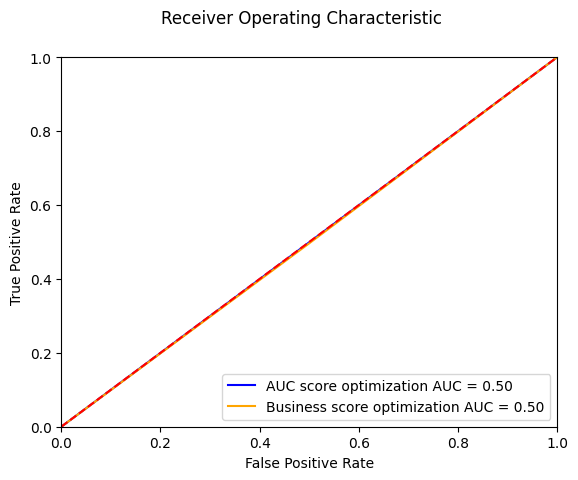

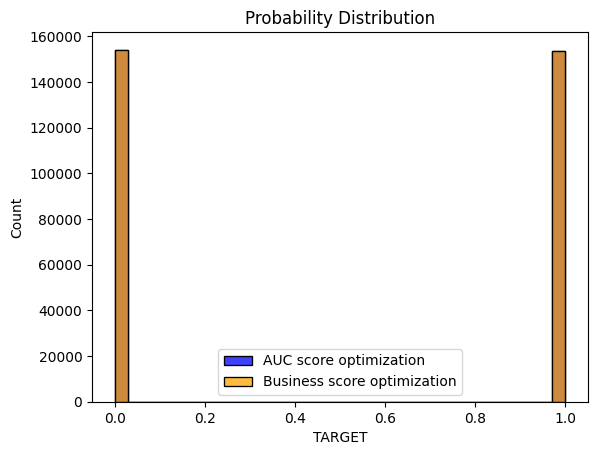

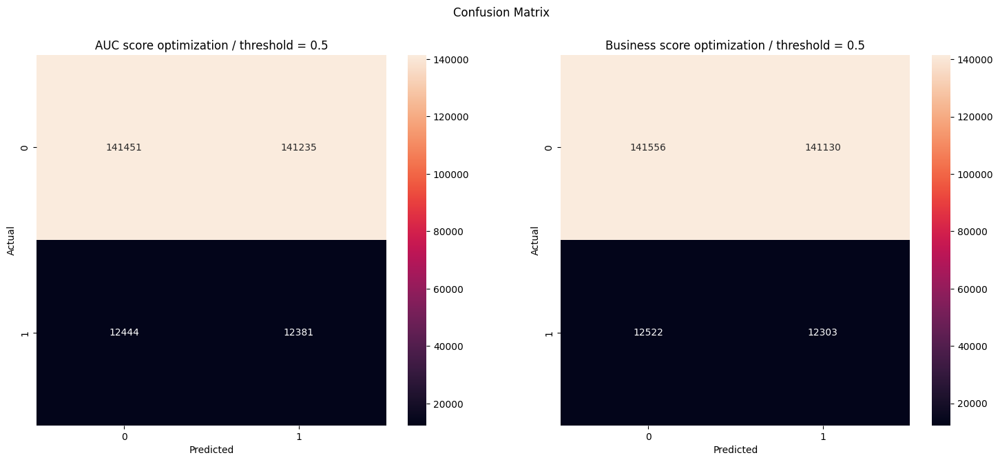

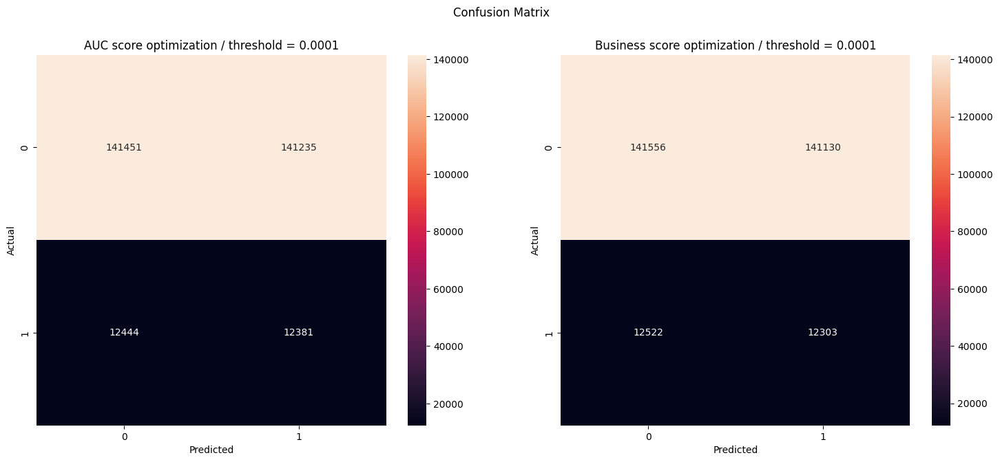

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      0.50      0.65    282686
           1       0.08      0.50      0.14     24825

    accuracy                           0.50    307511
   macro avg       0.50      0.50      0.39    307511
weighted avg       0.85      0.50      0.61    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.92      0.50      0.65    282686
           1       0.08      0.50      0.14     24825

    accuracy                           0.50    307511
   macro avg       0.50      0.50      0.39    307511
weighted avg       0.85      0.50      0.61    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
DummyClassifier & smote (scoring AUC),0.500249,0.498731,0.080597,0.138769,0.499557,265675,0.5000,1.258973
DummyClassifier & smote (scoring AUC) / best thresh,0.500249,0.498731,0.080597,0.138769,0.499557,265675,0.0001,1.258973
DummyClassifier & smote (scoring Business),0.500337,0.495589,0.080185,0.138036,0.498171,266350,0.5000,1.276459
DummyClassifier & smote (scoring Business) / best thresh,0.500337,0.495589,0.080185,0.138036,0.498171,266350,0.0001,1.276459


In [76]:
dummy_clf = DummyClassifier(strategy="stratified")
df_dum_sm, model_dum_sm, params_dum_sm, scores_dum_sm, curve_dum_sm = model_res(dummy_clf, X, y, {}, smote = True)

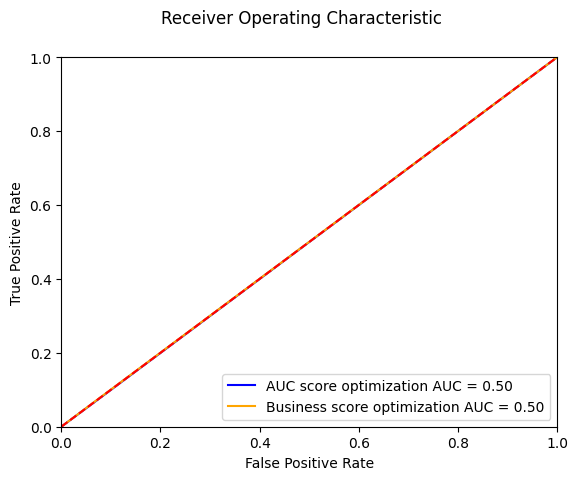

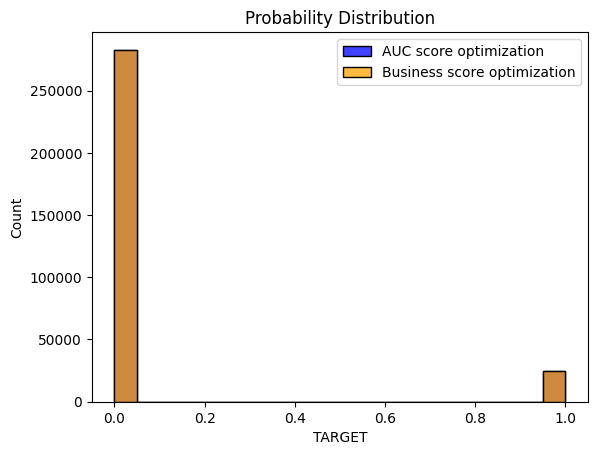

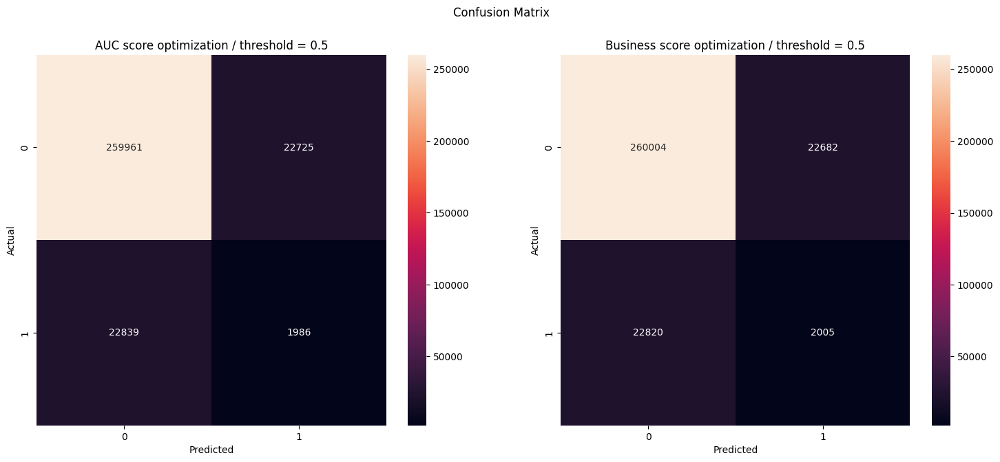

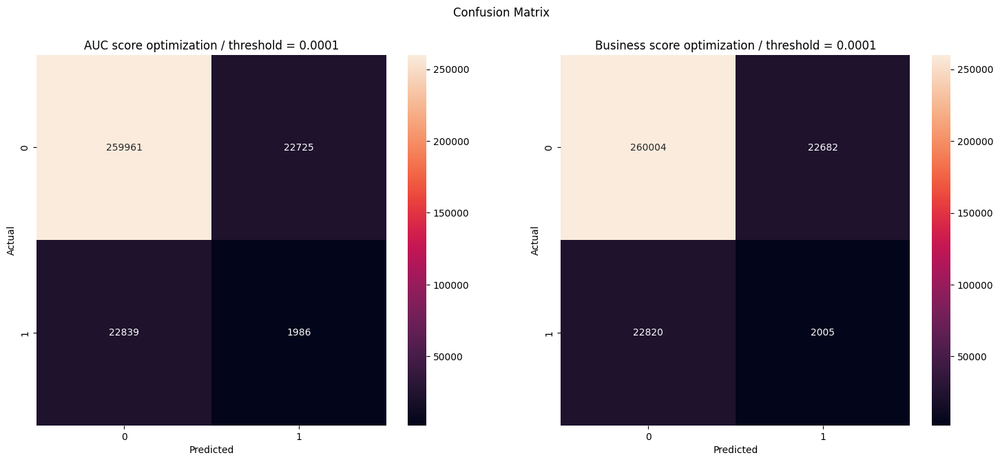

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92    282686
           1       0.08      0.08      0.08     24825

    accuracy                           0.85    307511
   macro avg       0.50      0.50      0.50    307511
weighted avg       0.85      0.85      0.85    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.92      0.92      0.92    282686
           1       0.08      0.08      0.08     24825

    accuracy                           0.85    307511
   macro avg       0.50      0.50      0.50    307511
weighted avg       0.85      0.85      0.85    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
DummyClassifier & class_weight (scoring AUC),0.851830,0.080000,0.080369,0.080184,0.499805,251115,0.5000,0.123475
DummyClassifier & class_weight (scoring AUC) / best thresh,0.851830,0.080000,0.080369,0.080184,0.499805,251115,0.0001,0.123475
DummyClassifier & class_weight (scoring Business),0.852031,0.080765,0.081217,0.080990,0.500264,250882,0.5000,0.137990
DummyClassifier & class_weight (scoring Business) / best thresh,0.852031,0.080765,0.081217,0.080990,0.500264,250882,0.0001,0.137990


In [75]:
dummy_clf = DummyClassifier(strategy="stratified")
df_dum, model_dum, params_dum, scores_dum, curve_dum = model_res(dummy_clf, X, y, {}, smote = False)

In [179]:
df_dum_final = pd.concat([df_dum, df_dum_sm])
df_dum_final.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)

,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
DummyClassifier & class_weight (scoring Business),0.852031,0.080765,0.081217,0.080990,0.500264,250882,0.5000,0.137990
DummyClassifier & class_weight (scoring Business) / best thresh,0.852031,0.080765,0.081217,0.080990,0.500264,250882,0.0001,0.137990
DummyClassifier & class_weight (scoring AUC),0.851830,0.080000,0.080369,0.080184,0.499805,251115,0.5000,0.123475
DummyClassifier & class_weight (scoring AUC) / best thresh,0.851830,0.080000,0.080369,0.080184,0.499805,251115,0.0001,0.123475
DummyClassifier & smote (scoring AUC),0.500249,0.498731,0.080597,0.138769,0.499557,265675,0.5000,1.258973
DummyClassifier & smote (scoring AUC) / best thresh,0.500249,0.498731,0.080597,0.138769,0.499557,265675,0.0001,1.258973
DummyClassifier & smote (scoring Business),0.500337,0.495589,0.080185,0.138036,0.498171,266350,0.5000,1.276459
DummyClassifier & smote (scoring Business) / best thresh,0.500337,0.495589,0.080185,0.138036,0.498171,266350,0.0001,1.276459


In [307]:
run_mlflow_experiment(model_dum[1], 
                      'DummyClassifier_ref', 'dummy_roc.png', params_dum[1], scores_dum[1], 0.137990, curve_dum)

<Figure size 640x480 with 0 Axes>

In [791]:
# curve_dum.savefig('dummy_roc.png')

## 3.2 LogisticRegression

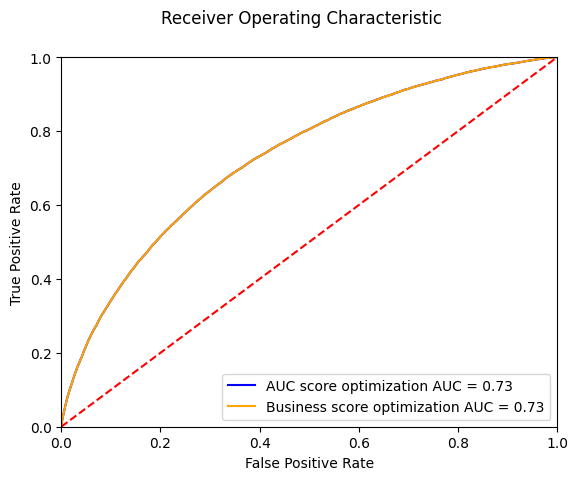

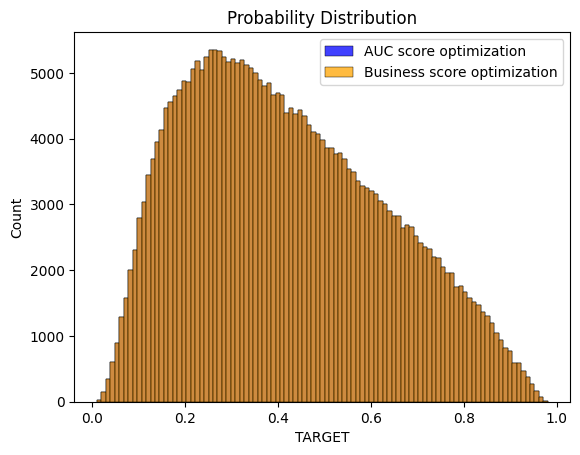

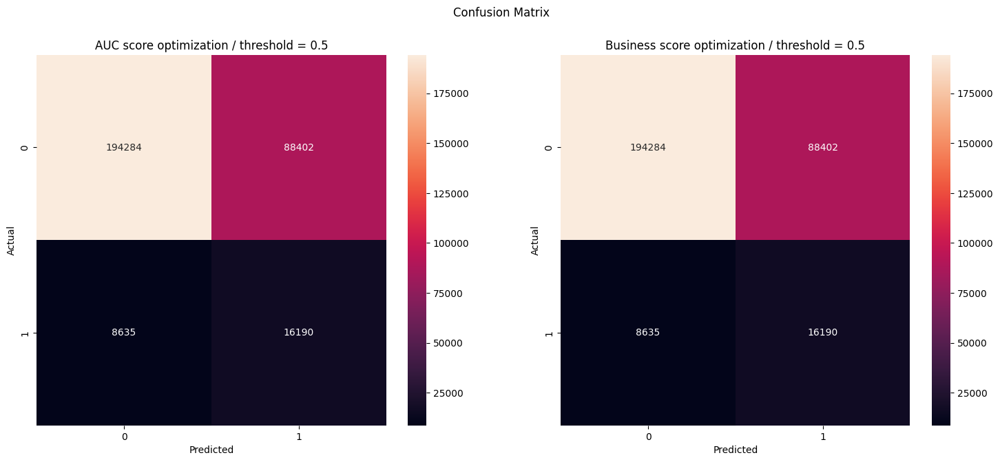

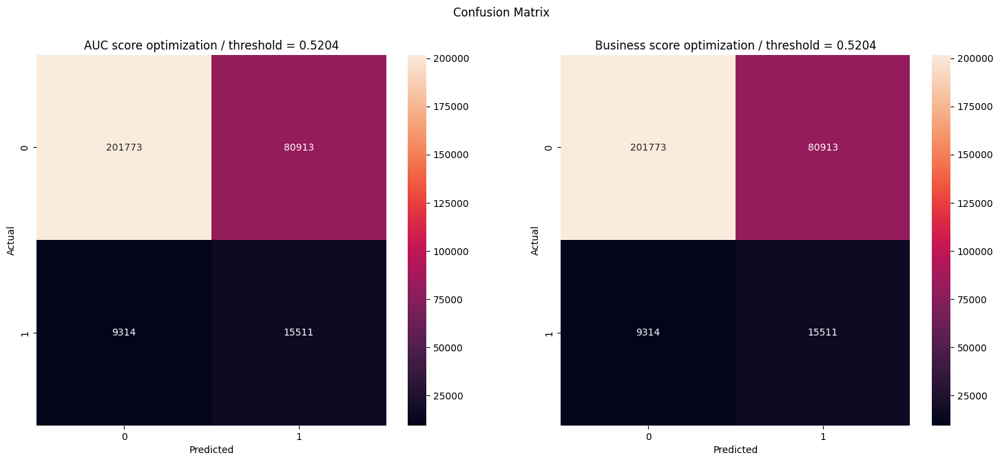

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80    282686
           1       0.15      0.65      0.25     24825

    accuracy                           0.68    307511
   macro avg       0.56      0.67      0.53    307511
weighted avg       0.89      0.68      0.76    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80    282686
           1       0.15      0.65      0.25     24825

    accuracy                           0.68    307511
   macro avg       0.56      0.67      0.53    307511
weighted avg       0.89      0.68      0.76    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LogisticRegression & smote (scoring AUC),0.684444,0.652165,0.154792,0.250199,0.729737,174752,0.5000,12.317034
LogisticRegression & smote (scoring AUC) / best thresh,0.706589,0.624814,0.160862,0.255854,0.729737,174053,0.5204,12.317034
LogisticRegression & smote (scoring Business),0.684444,0.652165,0.154792,0.250199,0.729737,174752,0.5000,12.289219
LogisticRegression & smote (scoring Business) / best thresh,0.706589,0.624814,0.160862,0.255854,0.729737,174053,0.5204,12.289219


In [83]:
lr = LogisticRegression()
df_lr_sm, model_lr_sm, params_lr_sm, scores_lr_sm, curve_lr_sm = model_res(lr, X, y, {}, smote = True)

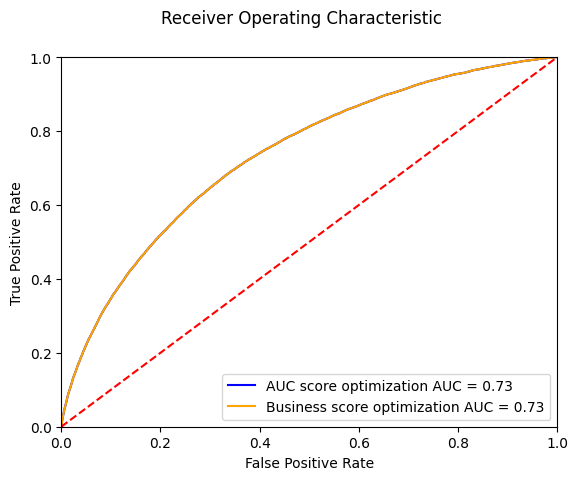

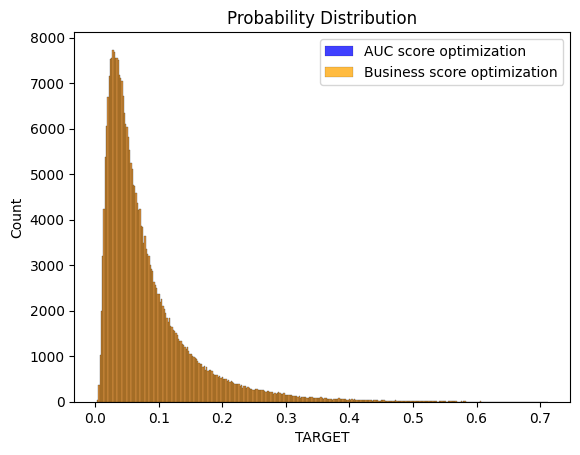

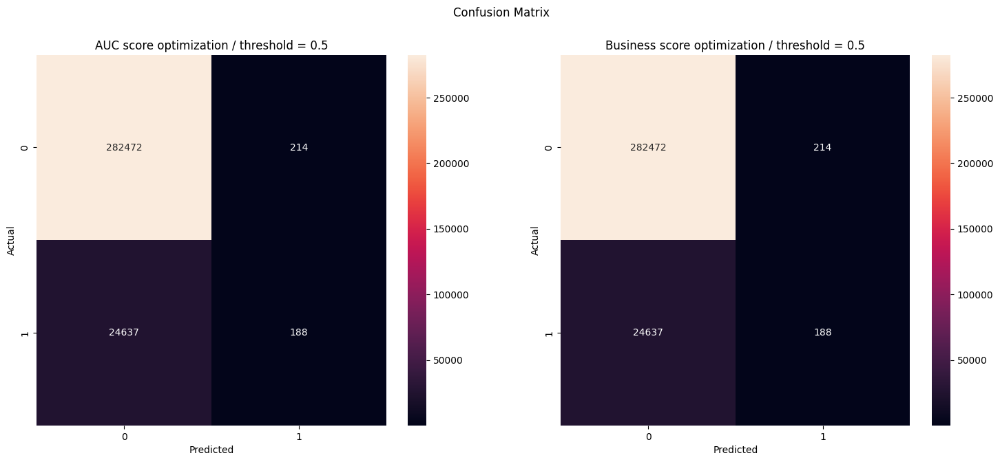

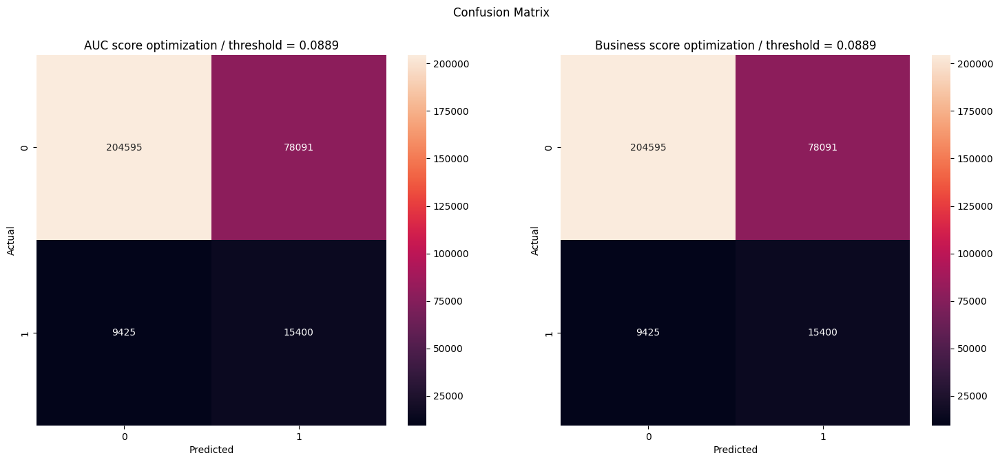

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.47      0.01      0.01     24825

    accuracy                           0.92    307511
   macro avg       0.69      0.50      0.49    307511
weighted avg       0.88      0.92      0.88    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.47      0.01      0.01     24825

    accuracy                           0.92    307511
   macro avg       0.69      0.50      0.49    307511
weighted avg       0.88      0.92      0.88    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LogisticRegression & class_weight (scoring AUC),0.919187,0.007573,0.467662,0.014905,0.733897,246584,0.5000,3.563916
LogisticRegression & class_weight (scoring AUC) / best thresh,0.715405,0.620342,0.164722,0.260320,0.733897,172341,0.0889,3.563916
LogisticRegression & class_weight (scoring Business),0.919187,0.007573,0.467662,0.014905,0.733897,246584,0.5000,3.509839
LogisticRegression & class_weight (scoring Business) / best thresh,0.715405,0.620342,0.164722,0.260320,0.733897,172341,0.0889,3.509839


In [81]:
lr = LogisticRegression()
df_lr, model_lr, params_lr, scores_lr, curve_lr = model_res(lr, X, y, {}, smote = False)

In [180]:
df_lr_final = pd.concat([df_lr, df_lr_sm])
df_lr_final.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)

,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LogisticRegression & class_weight (scoring Business) / best thresh,0.715405,0.620342,0.164722,0.260320,0.733897,172341,0.0889,3.509839
LogisticRegression & class_weight (scoring AUC) / best thresh,0.715405,0.620342,0.164722,0.260320,0.733897,172341,0.0889,3.563916
LogisticRegression & smote (scoring Business) / best thresh,0.706589,0.624814,0.160862,0.255854,0.729737,174053,0.5204,12.289219
LogisticRegression & smote (scoring AUC) / best thresh,0.706589,0.624814,0.160862,0.255854,0.729737,174053,0.5204,12.317034
LogisticRegression & smote (scoring Business),0.684444,0.652165,0.154792,0.250199,0.729737,174752,0.5000,12.289219
LogisticRegression & smote (scoring AUC),0.684444,0.652165,0.154792,0.250199,0.729737,174752,0.5000,12.317034
LogisticRegression & class_weight (scoring Business),0.919187,0.007573,0.467662,0.014905,0.733897,246584,0.5000,3.509839
LogisticRegression & class_weight (scoring AUC),0.919187,0.007573,0.467662,0.014905,0.733897,246584,0.5000,3.563916


In [308]:
run_mlflow_experiment(model_lr[1], 
                      'Best_LogReg_simple', 'logreg_roc.png', params_lr[1], scores_lr[3], 3.509839, curve_lr)

<Figure size 640x480 with 0 Axes>

In [792]:
# curve_lr.savefig('logreg_roc.png')

## 3.3 LGBM

In [92]:
param_lgb = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
              'num_leaves':range(10,100,10),
              'min_child_samples':range(500,1000,100),
              'reg_alpha':[0.1,0.01,0.2,0.3],
              'reg_lambda':[0.1,0.01,0.2,0.3],
             'n_estimators':range(50,300,50),
              'max_bin': range(500,1500,100)}

param_lgb2 = {}
for key in param_lgb.keys():
    param_lgb2['classifier__'+key] = param_lgb[key]

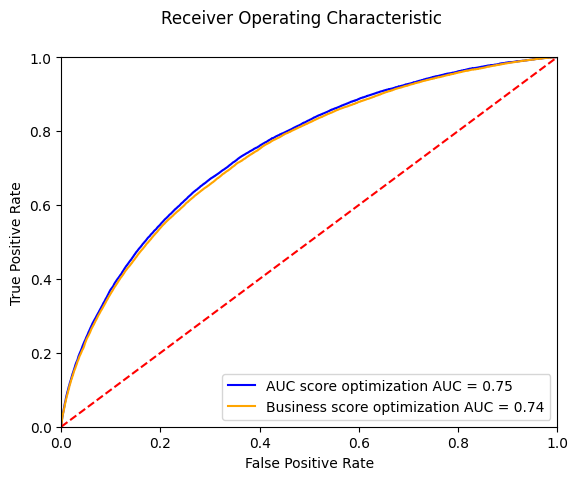

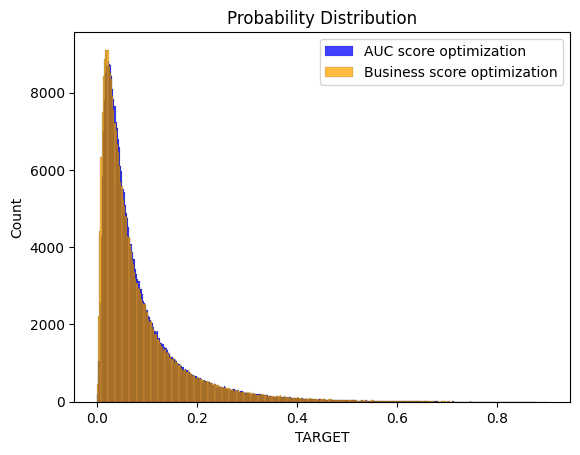

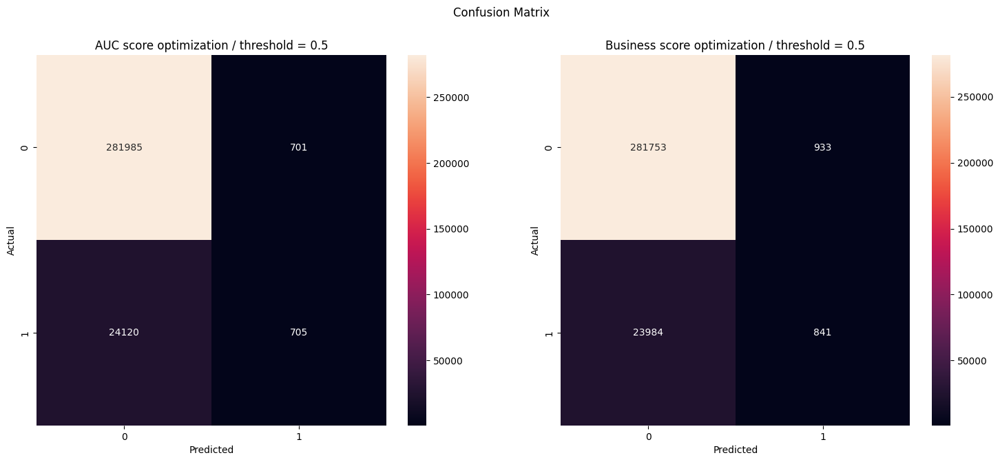

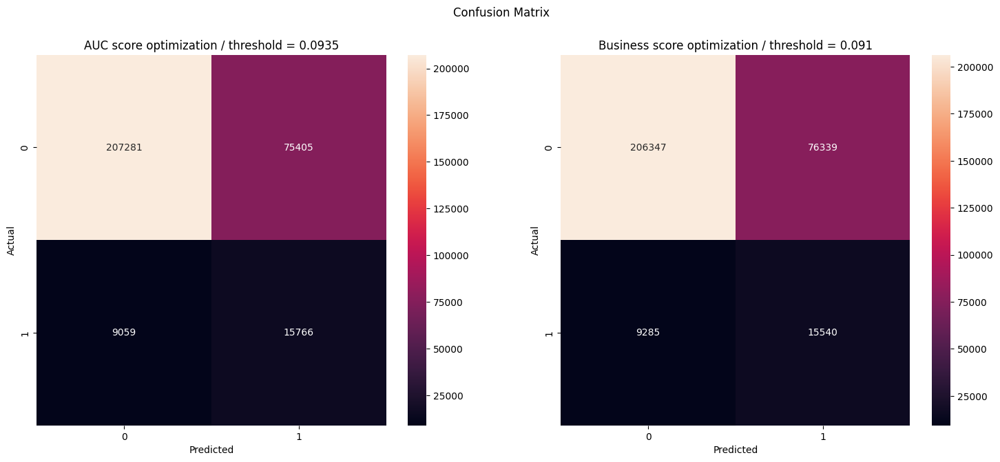

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.50      0.03      0.05     24825

    accuracy                           0.92    307511
   macro avg       0.71      0.51      0.51    307511
weighted avg       0.89      0.92      0.88    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.47      0.03      0.06     24825

    accuracy                           0.92    307511
   macro avg       0.70      0.52      0.51    307511
weighted avg       0.89      0.92      0.89    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LGBMClassifier & smote (scoring AUC),0.919284,0.028399,0.501422,0.053753,0.749834,241901,0.5000,14.594633
LGBMClassifier & smote (scoring AUC) / best thresh,0.725330,0.635086,0.172928,0.271837,0.749834,165995,0.0935,14.594633
LGBMClassifier & smote (scoring Business),0.918972,0.033877,0.474070,0.063235,0.743063,240773,0.5000,10.462448
LGBMClassifier & smote (scoring Business) / best thresh,0.721558,0.625982,0.169135,0.266315,0.743063,169189,0.0910,10.462448


In [105]:
df_lgb_sm, model_lgb_sm, params_lgb_sm, scores_lgb_sm, curve_lgb_sm = model_res(LGBMClassifier(random_state = 100, 
                                                                                                   n_jobs=-1),
                                                                                    X, y, param_lgb2, smote = True)

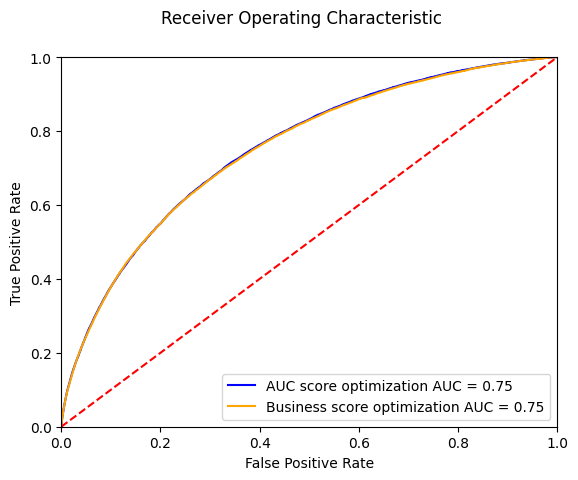

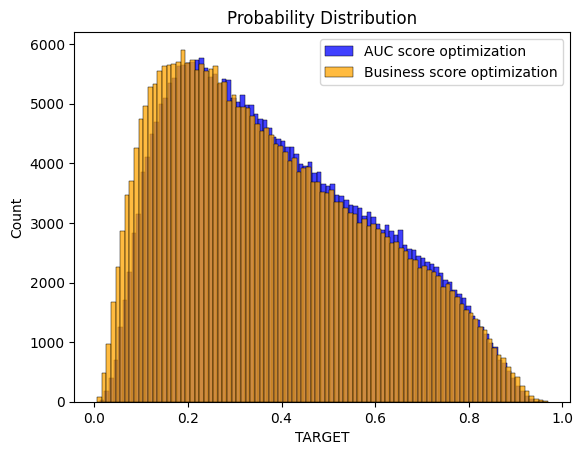

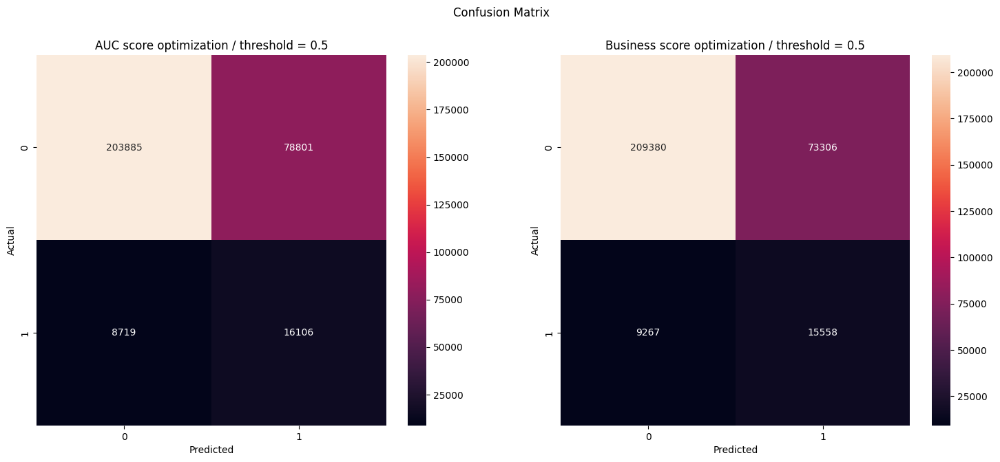

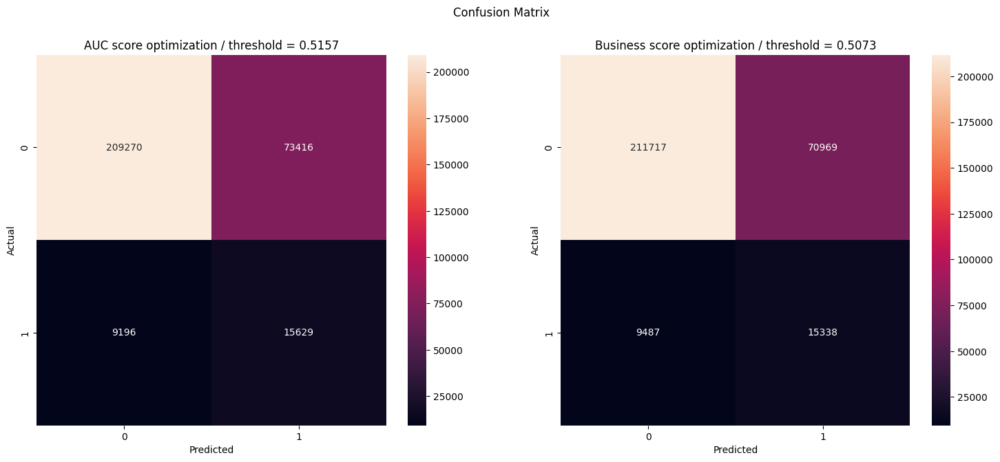

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.72      0.82    282686
           1       0.17      0.65      0.27     24825

    accuracy                           0.72    307511
   macro avg       0.56      0.69      0.55    307511
weighted avg       0.90      0.72      0.78    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.74      0.84    282686
           1       0.18      0.63      0.27     24825

    accuracy                           0.73    307511
   macro avg       0.57      0.68      0.55    307511
weighted avg       0.89      0.73      0.79    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LGBMClassifier & class_weight (scoring AUC),0.715392,0.648781,0.169703,0.269034,0.752192,165991,0.5000,2.363127
LGBMClassifier & class_weight (scoring AUC) / best thresh,0.731353,0.629567,0.175518,0.274506,0.752192,165376,0.5157,2.363127
LGBMClassifier & class_weight (scoring Business),0.731480,0.626707,0.175077,0.273694,0.750565,165976,0.5000,4.526732
LGBMClassifier & class_weight (scoring Business) / best thresh,0.738364,0.617845,0.177714,0.276032,0.750565,165839,0.5073,4.526732


In [311]:
df_lgb, model_lgb, params_lgb, scores_lgb, curve_lgb = model_res(LGBMClassifier(random_state = 100, n_jobs=-1,
                                                                                class_weight = 'balanced'), 
                                                                 X, y, param_lgb)

In [312]:
df_lgb_final = pd.concat([df_lgb, df_lgb_sm])
df_lgb_final.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)

,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
LGBMClassifier & class_weight (scoring AUC) / best thresh,0.731353,0.629567,0.175518,0.274506,0.752192,165376,0.5157,2.363127
LGBMClassifier & class_weight (scoring Business) / best thresh,0.738364,0.617845,0.177714,0.276032,0.750565,165839,0.5073,4.526732
LGBMClassifier & class_weight (scoring Business),0.731480,0.626707,0.175077,0.273694,0.750565,165976,0.5000,4.526732
LGBMClassifier & class_weight (scoring AUC),0.715392,0.648781,0.169703,0.269034,0.752192,165991,0.5000,2.363127
LGBMClassifier & smote (scoring AUC) / best thresh,0.725330,0.635086,0.172928,0.271837,0.749834,165995,0.0935,14.594633
LGBMClassifier & smote (scoring Business) / best thresh,0.721558,0.625982,0.169135,0.266315,0.743063,169189,0.0910,10.462448
LGBMClassifier & smote (scoring Business),0.918972,0.033877,0.474070,0.063235,0.743063,240773,0.5000,10.462448
LGBMClassifier & smote (scoring AUC),0.919284,0.028399,0.501422,0.053753,0.749834,241901,0.5000,14.594633


In [313]:
run_mlflow_experiment(model_lgb[0], 
                      'Best_LGMClassifier', 'lgbm_roc.png', params_lgb[0], scores_lgb[2], 2.363127, curve_lgb)

<Figure size 640x480 with 0 Axes>

In [793]:
# curve_lgb.savefig('lgbm_roc.png')

## 3.4 XGBoost

In [107]:
param_xgb = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
              'subsample':[1,0.5,0.2,0.1],
              'max_depth' : range(2,11,1),
              'n_estimators':range(50,300,50)}

param_xgb2 = {}
for key in param_xgb.keys():
    param_xgb2['classifier__'+key] = param_xgb[key]

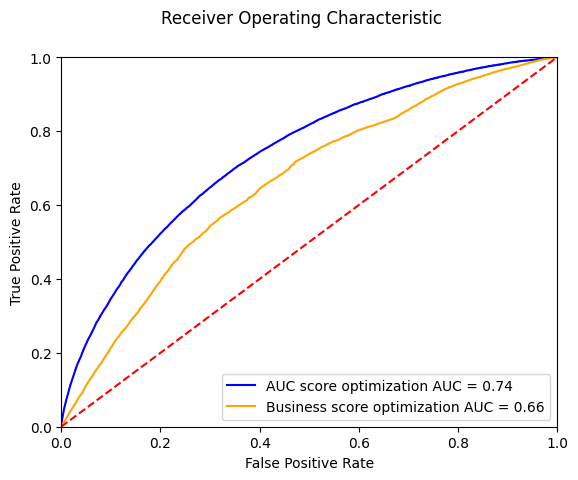

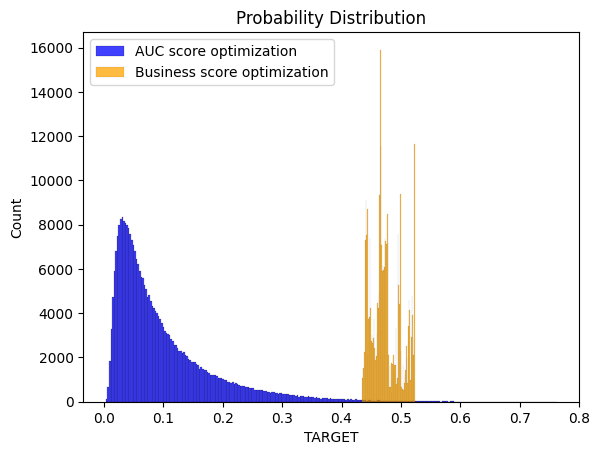

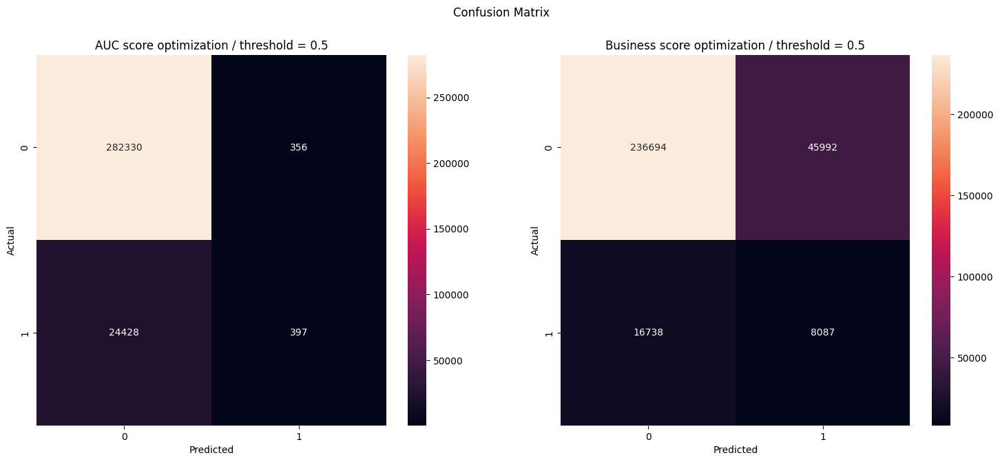

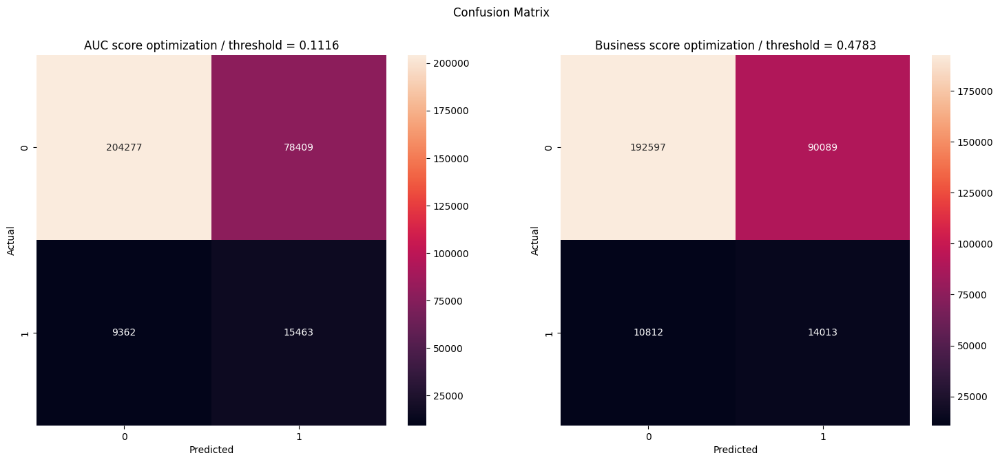

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.53      0.02      0.03     24825

    accuracy                           0.92    307511
   macro avg       0.72      0.51      0.49    307511
weighted avg       0.89      0.92      0.88    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.93      0.84      0.88    282686
           1       0.15      0.33      0.20     24825

    accuracy                           0.80    307511
   macro avg       0.54      0.58      0.54    307511
weighted avg       0.87      0.80      0.83    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
XGBClassifier & smote (scoring AUC),0.919405,0.015992,0.527224,0.031042,0.737228,244636,0.5000,87.916601
XGBClassifier & smote (scoring AUC) / best thresh,0.714576,0.622880,0.164724,0.260546,0.737228,172029,0.1116,87.916601
XGBClassifier & smote (scoring Business),0.796007,0.325760,0.149540,0.204983,0.659990,213372,0.5000,46.213736
XGBClassifier & smote (scoring Business) / best thresh,0.671878,0.564471,0.134608,0.217379,0.659990,198209,0.4783,46.213736


In [113]:
df_xgb_sm, model_xgb_sm, params_xgb_sm, scores_xgb_sm, curve_xg_sm = model_res(XGBClassifier(random_state = 100, n_jobs=-1), 
                                                                                X, y, param_xgb2, smote = True)

In [108]:
counter = Counter(y)
estimate = counter[0] / counter[1]
print('Estimate: %.3f' % estimate)

Estimate: 11.387


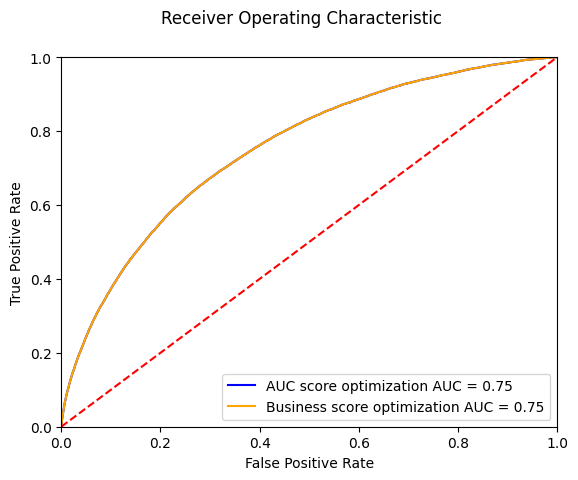

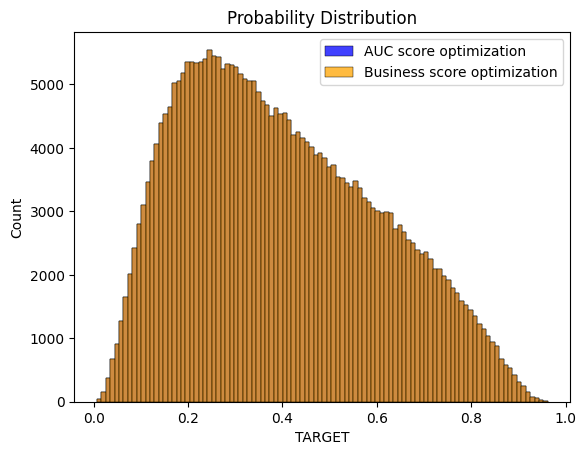

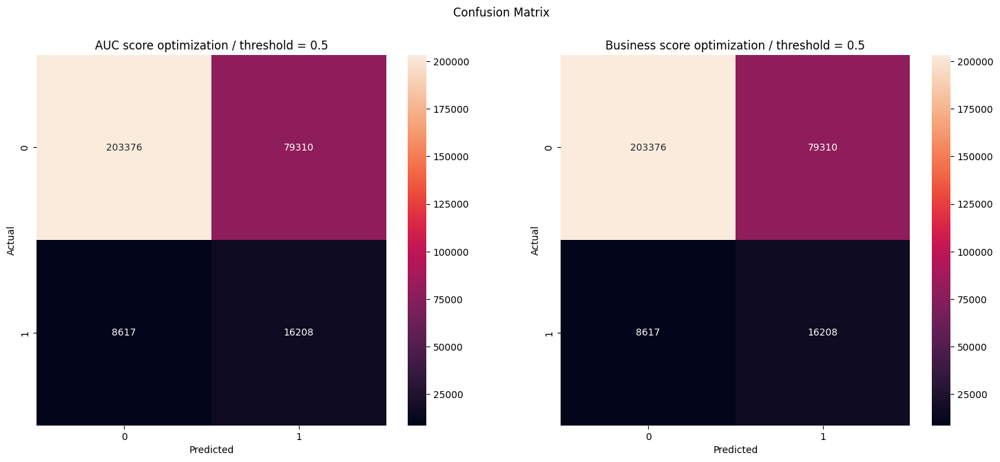

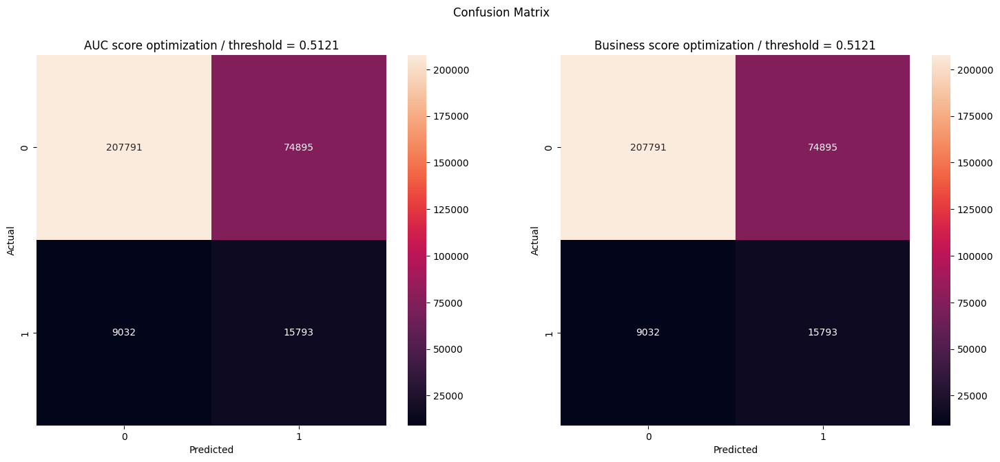

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.72      0.82    282686
           1       0.17      0.65      0.27     24825

    accuracy                           0.71    307511
   macro avg       0.56      0.69      0.55    307511
weighted avg       0.90      0.71      0.78    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.96      0.72      0.82    282686
           1       0.17      0.65      0.27     24825

    accuracy                           0.71    307511
   macro avg       0.56      0.69      0.55    307511
weighted avg       0.90      0.71      0.78    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
XGBClassifier & class_weight (scoring AUC),0.714069,0.652890,0.169685,0.269363,0.7514,165480,0.5000,34.514814
XGBClassifier & class_weight (scoring AUC) / best thresh,0.727076,0.636173,0.174147,0.273441,0.7514,165215,0.5121,34.514814
XGBClassifier & class_weight (scoring Business),0.714069,0.652890,0.169685,0.269363,0.7514,165480,0.5000,35.094375
XGBClassifier & class_weight (scoring Business) / best thresh,0.727076,0.636173,0.174147,0.273441,0.7514,165215,0.5121,35.094375


In [109]:
df_xgb, model_xgb, params_xgb, scores_xgb, curve_xgb = model_res(XGBClassifier(random_state = 100, n_jobs=-1, 
                                                                               scale_pos_weight = estimate), 
                                                                 X, y, param_xgb)

In [182]:
df_xgb_final = pd.concat([df_xgb, df_xgb_sm])
df_xgb_final.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)

,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
XGBClassifier & class_weight (scoring AUC) / best thresh,0.727076,0.636173,0.174147,0.273441,0.751400,165215,0.5121,34.514814
XGBClassifier & class_weight (scoring Business) / best thresh,0.727076,0.636173,0.174147,0.273441,0.751400,165215,0.5121,35.094375
XGBClassifier & class_weight (scoring AUC),0.714069,0.652890,0.169685,0.269363,0.751400,165480,0.5000,34.514814
XGBClassifier & class_weight (scoring Business),0.714069,0.652890,0.169685,0.269363,0.751400,165480,0.5000,35.094375
XGBClassifier & smote (scoring AUC) / best thresh,0.714576,0.622880,0.164724,0.260546,0.737228,172029,0.1116,87.916601
XGBClassifier & smote (scoring Business) / best thresh,0.671878,0.564471,0.134608,0.217379,0.659990,198209,0.4783,46.213736
XGBClassifier & smote (scoring Business),0.796007,0.325760,0.149540,0.204983,0.659990,213372,0.5000,46.213736
XGBClassifier & smote (scoring AUC),0.919405,0.015992,0.527224,0.031042,0.737228,244636,0.5000,87.916601


In [314]:
run_mlflow_experiment(model_xgb[0], 
                      'Best_XGBClassifier', 'xgb_roc.png', params_xgb[0], scores_xgb[2], 34.514814, curve_xgb)

<Figure size 640x480 with 0 Axes>

In [794]:
# curve_xgb.savefig('xgb_roc.png')

## 3.5 AdaBoost

In [174]:
param_ada = {'learning_rate':[0.2,0.1,0.01,0.05,0.001],
              'algorithm': ['SAMME', 'SAMME.R'],
              'n_estimators':range(50,300,50)}

param_ada2 = {}
for key in param_ada.keys():
    param_ada2['classifier__'+key] = param_ada[key]

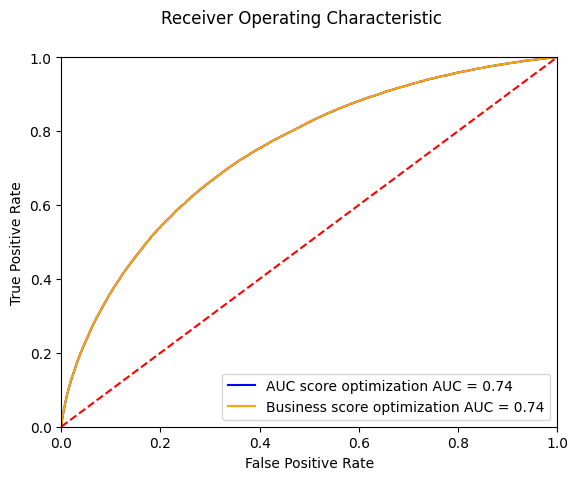

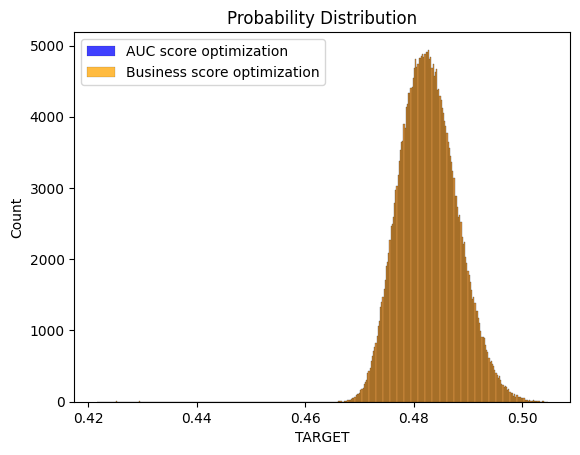

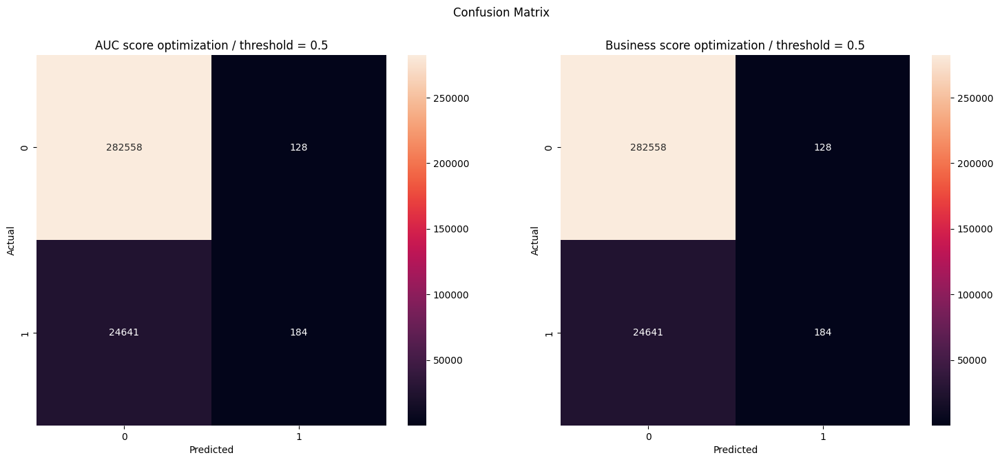

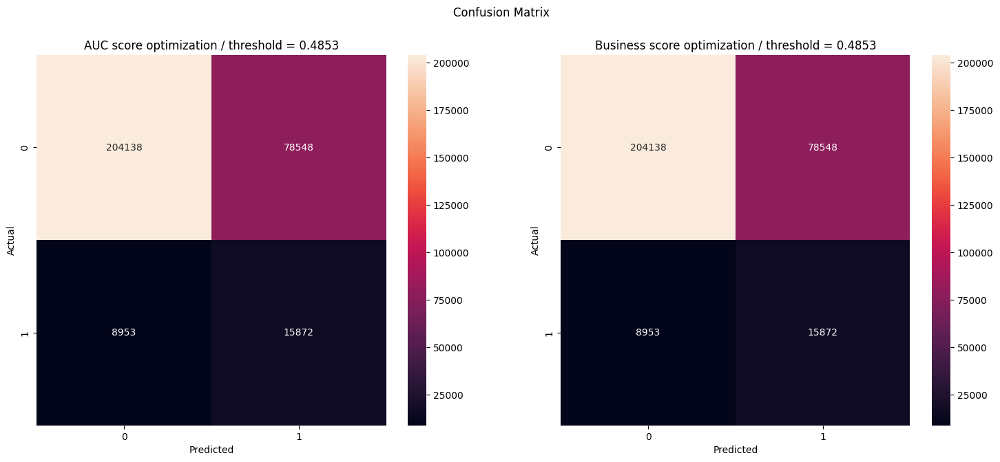

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.59      0.01      0.01     24825

    accuracy                           0.92    307511
   macro avg       0.75      0.50      0.49    307511
weighted avg       0.89      0.92      0.88    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.59      0.01      0.01     24825

    accuracy                           0.92    307511
   macro avg       0.75      0.50      0.49    307511
weighted avg       0.89      0.92      0.88    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
AdaBoostClassifier & class_weight (scoring AUC),0.919453,0.007412,0.589744,0.014640,0.74478,246538,0.5000,387.087664
AdaBoostClassifier & class_weight (scoring AUC) / best thresh,0.715454,0.639355,0.168100,0.266208,0.74478,168078,0.4853,387.087664
AdaBoostClassifier & class_weight (scoring Business),0.919453,0.007412,0.589744,0.014640,0.74478,246538,0.5000,182.060805
AdaBoostClassifier & class_weight (scoring Business) / best thresh,0.715454,0.639355,0.168100,0.266208,0.74478,168078,0.4853,182.060805


In [172]:
df_ada, model_ada, params_ada, scores_ada, curve_ada = model_res(AdaBoostClassifier(random_state = 100), 
                                                                 X, y, param_ada)

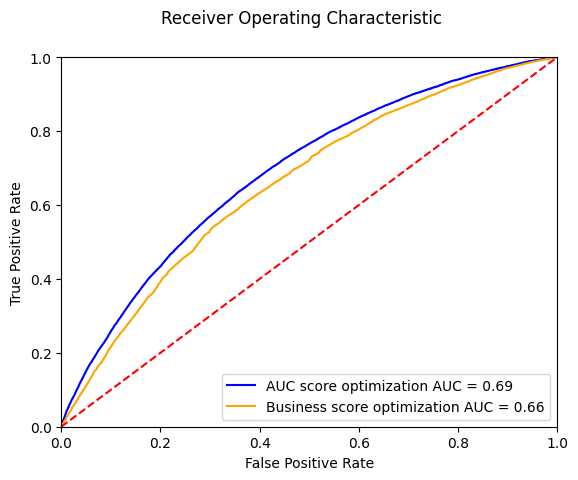

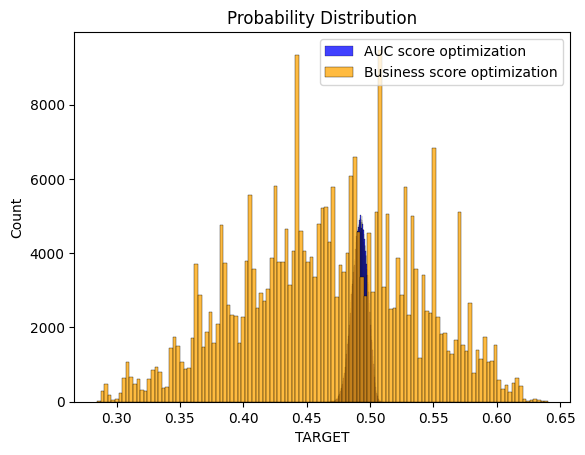

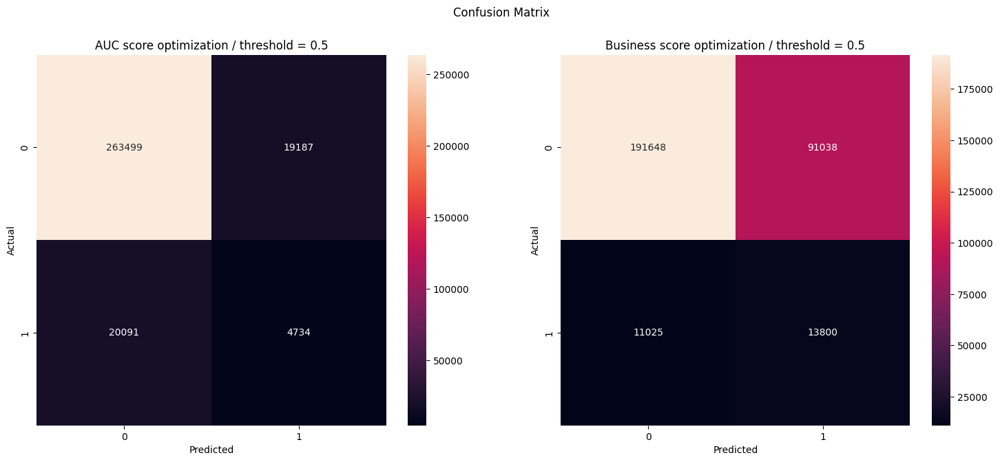

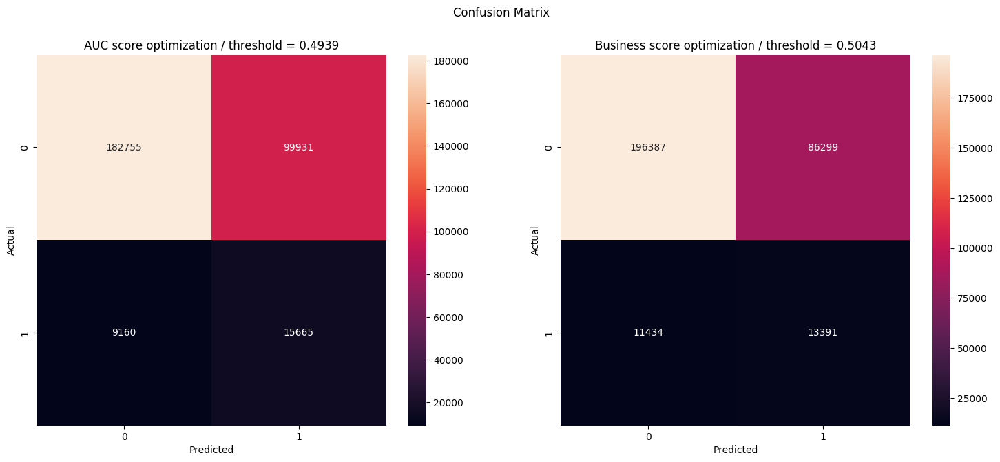

Classification Report / AUC score Optimization 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93    282686
           1       0.20      0.19      0.19     24825

    accuracy                           0.87    307511
   macro avg       0.56      0.56      0.56    307511
weighted avg       0.87      0.87      0.87    307511
 

 Classification Report / Business score Optimization 
               precision    recall  f1-score   support

           0       0.95      0.68      0.79    282686
           1       0.13      0.56      0.21     24825

    accuracy                           0.67    307511
   macro avg       0.54      0.62      0.50    307511
weighted avg       0.88      0.67      0.74    307511



,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
AdaBoostClassifier & smote (scoring AUC),0.872271,0.190695,0.197901,0.194231,0.688295,220097,0.5000,341.309053
AdaBoostClassifier & smote (scoring AUC) / best thresh,0.645245,0.631017,0.135515,0.223115,0.688295,191531,0.4939,341.309053
AdaBoostClassifier & smote (scoring Business),0.668100,0.555891,0.131632,0.212859,0.657915,201288,0.5000,165.396598
AdaBoostClassifier & smote (scoring Business) / best thresh,0.682180,0.539416,0.134326,0.215091,0.657915,200639,0.5043,165.396598


In [176]:
df_ada_sm, model_ada_sm, params_ada_sm, scores_ada_sm, curve_ada_sm = model_res(AdaBoostClassifier(random_state = 100), 
                                                                                X, y, param_ada2, smote = True)

In [178]:
df_ada_final = pd.concat([df_ada, df_ada_sm])
df_ada_final.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)

,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
AdaBoostClassifier & class_weight (scoring Business) / best thresh,0.715454,0.639355,0.168100,0.266208,0.744780,168078,0.4853,182.060805
AdaBoostClassifier & class_weight (scoring AUC) / best thresh,0.715454,0.639355,0.168100,0.266208,0.744780,168078,0.4853,387.087664
AdaBoostClassifier & smote (scoring AUC) / best thresh,0.645245,0.631017,0.135515,0.223115,0.688295,191531,0.4939,341.309053
AdaBoostClassifier & smote (scoring Business) / best thresh,0.682180,0.539416,0.134326,0.215091,0.657915,200639,0.5043,165.396598
AdaBoostClassifier & smote (scoring Business),0.668100,0.555891,0.131632,0.212859,0.657915,201288,0.5000,165.396598
AdaBoostClassifier & smote (scoring AUC),0.872271,0.190695,0.197901,0.194231,0.688295,220097,0.5000,341.309053
AdaBoostClassifier & class_weight (scoring Business),0.919453,0.007412,0.589744,0.014640,0.744780,246538,0.5000,182.060805
AdaBoostClassifier & class_weight (scoring AUC),0.919453,0.007412,0.589744,0.014640,0.744780,246538,0.5000,387.087664


In [315]:
run_mlflow_experiment(model_ada[1], 
                      'Best_AdaBoostClassifier', 'ada_roc.png', params_ada[1], scores_ada[3], 182.060805, curve_ada)

<Figure size 640x480 with 0 Axes>

In [795]:
# curve_ada.savefig('ada_roc.png')

# 4. ROC-Curve, comparaison des meilleurs modèles

In [217]:
liste_df = [df_dum_final, df_lr_final, df_ada_final, df_xgb_final, df_lgb_final]
df_comp = pd.DataFrame()
for df in liste_df:
    df= df.reset_index()
    df = df.sort_values(by = 'time', 
                        ascending = True).sort_values(by = ['roc_auc', 
                                                            'accuracy'], 
                                                      ascending = False).sort_values(by = 'business_score', 
                                                                                     ascending = True)
    df_comp = pd.concat([df_comp, df.head(1)])
df_comp

,index,accuracy,precision,recall,f1-score,roc_auc,business_score,threshold,time
2,DummyClassifier & class_weight (scoring Business),0.852031,0.080765,0.081217,0.080990,0.500264,250882,0.5000,0.137990
3,LogisticRegression & class_weight (scoring Bus...,0.715405,0.620342,0.164722,0.260320,0.733897,172341,0.0889,3.509839
3,AdaBoostClassifier & class_weight (scoring Bus...,0.715454,0.639355,0.168100,0.266208,0.744780,168078,0.4853,182.060805
1,XGBClassifier & class_weight (scoring AUC) / b...,0.727076,0.636173,0.174147,0.273441,0.751400,165215,0.5121,34.514814
1,LGBMClassifier & class_weight (scoring AUC) / ...,0.731353,0.629567,0.175518,0.274506,0.752192,165376,0.5157,2.324171


In [218]:
models = [model_dum[1], model_lr[1], model_ada[1], model_xgb[0], model_lgb[0]]

result_table = pd.DataFrame(columns=['models', 'fpr','tpr','auc'])

for model in models:
    yproba = model.predict_proba(X)[::,1]
    
    fpr, tpr, _ = roc_curve(y,  yproba)
    aucroc = roc_auc_score(y, yproba)
    
    result_table = result_table.append({'models':model.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':aucroc}, ignore_index=True)

result_table.set_index('models', inplace=True)

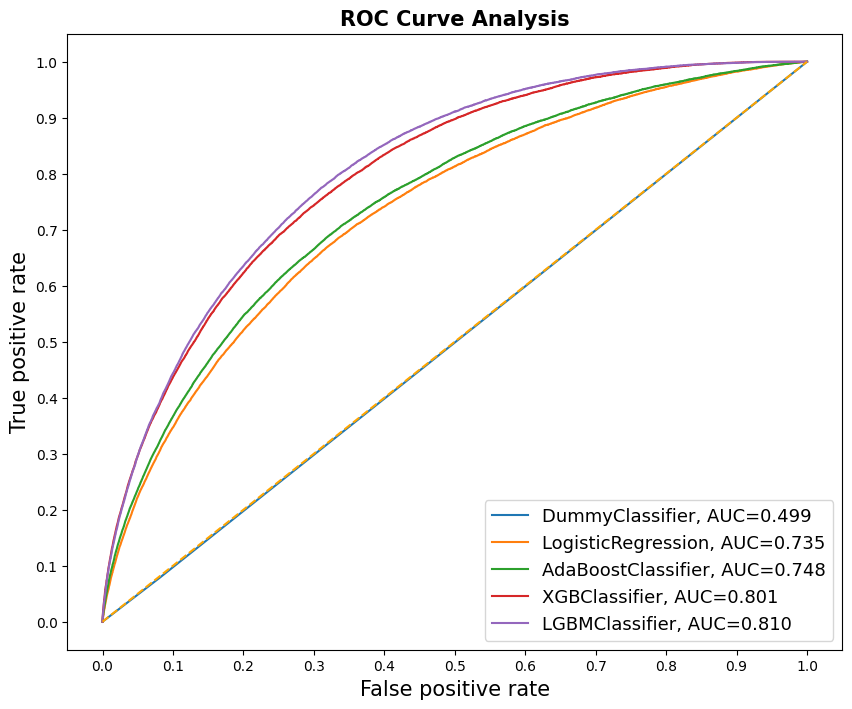

In [219]:
fig = plt.figure(figsize=(10,8))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc'])
             )
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False positive rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True positive rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

# 5. Pipeline de référence

In [322]:
transfo = joblib.load('col_transfo.joblib')

In [339]:
transfo

ColumnTransformer(transformers=[('Cat',
                                 Pipeline(steps=[('LabelImputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('Encoder',
                                                  OrdinalEncoder())]),
                                 Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_...
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15',
       'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object'))])

In [333]:
logged_model = 'runs:/e46c27c6fbfe4fd3884be624f3f7cad3/LGBMClassifier'
model_ref = mlflow.sklearn.load_model(logged_model)

In [334]:
model_ref

LGBMClassifier(class_weight='balanced', max_bin=500, min_child_samples=800,
               num_leaves=70, random_state=100, reg_alpha=0.2, reg_lambda=0.1)

In [335]:
final_pipe = Pipeline([('transformer',transfo), ('model', model_ref)])

In [336]:
joblib.dump(final_pipe, 'model.joblib')

['model.joblib']

# 6. Feature importance et interprétabilité

In [8]:
pipe_test = joblib.load('model.joblib')

In [9]:
y_pred_test = pipe_test.predict_proba(train)

In [10]:
train_test = train.copy()
train_test['proba'] = pd.DataFrame(y_pred_test)[1]

## 6.1 Features les plus corrélées aux targets

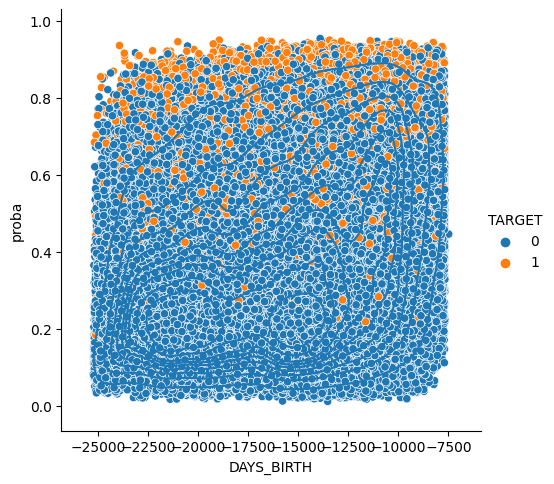

In [572]:
sns.relplot(x='DAYS_BIRTH', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='DAYS_BIRTH', y='proba', data=train_test);

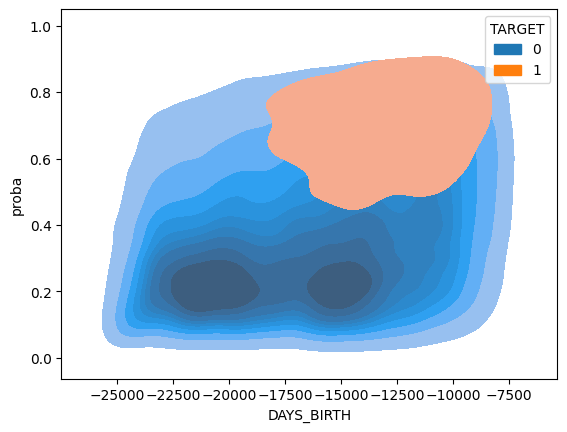

In [573]:
sns.kdeplot(data=train_test, x="DAYS_BIRTH", y="proba", hue="TARGET", fill=True);

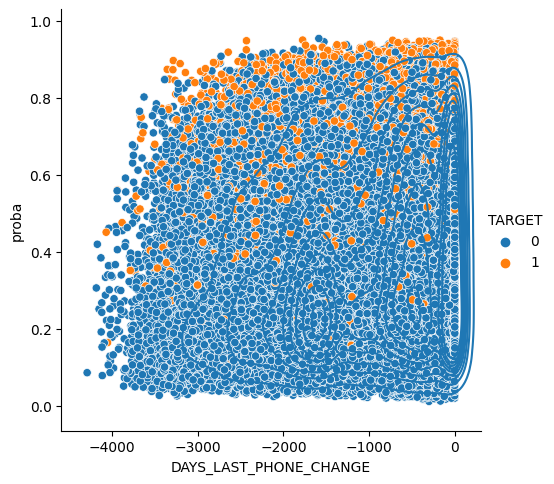

In [574]:
sns.relplot(x='DAYS_LAST_PHONE_CHANGE', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='DAYS_LAST_PHONE_CHANGE', y='proba', data=train_test);

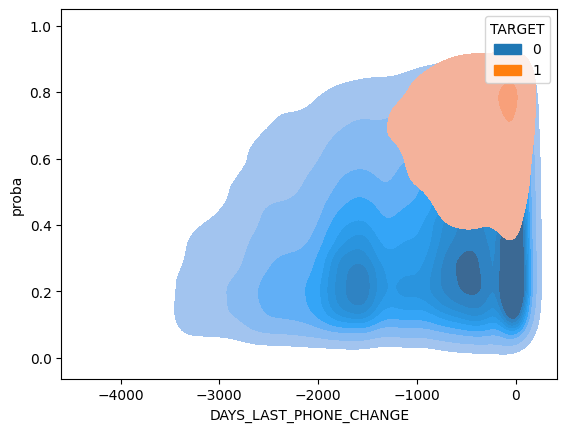

In [575]:
sns.kdeplot(data=train_test, x="DAYS_LAST_PHONE_CHANGE", y="proba", hue="TARGET", fill=True);

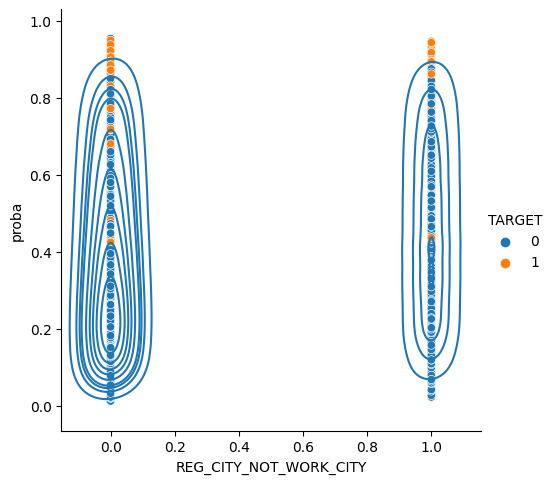

In [576]:
sns.relplot(x='REG_CITY_NOT_WORK_CITY', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='REG_CITY_NOT_WORK_CITY', y='proba', data=train_test);

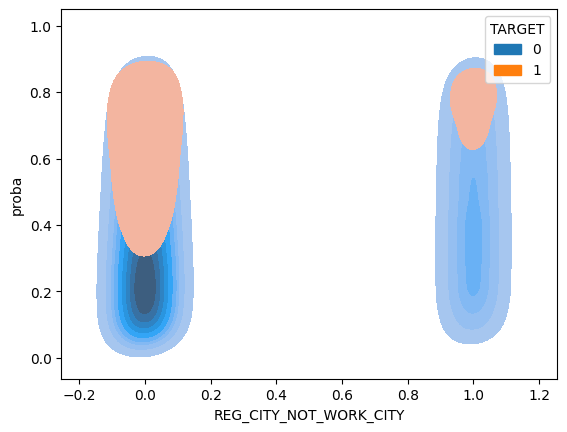

In [577]:
sns.kdeplot(data=train_test, x="REG_CITY_NOT_WORK_CITY", y="proba", hue="TARGET", fill=True);

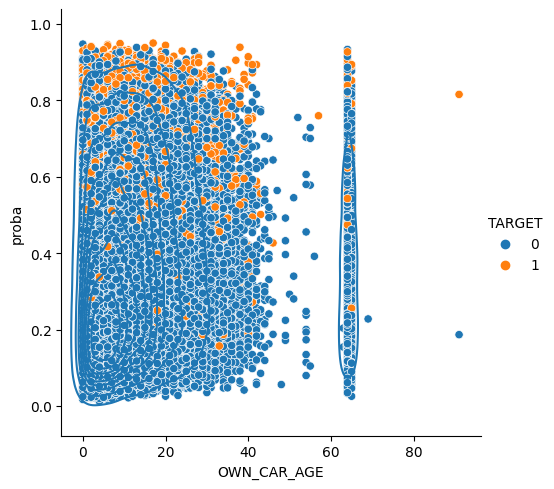

In [578]:
sns.relplot(x='OWN_CAR_AGE', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='OWN_CAR_AGE', y='proba', data=train_test);

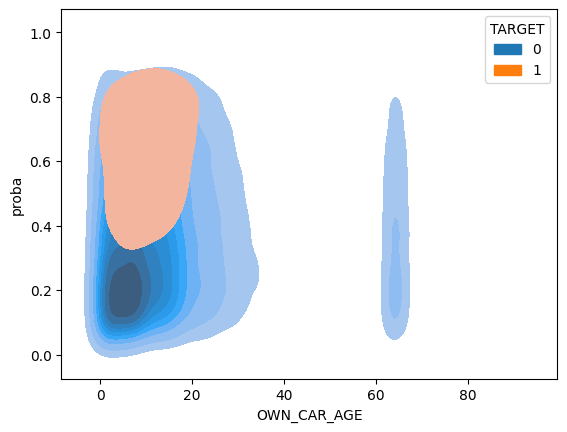

In [579]:
sns.kdeplot(data=train_test, x="OWN_CAR_AGE", y="proba", hue="TARGET", fill=True);

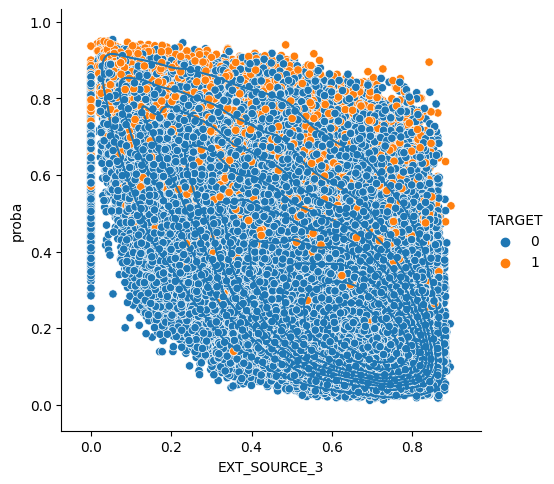

In [580]:
sns.relplot(x='EXT_SOURCE_3', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='EXT_SOURCE_3', y='proba', data=train_test);

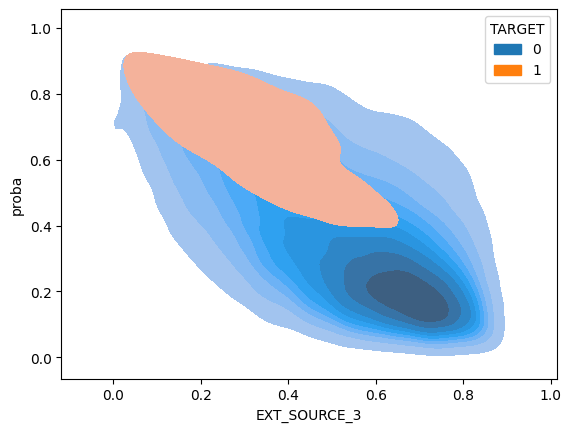

In [581]:
sns.kdeplot(data=train_test, x="EXT_SOURCE_3", y="proba", hue="TARGET", fill=True);

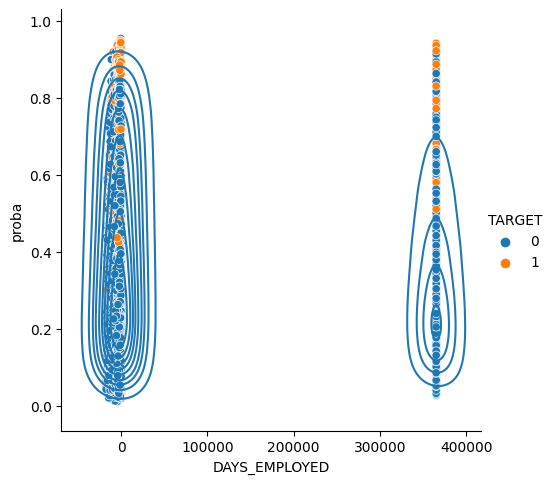

In [582]:
sns.relplot(x='DAYS_EMPLOYED', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='DAYS_EMPLOYED', y='proba', data=train_test);

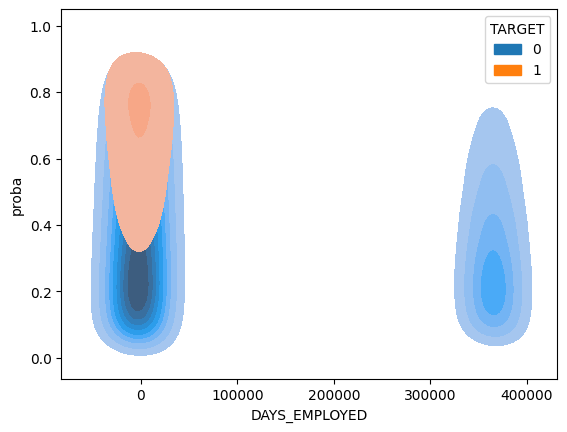

In [583]:
sns.kdeplot(data=train_test, x="DAYS_EMPLOYED", y="proba", hue="TARGET", fill=True);

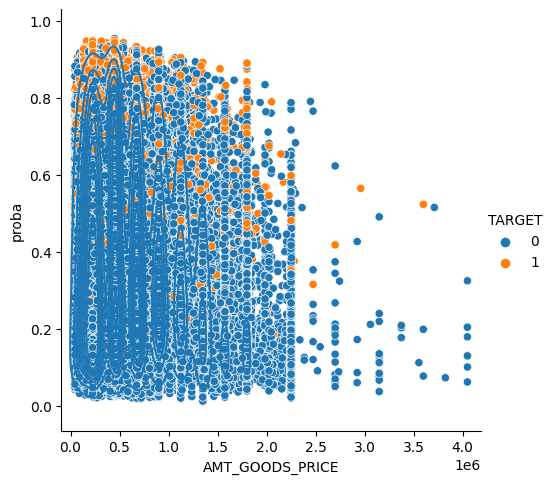

In [584]:
sns.relplot(x='AMT_GOODS_PRICE', y='proba', hue='TARGET', data=train_test)
sns.kdeplot(x='AMT_GOODS_PRICE', y='proba', data=train_test);

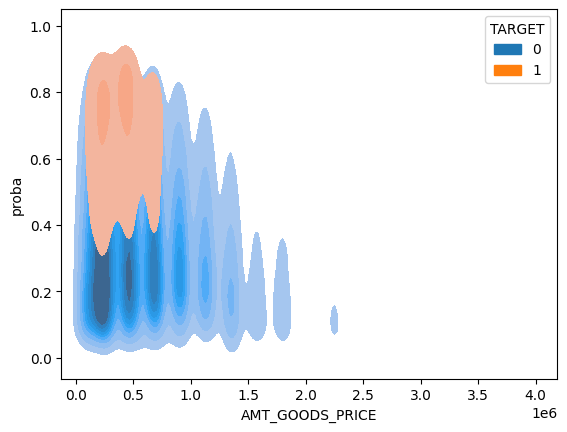

In [585]:
sns.kdeplot(data=train_test, x="AMT_GOODS_PRICE", y="proba", hue="TARGET", fill=True);

## 6.2 Feature importance de LGBM

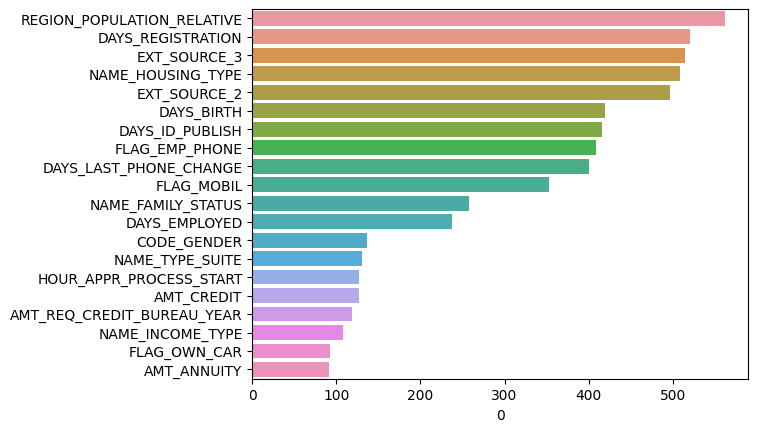

In [806]:
df_feat = pd.DataFrame(pipe_test[1].feature_importances_, index = X.columns).sort_values(by = 0, ascending = False)
fig, ax = plt.subplots()
sns.barplot(x=df_feat.head(20)[0], y=df_feat.head(20).index, ax = ax);

In [807]:
fig.savefig('Feat_importance.png', bbox_inches = 'tight')

In [11]:
y_pred_test_proba = pipe_test.predict_proba(test)
test_test = test.copy()
test_test['proba'] = pd.DataFrame(y_pred_test_proba)[1]

In [587]:
test_test.loc[0, 'proba']

0.23976326263999773

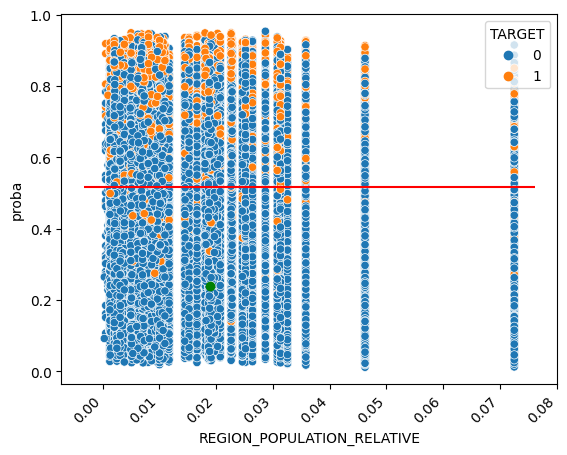

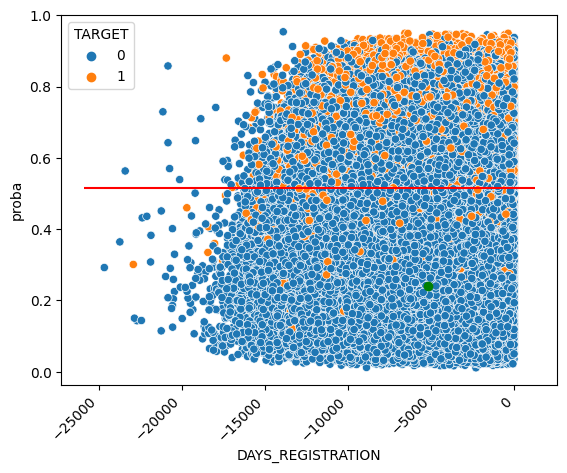

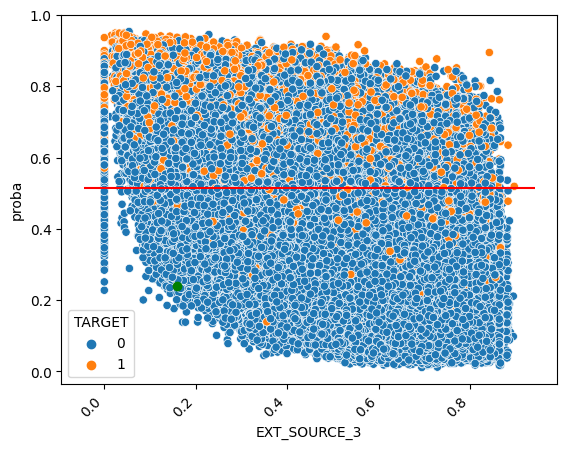

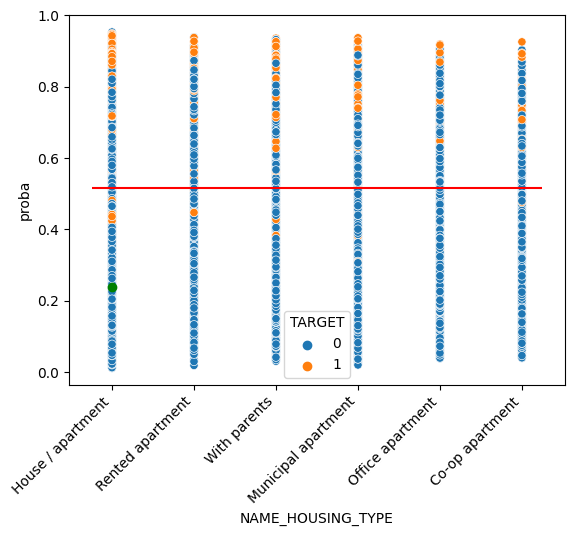

In [591]:
for feat in df_feat.head(4).index:
    fig, ax = plt.subplots(1,1)
    sns.scatterplot(x=feat, y ='proba', hue = 'TARGET', data = train_test, ax = ax)
    x_min, x_max, y_min, y_max = plt.axis()
    plt.hlines(y = 0.5157, xmin = x_min, xmax = x_max, color = 'red')
    xp = test_test.loc[0, feat]
    yp = test_test.loc[0, 'proba']
    plt.plot(xp, yp, marker = 'o', color = 'green')
    plt.xticks(rotation = 45, ha = 'right');

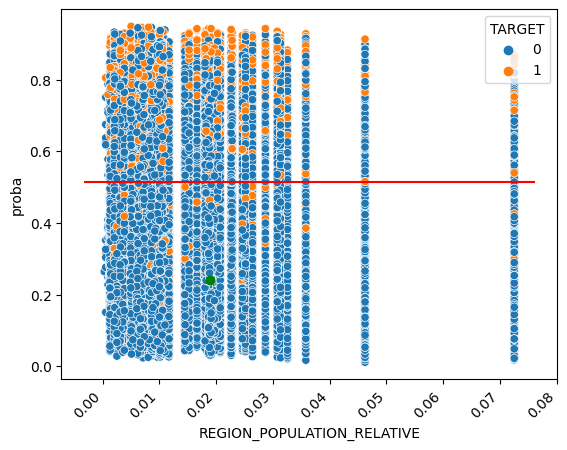

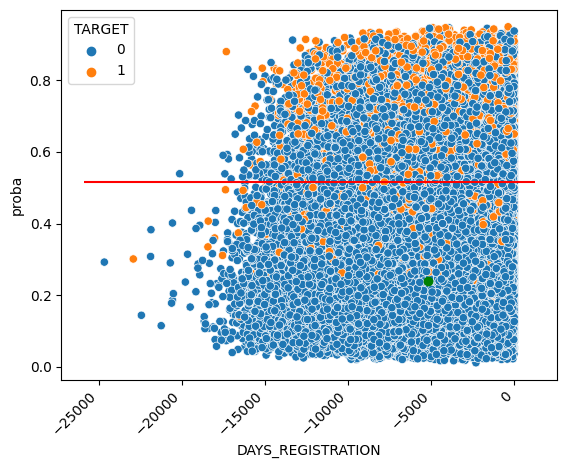

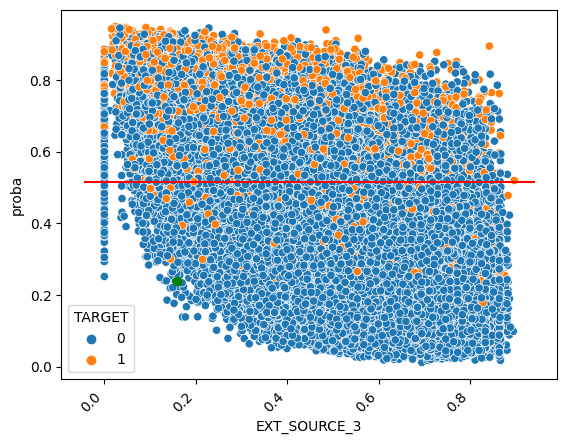

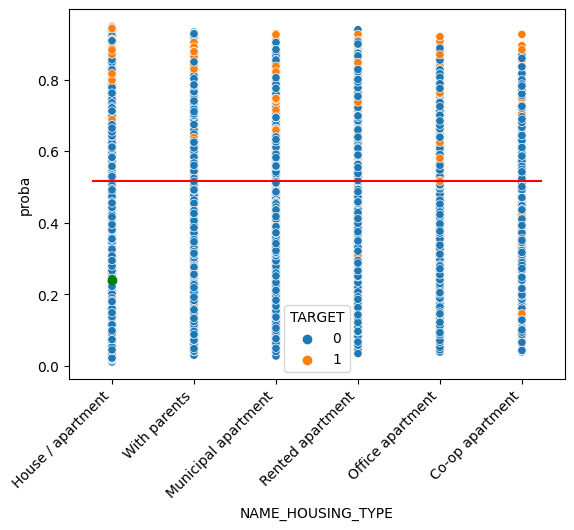

In [602]:
train_samp, X_samp = train_test_split(train_test, test_size = 0.5, stratify = train_test[['TARGET']])

for feat in df_feat.head(4).index:
    fig, ax = plt.subplots(1,1)
    sns.scatterplot(x=feat, y ='proba', hue = 'TARGET', data = train_samp, ax = ax)
    x_min, x_max, y_min, y_max = plt.axis()
    plt.hlines(y = 0.5157, xmin = x_min, xmax = x_max, color = 'red')
    xp = test_test.loc[0, feat]
    yp = test_test.loc[0, 'proba']
    plt.plot(xp, yp, marker = 'o', color = 'green')
    plt.xticks(rotation = 45, ha = 'right');

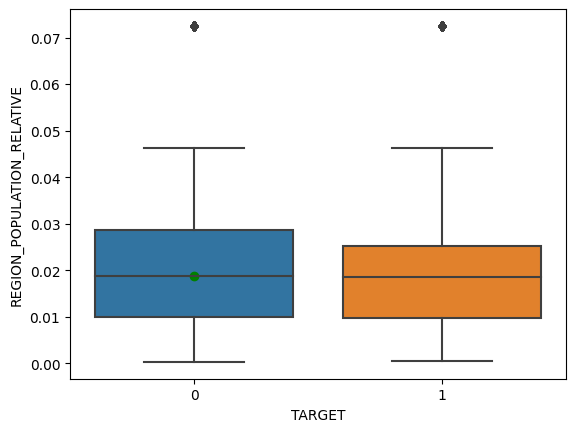

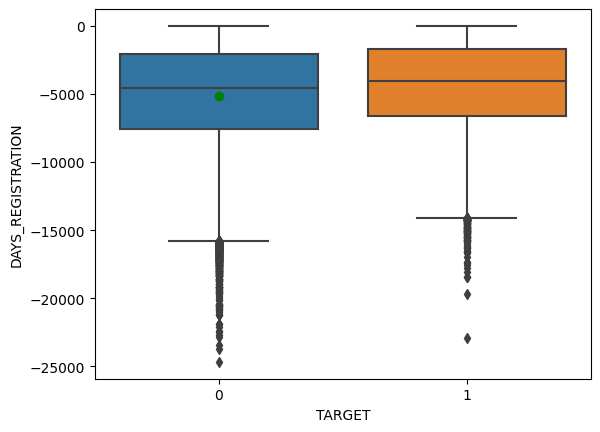

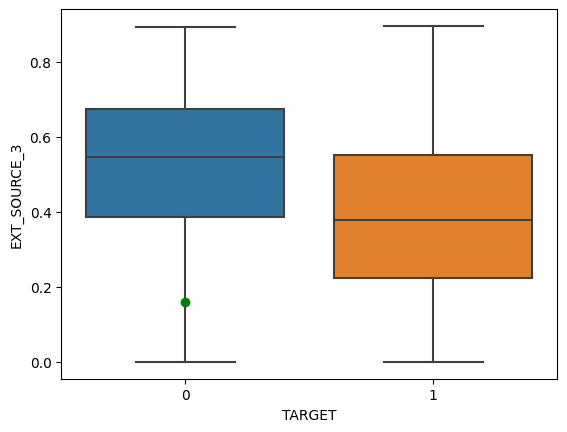

In [592]:
for feat in df_feat.head(3).index:
    fig, ax = plt.subplots(1,1)
    sns.boxplot(x= 'TARGET', y = feat, data = train_test)
    xp = test_test.loc[0, feat]
    plt.plot(0, xp, marker = 'o', color = 'green');

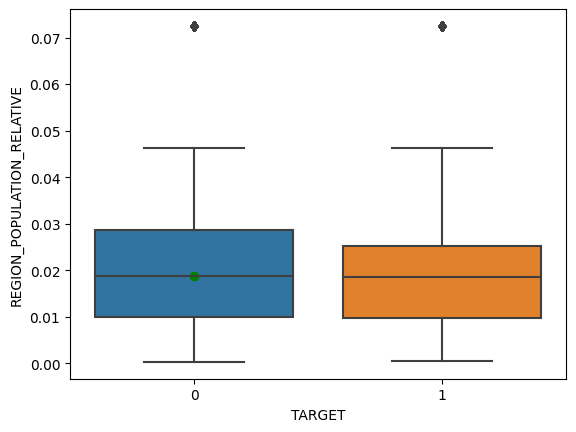

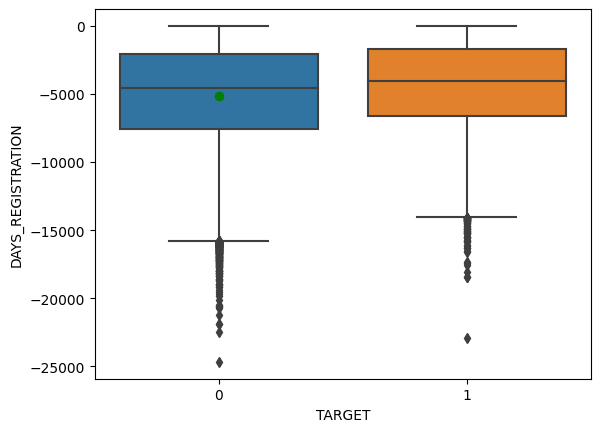

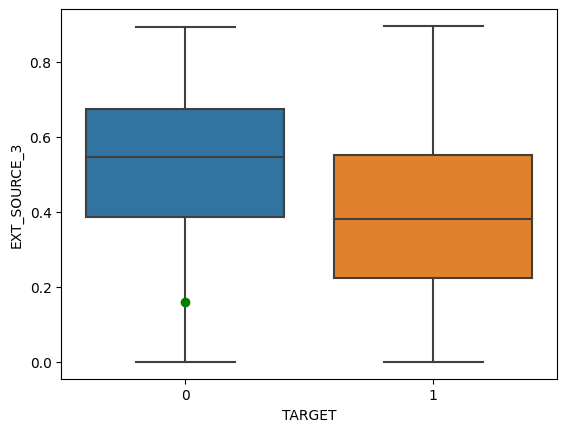

In [663]:
for feat in df_feat.head(3).index:
    fig, ax = plt.subplots(1,1)
    sns.boxplot(x= 'TARGET', y = feat, data = train_samp)
    xp = test_test.loc[0, feat]
    plt.plot(0, xp, marker = 'o', color = 'green');

In [782]:
train_samp.to_csv('new_train.csv')

In [785]:
max(train['SK_ID_CURR'])

456255

In [787]:
max(test['SK_ID_CURR'])

456250

## 6.3 SHAP

In [711]:
explainer = shap.TreeExplainer(pipe_test[1])

In [712]:
%%time
X_shap = pd.DataFrame(pipe_test[0].transform(train[col]), columns = col)
shap_val = explainer.shap_values(X_shap)

CPU times: total: 24min 26s
Wall time: 1min 41s


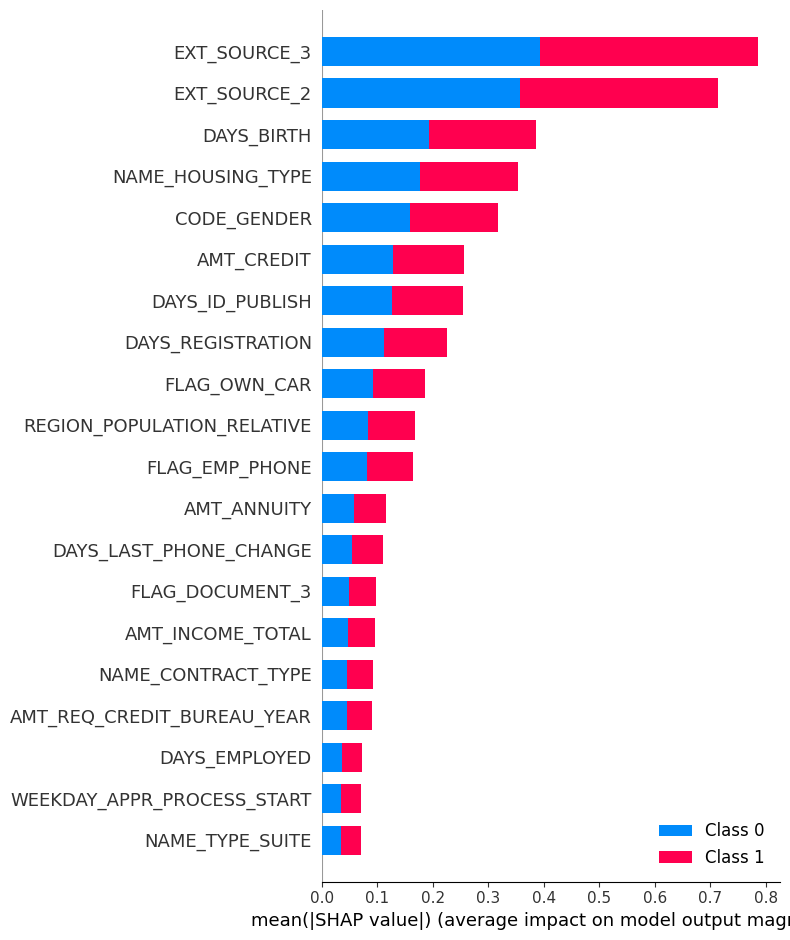

In [796]:
fig = shap.summary_plot(shap_val, X_shap, show = False)
plt.savefig('Shap_exp.png')
plt.show()

In [640]:
%%time
X_shap2 = pd.DataFrame(pipe_test[0].transform(train_samp[col]), columns = col)
shap_val2 = explainer.shap_values(X_shap2)

CPU times: total: 11min 40s
Wall time: 47.2 s


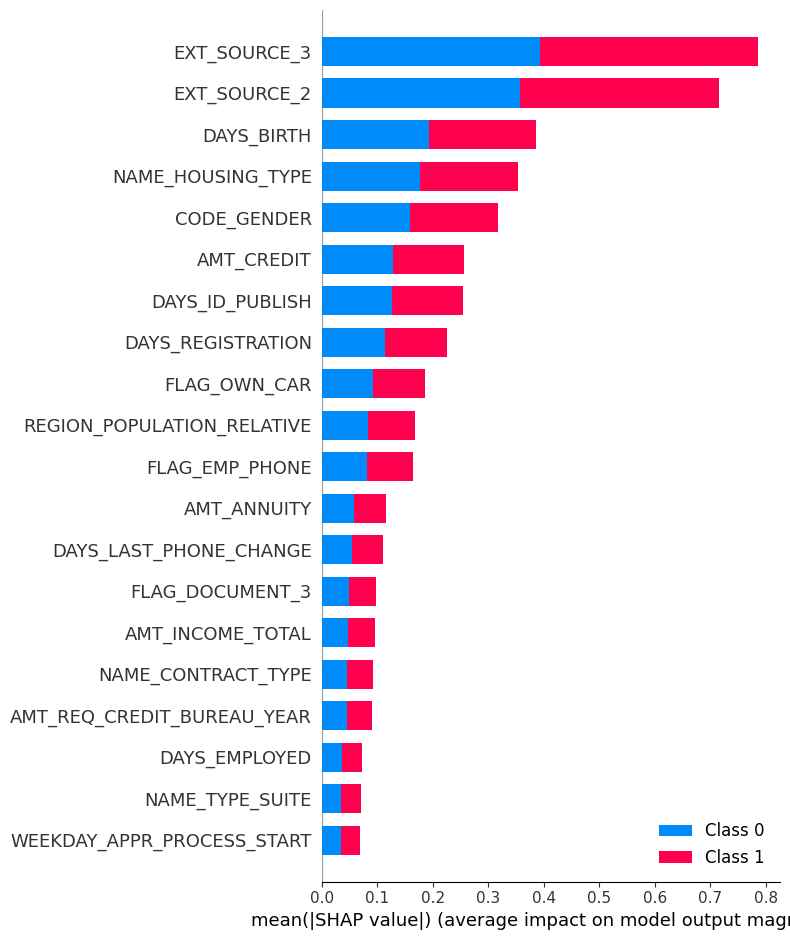

In [641]:
shap.summary_plot(shap_val2, X_shap2)

In [815]:
df_shap = pd.DataFrame(shap_val2[0], columns = X_shap2.columns)

In [816]:
vals = np.abs(df_shap.values).mean(0)
shap_importance = pd.DataFrame(list(zip(col, vals)), columns=['col_name', 'feature_importance_vals'])
shap_importance.sort_values(by=['feature_importance_vals'], ascending=False, inplace=True)

In [818]:
features = list(shap_importance['col_name'])

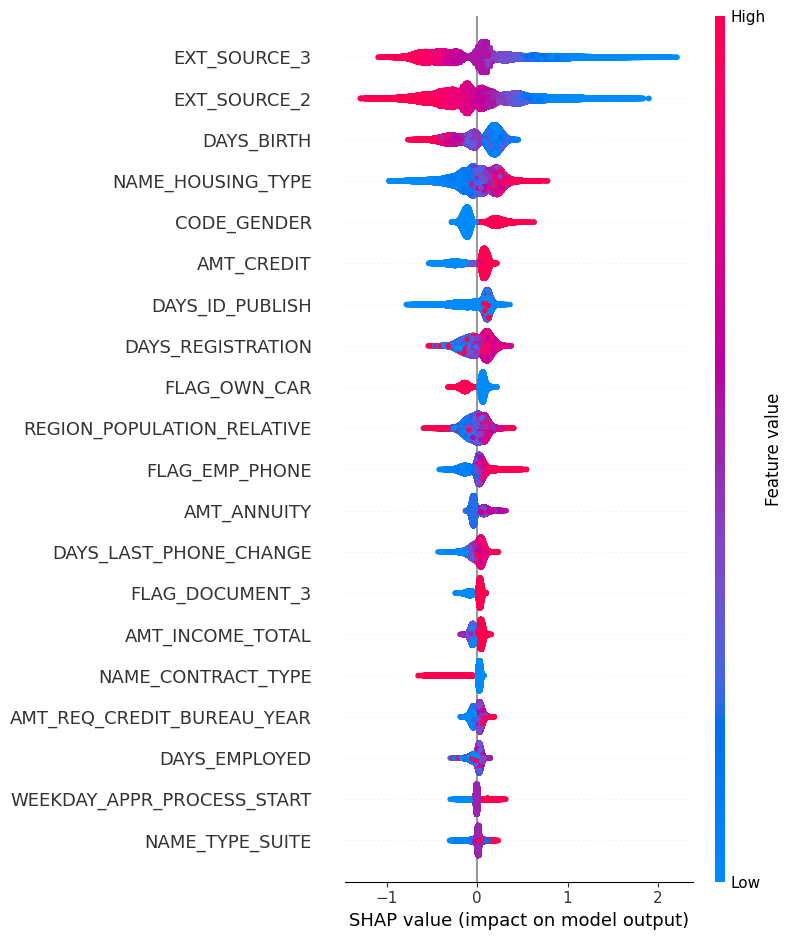

In [721]:
shap.summary_plot(shap_val[1], X_shap)

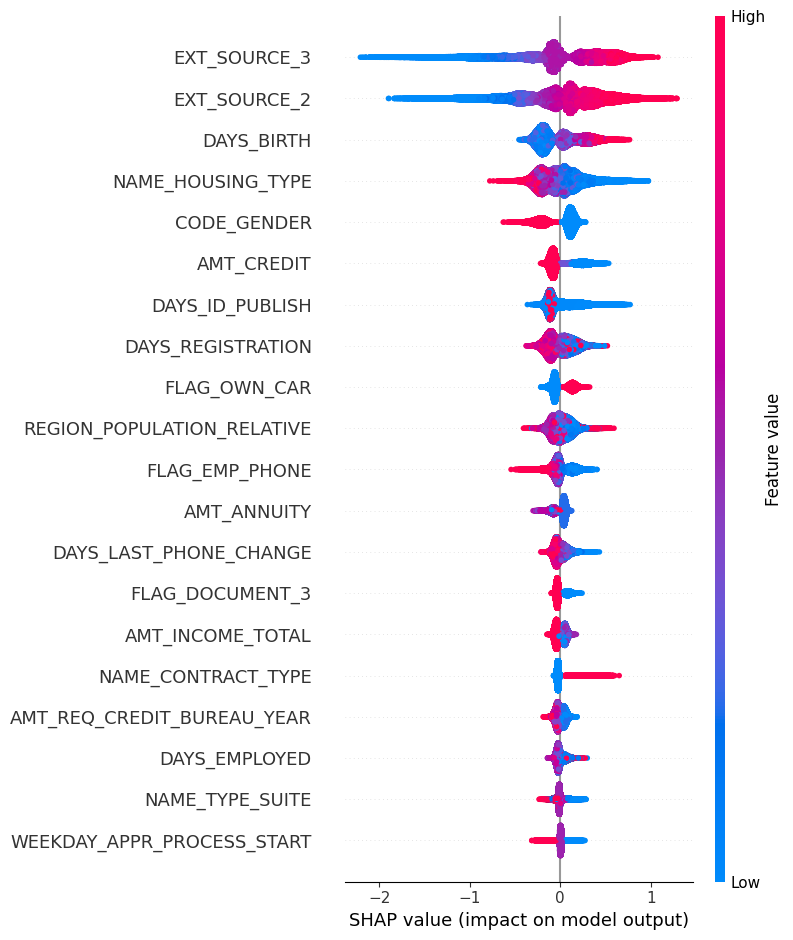

In [654]:
shap.summary_plot(shap_val2[0], X_shap2)

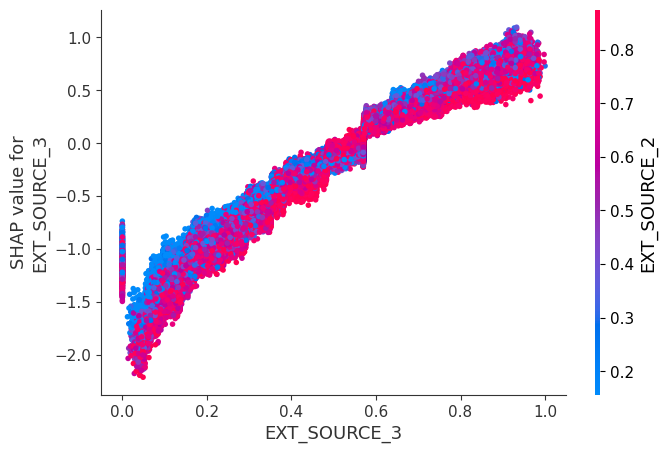

In [761]:
shap.dependence_plot("EXT_SOURCE_3", shap_val[0], X_shap, interaction_index="auto")

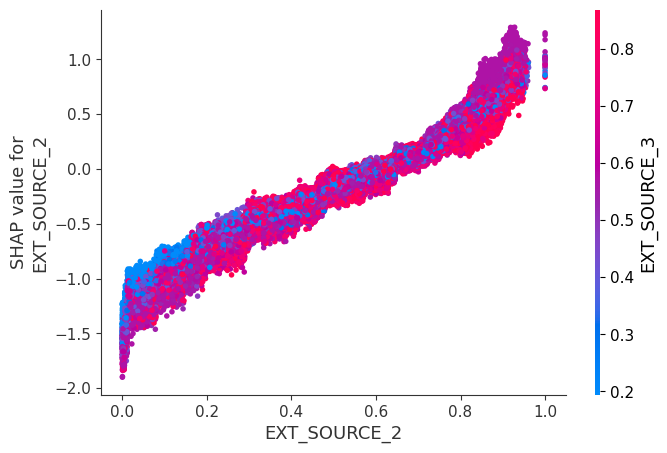

In [764]:
shap.dependence_plot("EXT_SOURCE_2", shap_val[0], X_shap, interaction_index="auto")

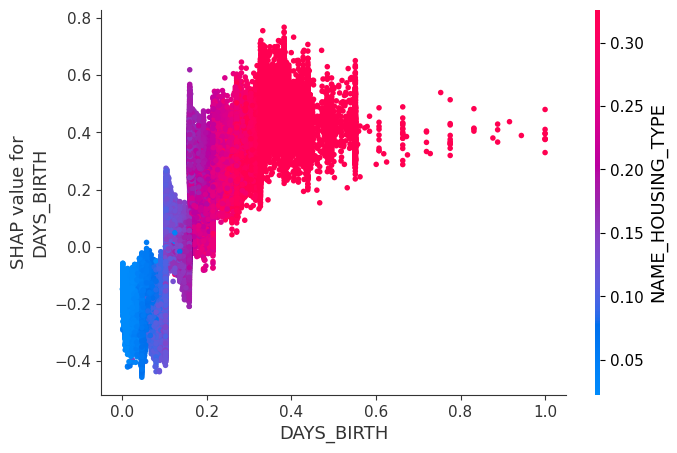

In [765]:
shap.dependence_plot("DAYS_BIRTH", shap_val[0], X_shap, interaction_index="auto")

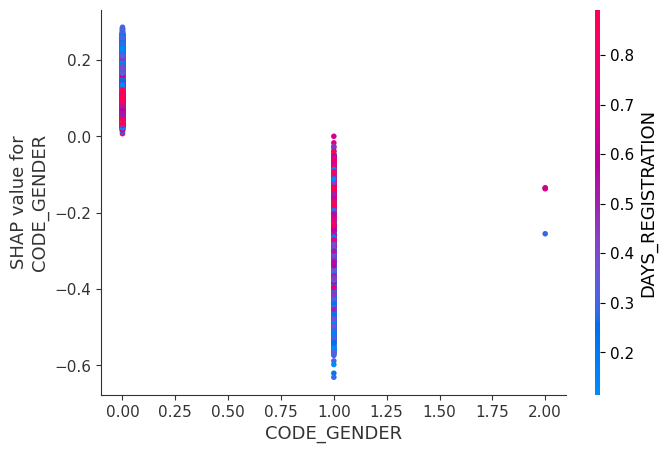

In [766]:
shap.dependence_plot("CODE_GENDER", shap_val[0], X_shap, interaction_index="auto")

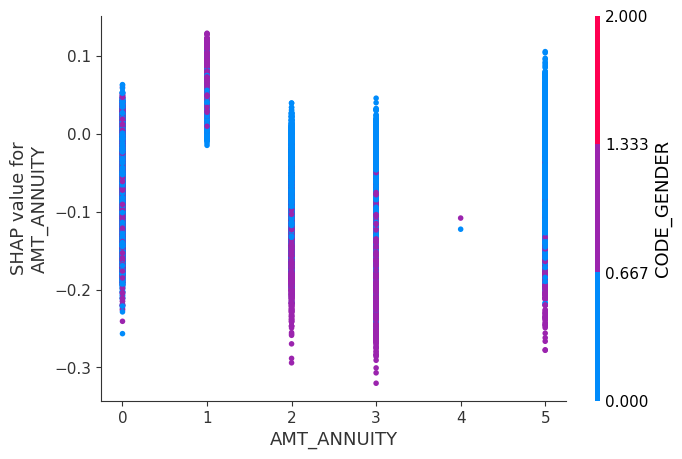

In [763]:
shap.dependence_plot("AMT_ANNUITY", shap_val[0], X_shap)

In [752]:
pipe_test[1].predict_proba(pd.DataFrame(X_shap.iloc[0]).T)[0][1]

0.8420706476507751

In [734]:
shap.initjs()

In [739]:
shap.force_plot(explainer.expected_value[0], shap_val[0][0], X_shap.iloc[0])

In [740]:
shap.force_plot(explainer.expected_value[0], shap_val[0][0:1000], X_shap.iloc[0:1000])

## 6.5 LIME

In [405]:
import lime
from lime.lime_tabular import LimeTabularExplainer

In [655]:
%%time

lime_explainer = LimeTabularExplainer(pipe_test[0].transform(train[col]), 
                                                       feature_names=col, 
                                                       class_names=['0', '1'], 
                                                       verbose=True)

CPU times: total: 5.75 s
Wall time: 6.18 s


In [657]:
test.loc[0,col]

NAME_CONTRACT_TYPE            Cash loans
CODE_GENDER                            F
FLAG_OWN_CAR                           N
FLAG_OWN_REALTY                        Y
CNT_CHILDREN                           0
                                 ...    
AMT_REQ_CREDIT_BUREAU_DAY            0.0
AMT_REQ_CREDIT_BUREAU_WEEK           0.0
AMT_REQ_CREDIT_BUREAU_MON            0.0
AMT_REQ_CREDIT_BUREAU_QRT            0.0
AMT_REQ_CREDIT_BUREAU_YEAR           0.0
Name: 0, Length: 70, dtype: object

In [659]:
transform_data = pipe_test[0].transform(pd.DataFrame(test.loc[0,col]).T)
lime_explanation = lime_explainer.explain_instance(transform_data[0], pipe_test[1].predict_proba)

# Extract feature importance values
feature_importance = {}
for feature, importance in lime_explanation.as_list():
    feature_importance[feature] = importance

Intercept 0.12969360340859382
Prediction_local [0.38779644]
Right: 0.23976326263999773


In [660]:
feature_importance

{'EXT_SOURCE_3 <= 0.47': 0.20242050837005807,
 'EXT_SOURCE_2 > 0.78': -0.135904701237838,
 'FLAG_DOCUMENT_17 <= 0.00': 0.11860408262302026,
 'CODE_GENDER <= 0.00': -0.07739700807077066,
 'FLAG_DOCUMENT_9 <= 0.00': 0.07159528607634133,
 'NAME_CONTRACT_TYPE <= 0.00': 0.0672682028003602,
 'FLAG_DOCUMENT_16 <= 0.00': 0.0627835150766917,
 'FLAG_DOCUMENT_21 <= 0.00': 0.05702306469567449,
 'FLAG_DOCUMENT_15 <= 0.00': -0.05670614720948136,
 'AMT_CREDIT <= 2.00': -0.0515839619582622}

In [809]:
lime_explanation.show_in_notebook(show_table=True)

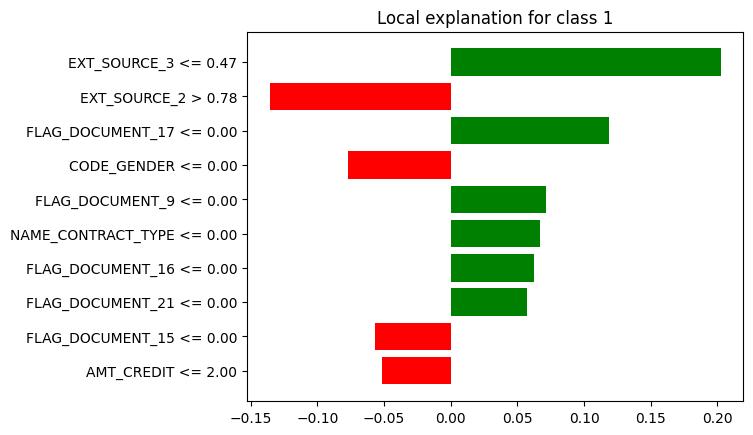

In [662]:
lime_explanation.as_pyplot_figure();

# 7. Analyse du Data Drift

In [271]:
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset

In [272]:
report = Report(metrics=[
    DataDriftPreset(), 
])

report.run(reference_data=train.drop(columns='TARGET'), current_data=test)
report

In [273]:
report.save_html('data_drift_report.html')

In [354]:
report2 = Report(metrics=[
    DataDriftPreset(), 
])

report2.run(reference_data=train[col], current_data=test[col])

In [355]:
report2.save_html('data_drift_model_feat.html')

Comparer avec les features importances

In [437]:
import json
dic_report = json.loads(report2.json())

In [438]:
dic_report.keys()

dict_keys(['version', 'timestamp', 'metrics'])

In [463]:
drifted_feat = dic_report['metrics'][1]['result']['drift_by_columns']

In [469]:
dico_drift = {}
for feat in drifted_feat.keys():
    if drifted_feat[feat]['drift_detected'] == True:
        dico_drift[feat] = round(drifted_feat[feat]['drift_score'], 3)

In [470]:
dico_drift

{'AMT_ANNUITY': 0.161,
 'AMT_CREDIT': 0.207,
 'AMT_GOODS_PRICE': 0.211,
 'AMT_REQ_CREDIT_BUREAU_MON': 0.282,
 'AMT_REQ_CREDIT_BUREAU_QRT': 0.359,
 'AMT_REQ_CREDIT_BUREAU_WEEK': 0.154,
 'DAYS_LAST_PHONE_CHANGE': 0.139,
 'FLAG_EMAIL': 0.122,
 'NAME_CONTRACT_TYPE': 0.148}

In [471]:
drift_col = list(dico_drift.keys())

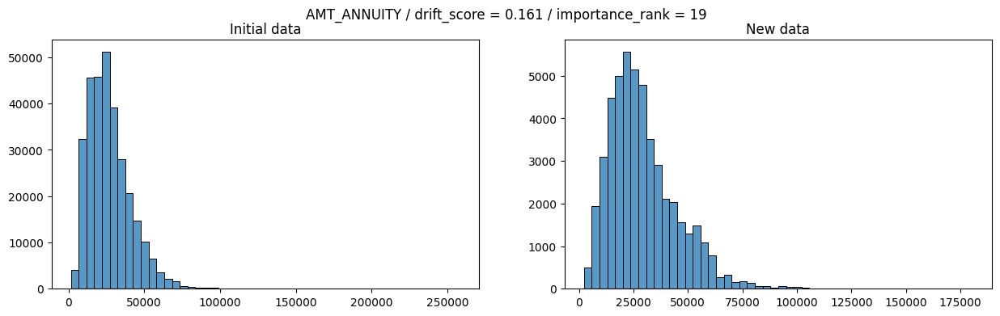

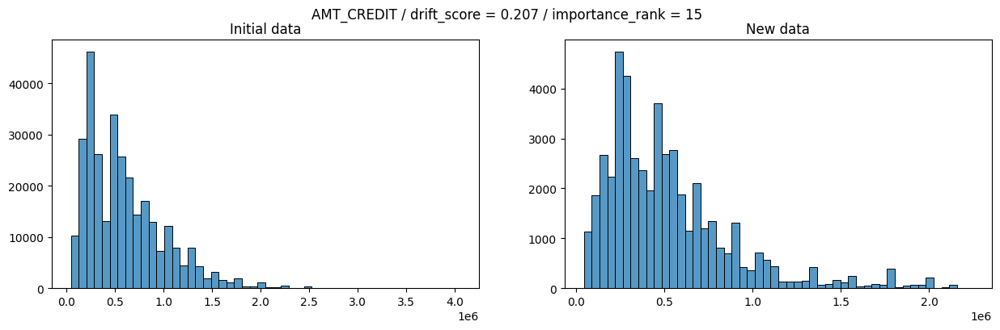

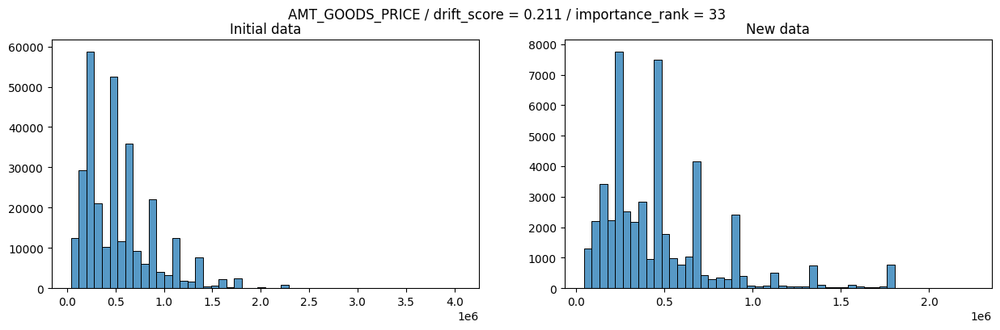

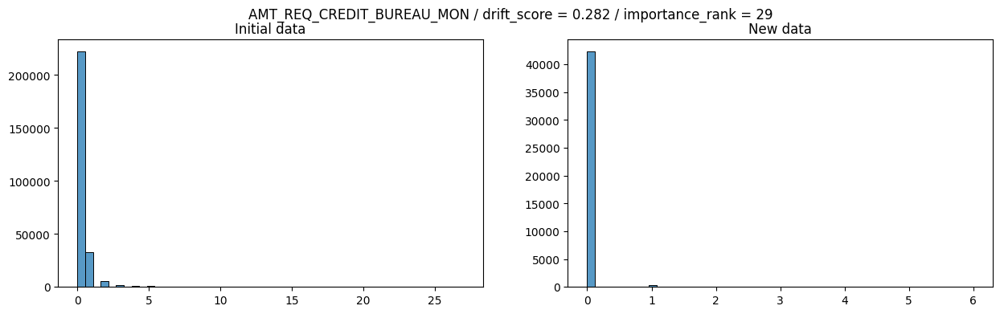

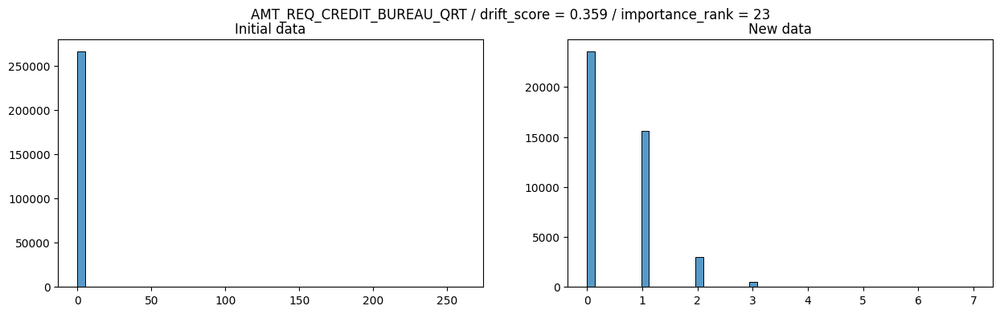

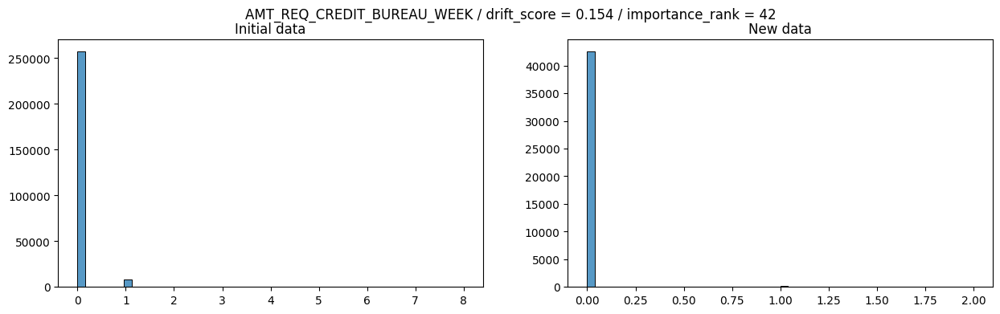

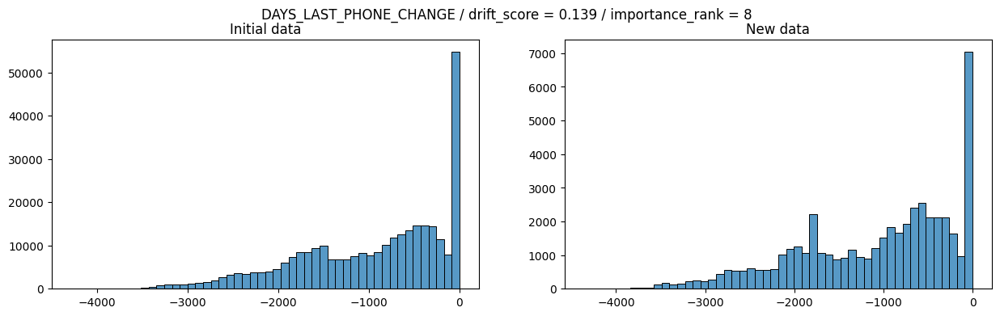

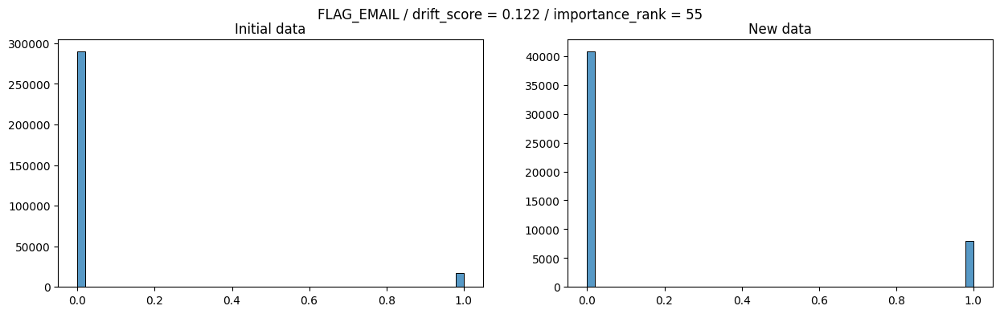

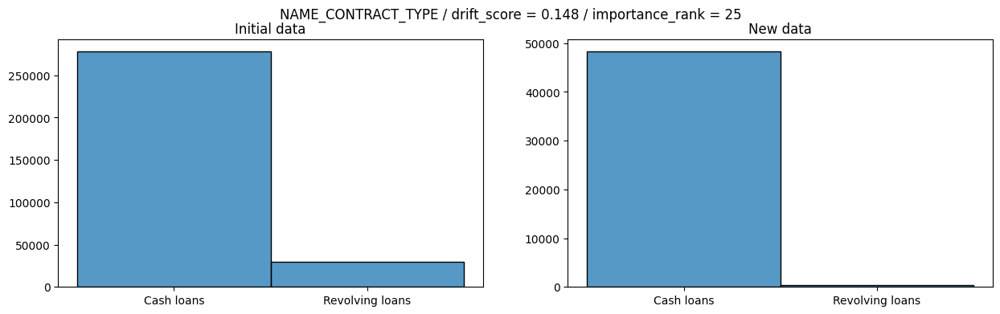

In [485]:
for columns in drift_col:
    fig, ax = plt.subplots(1,2, figsize = (15, 4))
    sns.histplot(train[columns], bins = 50, ax = ax[0])
    ax[0].set_title('Initial data')
    ax[0].set_xlabel('')
    ax[0].set_ylabel('')
    sns.histplot(test[columns], bins = 50, ax = ax[1])
    ax[1].set_title('New data')
    ax[1].set_xlabel('')
    ax[1].set_ylabel('')
    plt.suptitle(f'{columns} / drift_score = {dico_drift[columns]} / importance_rank = {list(df_feat.index).index(columns)}')
    plt.show()

In [3]:
def reduce_memory_usage(df):
  
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [15]:
col_ref = col + ['TARGET', 'proba', 'SK_ID_CURR']

In [19]:
app_train = reduce_memory_usage(train_test[col + ['TARGET', 'proba', 'SK_ID_CURR']])

Memory usage of dataframe is 56.60 MB
Memory usage after optimization is: 54.84 MB
Decreased by 3.1%


In [20]:
app_test = reduce_memory_usage(test_test[col + ['proba', 'SK_ID_CURR']])

Memory usage of dataframe is 8.93 MB
Memory usage after optimization is: 8.65 MB
Decreased by 3.1%


In [37]:
X_samp, train_samp = train_test_split(app_train, test_size = 0.24, stratify = train_test[['TARGET']])
end_mem = train_samp.memory_usage().sum() / 1024**2
print('Finale memory usage for train: {:.2f} MB'.format(end_mem))

Finale memory usage for train: 13.72 MB


In [38]:
train_samp.to_csv('new_train.csv')

In [30]:
app_test.to_csv('application_test.csv')